# Recommended Installations

#### pip install plotly
#### pip install seaborn==0.11.0

# Recommended Installations

#### pip install plotly
#### pip install seaborn==0.11.0

# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import plotly.express as px
import plotly.express as go
from scipy.stats.mstats import winsorize
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 300)
sns.__version__

'0.11.0'

# Importing and Reading CSV Files

In [2]:
df_250_countries = pd.read_csv("data/250 Country Data.csv")
df_life_expectancy = pd.read_csv("data/Life Expectancy Data.csv")
df_worldHappiness_2015 = pd.read_csv("data/Happiness_Dataset/2015.csv")
df_worldHappiness_2016 = pd.read_csv("data/Happiness_Dataset/2016.csv")
df_worldHappiness_2017 = pd.read_csv("data/Happiness_Dataset/2017.csv")
df_worldHappiness_2018 = pd.read_csv("data/Happiness_Dataset/2018.csv")
df_worldHappiness_2019 = pd.read_csv("data/Happiness_Dataset/2019.csv")

# Exploring Data

# All Countries Data

In [3]:
df_250_countries.drop(df_250_countries.columns[df_250_countries.columns.str.contains('unnamed',case = False)],axis = 1, inplace = True)
df_250_countries.head(-5)
# all250Countries_df.shape

,name,region,subregion,population,area,gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,652230.00,27.8,3.1% (2013 est.).,28.1% (2000 est.),6.8% (2013 est.).,35% (2008 est.).
1,Åland Islands,Europe,Northern Europe,28875,1580.00,NaN,NaN,NaN,NaN,NaN
2,Albania,Europe,Southern Europe,2886026,28748.00,34.5,.7% (2013 est.).,98.7% (2011 est.),1.7% (2013 est.).,16.9% official rate (2013 est.). Note: These a...
3,Algeria,Africa,Northern Africa,40400000,2381741.00,35.3,3.1%.,79%,3.9%.,10.3%.
4,American Samoa,Oceania,Polynesia,57100,199.00,NaN,3%.,97% (1980 est.),NaN,NaN
5,Andorra,Europe,Southern Europe,78014,468.00,NaN,-1.6%.,100%,1.1%.,4% (2012 est.).
6,Angola,Africa,Middle Africa,25868000,1246700.00,58.6,5.6%.,70.4% (2011 est.),8.9%.,n.a.
7,Anguilla,Americas,Caribbean,13452,91.00,NaN,2.8%.,NaN,3.1% (2013).,8% (2002).
8,Antarctica,Polar,NaN,1000,14000000.00,NaN,NaN,NaN,NaN,NaN
9,Antigua and Barbuda,Americas,Caribbean,86295,442.00,NaN,1.7% (2012 est.).,99% (2011 est.),3% (2013 est.).,11% (2001 est.).


### Renaming Columns For Easier Access

In [4]:

df_250_countries.rename(columns={"name":"Name","region":"Region","area":"Area",
                   "gini":"Gini",'subregion':"Subregion","population":"Population"},inplace=True)
df_250_countries.head(1)

,Name,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,652230.0,27.8,3.1% (2013 est.).,28.1% (2000 est.),6.8% (2013 est.).,35% (2008 est.).


# Dataset Analysis

## Column Descriptions
- Name (Nominal) - The name of country in which the indicators are from (i.e. United States of America or Congo)
- Region (Nominal) - The name of region in which the country lies.
- Subregion (Nominal) - The name of subregion which is a division of the region.
- Population (Ratio) - The population count of the country.
- Area (Ratio) - The area of the country.
- Gini (Ratio) - The measure of the distribution of income across a population.
- Real Growth Rating(%) (Ratio) - The rate at which a nation's Gross Domestic product (GDP) changes/grows from one year to another.
- Literacy Rate(%) (Ratio) - The percentage of the population that can read and write.
- Inflation(%) (Ratio) - The percentage that represents the decline of purchasing power of a given currency over time.
- Unemployement(%) (Ratio) - The percentage of the country that does not have a job.

In [5]:
#Removing strings and invalid characters from {Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)}

Growth_subdata = df_250_countries['Real Growth Rating(%)']
def findPer(x):
    if(x!=x or 'n.a' in x):
        return np.NaN
    else:
        return float(re.findall('[\d.-]*%', x)[0][:-1])
Growth_series = Growth_subdata.apply(findPer)
df_250_countries['Real Growth Rating(%)'] = Growth_series

Literacy_subdata = df_250_countries['Literacy Rate(%)']
def findPer(x):
    if(x!=x or 'n.a' in x):
        return np.NaN
    else:
        return float(re.findall('[\d.-]*%', x)[0][:-1])
Literacy_series = Literacy_subdata.apply(findPer)
df_250_countries['Literacy Rate(%)'] = Literacy_series

Inflation_subdata = df_250_countries['Inflation(%)']
def findPer(x):
    if(x!=x or 'n.a' in x):
        return np.NaN
    else:
        return float(re.findall('[\d.-]*%', x)[0][:-1])
Inflation_series = Inflation_subdata.apply(findPer)
df_250_countries['Inflation(%)'] = Inflation_series

Unemployement_subdata = df_250_countries['Unemployement(%)']
def findPer(x):
    if(x!=x or 'n.a' in x or 'N.A' in x ):
        return np.NaN
    if(not('%' in x)):
        return np.NaN
    else:
        un_refined_result = re.findall('[\s\d.-]*%', x)
        semi_refined_result = un_refined_result[0]
        while(True):
            if(semi_refined_result[-1].isnumeric()):
                break
            semi_refined_result = semi_refined_result[:-1]
        return float(semi_refined_result)
Unemployement_series =Unemployement_subdata.apply(findPer)
df_250_countries['Unemployement(%)'] = Unemployement_series

df_250_countries

,Name,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,652230.00,27.8,3.10,28.10,6.8,35.00
1,Åland Islands,Europe,Northern Europe,28875,1580.00,NaN,NaN,NaN,NaN,NaN
2,Albania,Europe,Southern Europe,2886026,28748.00,34.5,0.70,98.70,1.7,16.90
3,Algeria,Africa,Northern Africa,40400000,2381741.00,35.3,3.10,79.00,3.9,10.30
4,American Samoa,Oceania,Polynesia,57100,199.00,NaN,3.00,97.00,NaN,NaN
5,Andorra,Europe,Southern Europe,78014,468.00,NaN,-1.60,100.00,1.1,4.00
6,Angola,Africa,Middle Africa,25868000,1246700.00,58.6,5.60,70.40,8.9,NaN
7,Anguilla,Americas,Caribbean,13452,91.00,NaN,2.80,NaN,3.1,8.00
8,Antarctica,Polar,NaN,1000,14000000.00,NaN,NaN,NaN,NaN,NaN
9,Antigua and Barbuda,Americas,Caribbean,86295,442.00,NaN,1.70,99.00,3.0,11.00


In [6]:
# Information about the columns data-types
df_250_countries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Name                   250 non-null    object 
 1   Region                 248 non-null    object 
 2   Subregion              247 non-null    object 
 3   Population             250 non-null    int64  
 4   Area                   240 non-null    float64
 5   Gini                   153 non-null    float64
 6   Real Growth Rating(%)  165 non-null    float64
 7   Literacy Rate(%)       172 non-null    float64
 8   Inflation(%)           163 non-null    float64
 9   Unemployement(%)       149 non-null    float64
dtypes: float64(6), int64(1), object(3)
memory usage: 19.7+ KB


In [7]:
# Showing statistics for every column
df_250_countries.describe()

,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
count,2.500000e+02,2.400000e+02,153.000000,165.000000,172.000000,163.000000,149.000000
mean,2.939655e+07,6.262107e+05,40.177124,3.609697,84.408314,4.383436,14.770671
std,1.244578e+08,1.950028e+06,9.265119,4.588486,19.212786,4.056792,15.532975
min,0.000000e+00,4.400000e-01,24.000000,-14.500000,19.100000,-2.700000,0.000000
25%,2.029030e+05,1.533250e+03,33.700000,1.600000,73.825000,1.800000,5.300000
50%,4.648734e+06,7.100650e+04,38.600000,3.400000,93.600000,3.200000,9.300000
75%,1.803955e+07,4.146432e+05,46.200000,5.100000,98.725000,5.950000,17.500000
max,1.377422e+09,1.712444e+07,65.800000,45.000000,100.000000,25.000000,90.000000


In [8]:
# Collecting the number of nulls in each column
df_250_countries.isnull().sum()

Name                       0
Region                     2
Subregion                  3
Population                 0
Area                      10
Gini                      97
Real Growth Rating(%)     85
Literacy Rate(%)          78
Inflation(%)              87
Unemployement(%)         101
dtype: int64

In [9]:
# Null values as a percentage per column ----------> Inorder to know which data needs to be dropped
df_250_countries.isnull().sum()*100/df_250_countries.isnull().count()

Name                      0.0
Region                    0.8
Subregion                 1.2
Population                0.0
Area                      4.0
Gini                     38.8
Real Growth Rating(%)    34.0
Literacy Rate(%)         31.2
Inflation(%)             34.8
Unemployement(%)         40.4
dtype: float64

### From the analysis of the null value percentages and the statistics of each column:
- The Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%) columns have a huge number of null values where the null percentage starts from 31.2% and reaches 40.4%.
- Probably there are some low outliers disturbing the calculations

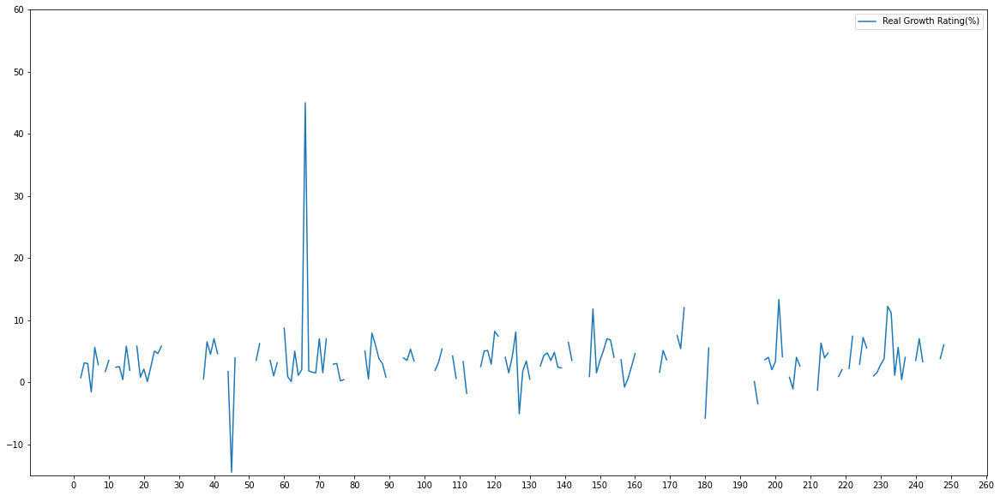

In [10]:
# Real Growth Rating(%) Before Interpolation

df_Growth = df_250_countries[['Real Growth Rating(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-15, 60) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Growth)
plt.show()

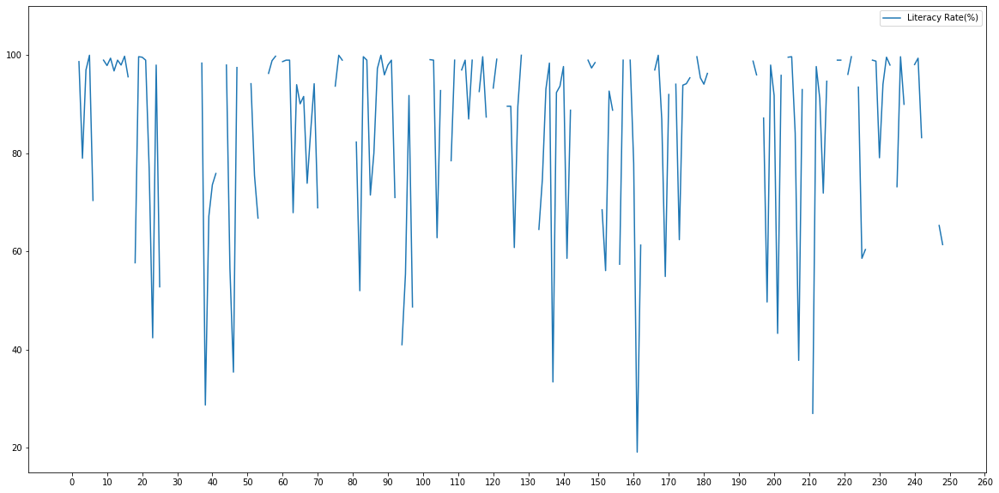

In [11]:
# Literacy Rate(%) Before Interpolation

df_Literacy = df_250_countries[['Literacy Rate(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(15, 110) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Literacy)
plt.show()

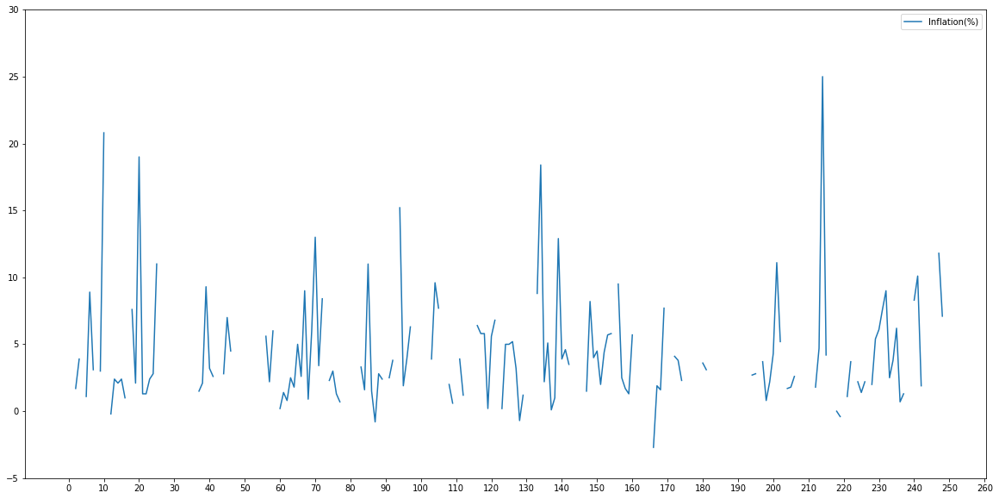

In [12]:
# Inflation(%) Before Interpolation

df_Inflation = df_250_countries[['Inflation(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-5, 30) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Inflation)
plt.show()

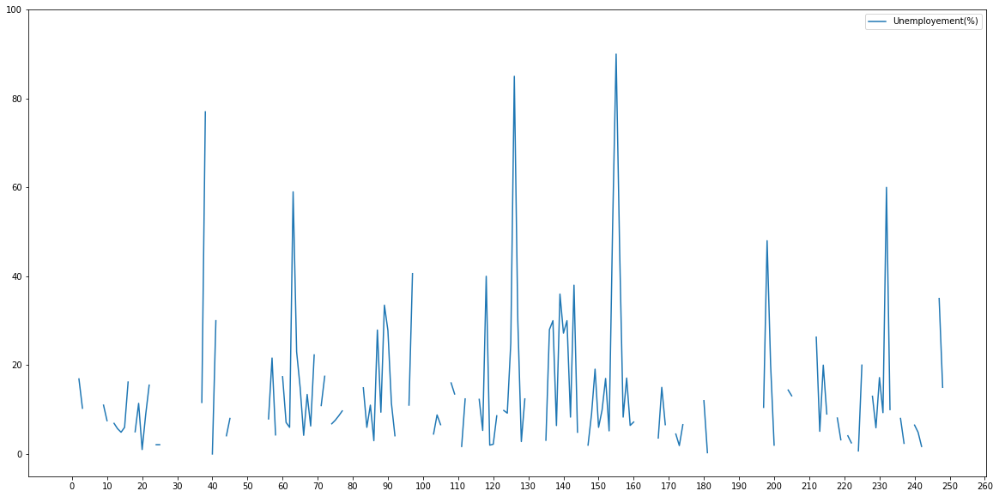

In [13]:
# Unemployement(%) Before Interpolation

df_Unemployement = df_250_countries[['Unemployement(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-5, 100) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Unemployement)
plt.show()

In [14]:
# Defining the data with null values that needs to be filled 
country_list = df_250_countries.Name.unique()
fill_list = ['Real Growth Rating(%)','Literacy Rate(%)','Inflation(%)','Unemployement(%)']

In [15]:
for country in country_list:
    df_250_countries.loc[df_250_countries['Name'] == country,fill_list] = df_250_countries.loc[df_250_countries['Name'] == country,fill_list].interpolate()
    
# Drop remaining null values after interpolation.
# df_life_expectancy.dropna(inplace=True)

In [16]:
df_250_countries = df_250_countries.fillna(df_250_countries.mean())

In [17]:
df_250_countries.isnull().sum()

Name                     0
Region                   2
Subregion                3
Population               0
Area                     0
Gini                     0
Real Growth Rating(%)    0
Literacy Rate(%)         0
Inflation(%)             0
Unemployement(%)         0
dtype: int64

In [18]:
df_250_countries.describe()

,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
count,2.500000e+02,2.500000e+02,250.000000,250.000000,250.000000,250.000000,250.000000
mean,2.939655e+07,6.262107e+05,40.177124,3.609697,84.408314,4.383436,14.770671
std,1.244578e+08,1.910470e+06,7.238909,3.723846,15.921674,3.272206,11.975284
min,0.000000e+00,4.400000e-01,24.000000,-14.500000,19.100000,-2.700000,0.000000
25%,2.029030e+05,2.176500e+03,36.525000,2.600000,84.408314,2.425000,8.000000
50%,4.648734e+06,8.523550e+04,40.177124,3.609697,84.408314,4.383436,14.770671
75%,1.803955e+07,5.015190e+05,40.300000,3.975000,97.000000,4.383436,14.770671
max,1.377422e+09,1.712444e+07,65.800000,45.000000,100.000000,25.000000,90.000000


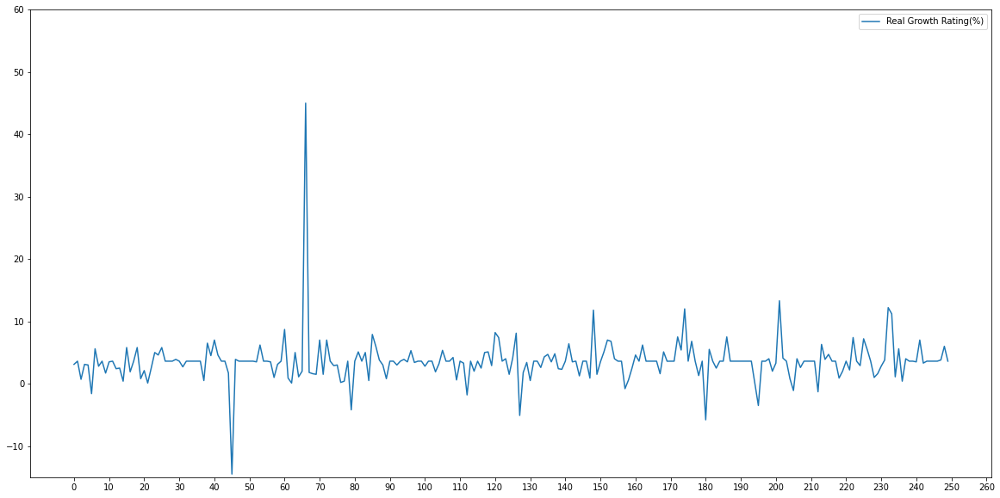

In [19]:
# Real Growth Rating(%) After Interpolation

df_Growth = df_250_countries[['Real Growth Rating(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-15, 60) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Growth)
plt.show()

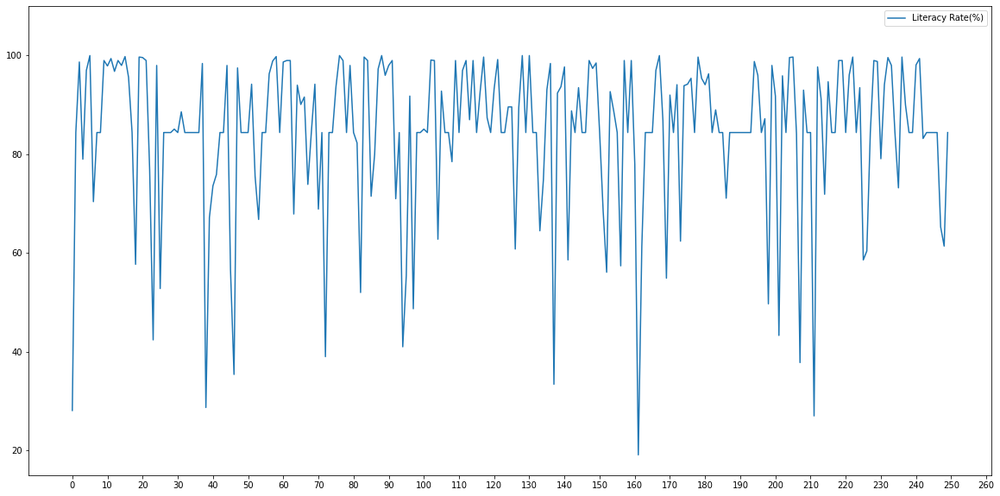

In [20]:
# Literacy Rate(%) After Interpolation

df_Literacy = df_250_countries[['Literacy Rate(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(15, 110) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Literacy)
plt.show()

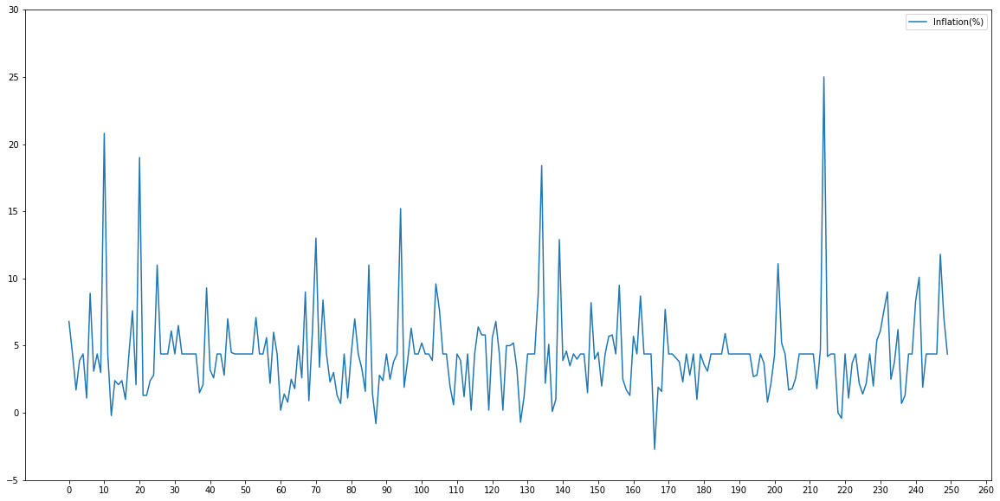

In [21]:
# Inflation(%) After Interpolation

df_Inflation = df_250_countries[['Inflation(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-5, 30) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Inflation)
plt.show()

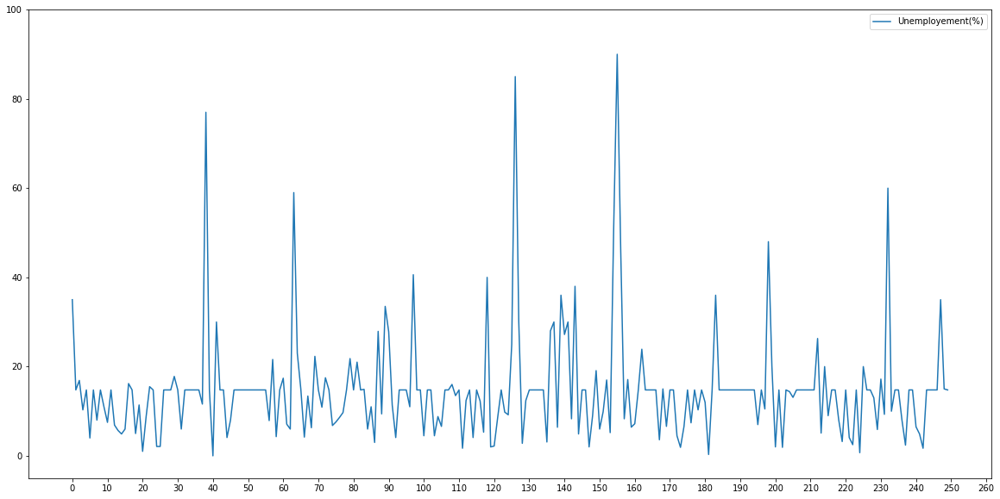

In [22]:
# Unemployement(%) After Interpolation

df_Unemployement = df_250_countries[['Unemployement(%)']]
plt.figure(figsize=(20,10))
plt.subplots_adjust(hspace=0.5)
plt.ylim(-5, 100) 
plt.xticks(np.arange(0, 280, 10))
sns.lineplot(data=df_Unemployement)
plt.show()

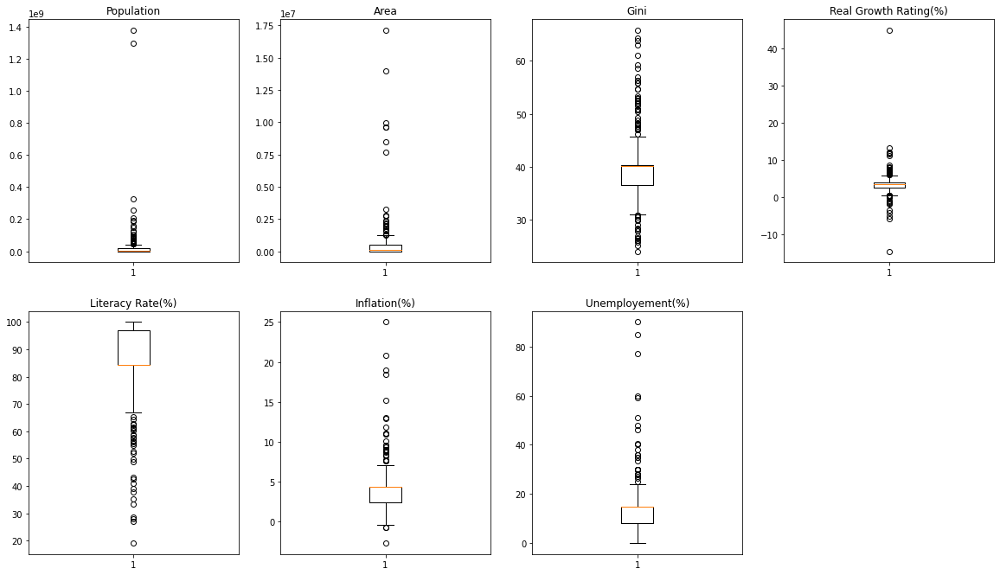

In [23]:
# Create a dictionary of columns.
col_dict = {'Population':1,'Area':2,'Gini':3,'Real Growth Rating(%)':4,'Literacy Rate(%)':5,'Inflation(%)':6,'Unemployement(%)':7}

# Detect outliers in each variable using box plots.
plt.figure(figsize=(20,30))

for variable,i in col_dict.items():
                     plt.subplot(5,4,i)
                     plt.boxplot(df_250_countries[variable],whis=1.5)
                     plt.title(variable)

plt.show()

## From the analysis of Boxplots:

- Just as we assumed the data has lots of outliers that corrupts the statistics of the dataset
- Following we will try to remove these outliers and see the data after being cleaned

In [24]:
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))

In [25]:
col_dict = ['Population','Area','Gini','Real Growth Rating(%)','Literacy Rate(%)','Inflation(%)','Unemployement(%)']
for col in col_dict:
    outlier_count(col,df_250_countries)

---------------Population---------------
Number of outliers: 30
Percent of data that is outlier: 12.0%
---------------Area---------------
Number of outliers: 23
Percent of data that is outlier: 9.2%
---------------Gini---------------
Number of outliers: 61
Percent of data that is outlier: 24.4%
---------------Real Growth Rating(%)---------------
Number of outliers: 47
Percent of data that is outlier: 18.8%
---------------Literacy Rate(%)---------------
Number of outliers: 31
Percent of data that is outlier: 12.4%
---------------Inflation(%)---------------
Number of outliers: 30
Percent of data that is outlier: 12.0%
---------------Unemployement(%)---------------
Number of outliers: 26
Percent of data that is outlier: 10.4%


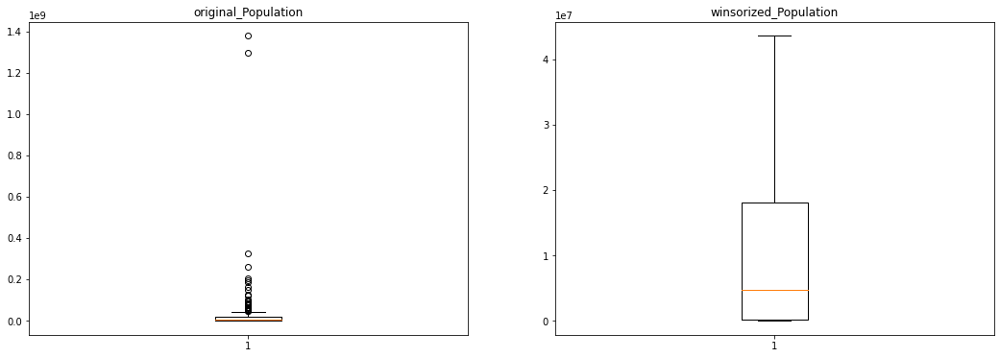

In [26]:
# Removing Outliers in the variables using Winsorization technique.
# Winsorize Population
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Population = df_250_countries['Population']
plt.boxplot(original_Population)
plt.title("original_Population")

plt.subplot(1,2,2)
winsorized_Population = winsorize(df_250_countries['Population'],(0,0.12))
plt.boxplot(winsorized_Population)
plt.title("winsorized_Population")

plt.show()

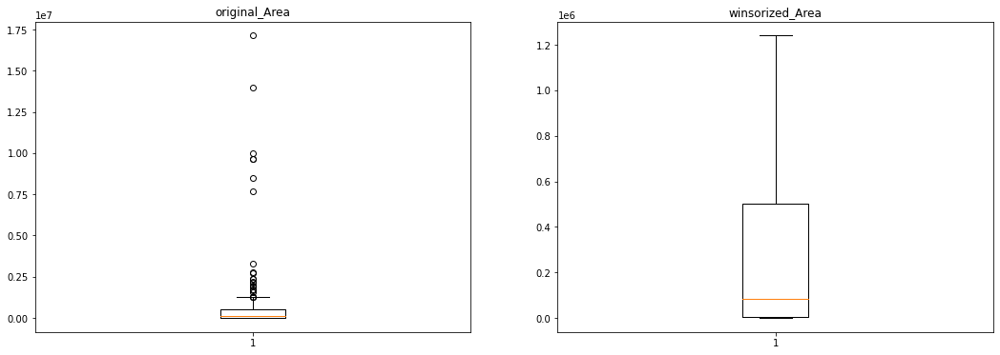

In [27]:
# Winsorize Area
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Area = df_250_countries['Area']
plt.boxplot(original_Area)
plt.title("original_Area")

plt.subplot(1,2,2)
winsorized_Area = winsorize(df_250_countries['Area'],(0,0.099))
plt.boxplot(winsorized_Area)
plt.title("winsorized_Area")

plt.show()

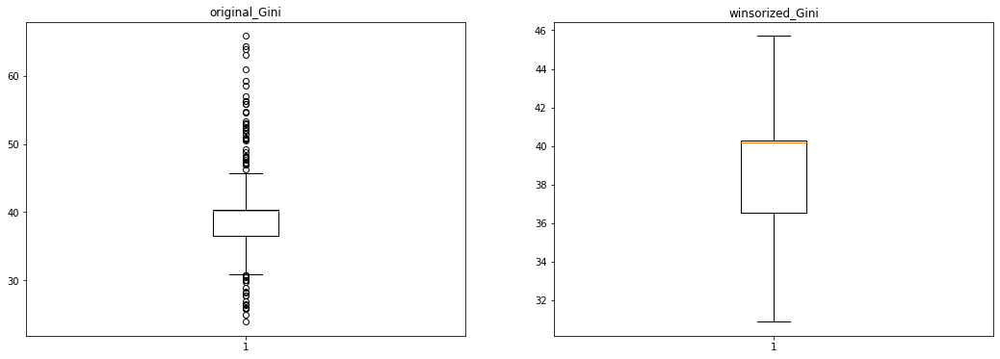

In [28]:
# Winsorize Gini
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Gini = df_250_countries['Gini']
plt.boxplot(original_Gini)
plt.title("original_Gini")

plt.subplot(1,2,2)
winsorized_Gini = winsorize(df_250_countries['Gini'],(0.088,0.157))
plt.boxplot(winsorized_Gini)
plt.title("winsorized_Gini")

plt.show()

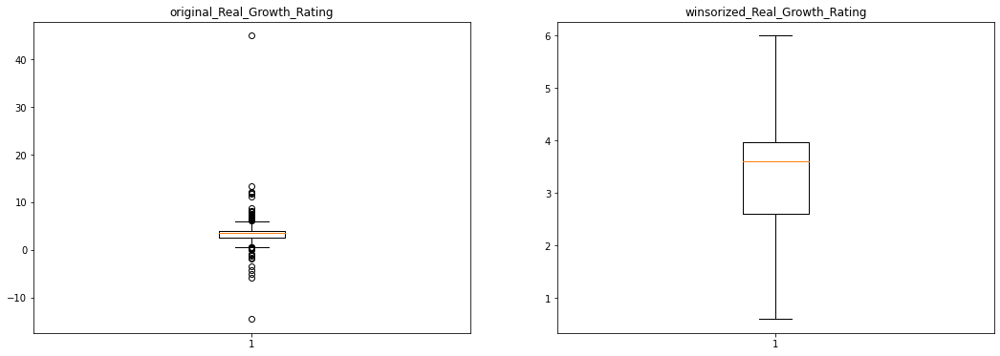

In [29]:
# Winsorize Real Growth Rating(%)
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Real_Growth_Rating = df_250_countries['Real Growth Rating(%)']
plt.boxplot(original_Real_Growth_Rating)
plt.title("original_Real_Growth_Rating")

plt.subplot(1,2,2)
winsorized_Real_Growth_Rating = winsorize(df_250_countries['Real Growth Rating(%)'],(0.08,0.11))
plt.boxplot(winsorized_Real_Growth_Rating)
plt.title("winsorized_Real_Growth_Rating")

plt.show()

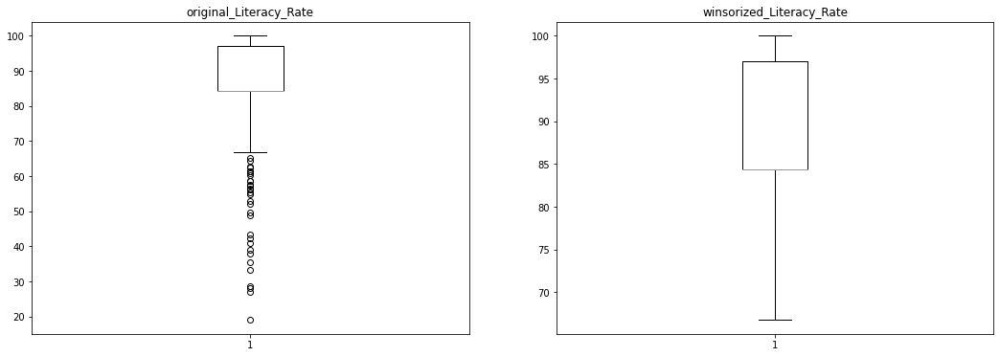

In [30]:
# Winsorize Literacy Rate(%)
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Literacy_Rate = df_250_countries['Literacy Rate(%)']
plt.boxplot(original_Literacy_Rate)
plt.title("original_Literacy_Rate")

plt.subplot(1,2,2)
winsorized_Literacy_Rate = winsorize(df_250_countries['Literacy Rate(%)'],(0.124,0))
plt.boxplot(winsorized_Literacy_Rate)
plt.title("winsorized_Literacy_Rate")

plt.show()

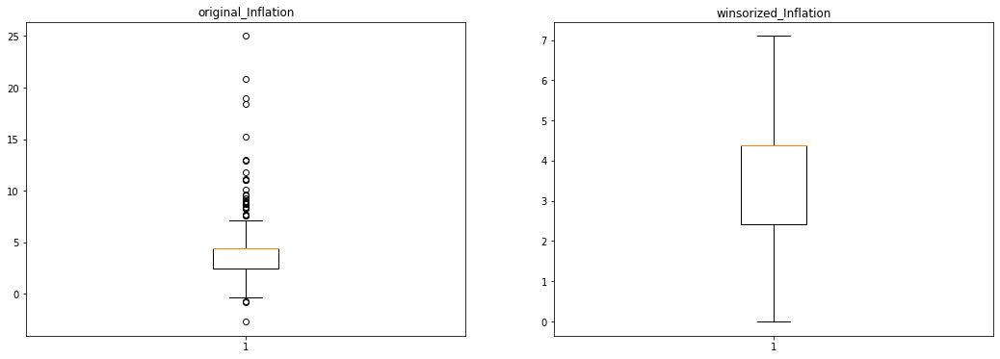

In [31]:
# Winsorize Inflation(%)
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Inflation = df_250_countries['Inflation(%)']
plt.boxplot(original_Inflation)
plt.title("original_Inflation")

plt.subplot(1,2,2)
winsorized_Inflation = winsorize(df_250_countries['Inflation(%)'],(0.02,0.11))
plt.boxplot(winsorized_Inflation)
plt.title("winsorized_Inflation")

plt.show()

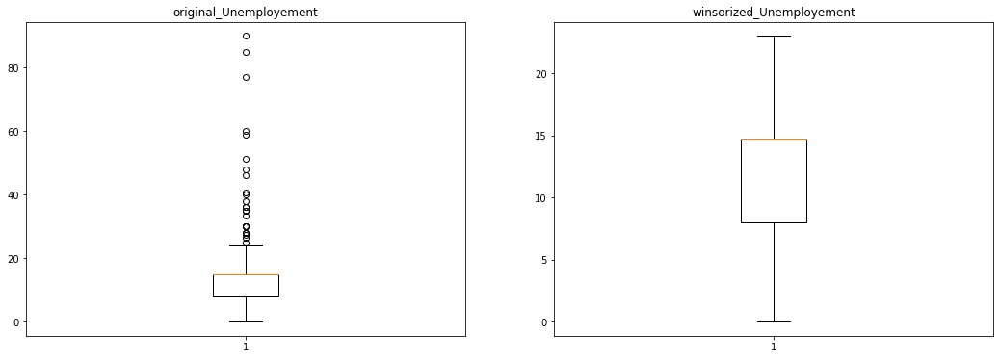

In [32]:
# Winsorize Unemployement(%)
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Unemployement = df_250_countries['Unemployement(%)']
plt.boxplot(original_Unemployement)
plt.title("original_Unemployement")

plt.subplot(1,2,2)
winsorized_Unemployement = winsorize(df_250_countries['Unemployement(%)'],(0,0.11))
plt.boxplot(winsorized_Unemployement)
plt.title("winsorized_Unemployement")

plt.show()

In [33]:
# Check number of Outliers after Winsorization for each variable.
win_list = [winsorized_Population,winsorized_Area,winsorized_Gini,winsorized_Real_Growth_Rating,winsorized_Literacy_Rate,winsorized_Inflation,winsorized_Unemployement]
for variable in win_list:
    q75, q25 = np.percentile(variable, [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    
    print("Number of outliers after winsorization : {}".format(len(np.where((variable > max_val) | (variable < min_val))[0])))

Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0


In [34]:
# Adding winsorized variables to the data frame.
df_250_countries['winsorized_Population'] = winsorized_Population
df_250_countries['winsorized_Area'] = winsorized_Area
df_250_countries['winsorized_Gini'] = winsorized_Gini
df_250_countries['winsorized_Real_Growth_Rating(%)'] = winsorized_Real_Growth_Rating
df_250_countries['winsorized_Literacy_Rate(%)'] = winsorized_Literacy_Rate
df_250_countries['winsorized_Inflation(%)'] = winsorized_Inflation
df_250_countries['winsorized_Unemployement(%)'] = winsorized_Unemployement

In [35]:
df_250_countries.describe()

,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),winsorized_Population,winsorized_Area,winsorized_Gini,winsorized_Real_Growth_Rating(%),winsorized_Literacy_Rate(%),winsorized_Inflation(%),winsorized_Unemployement(%)
count,2.500000e+02,2.500000e+02,250.000000,250.000000,250.000000,250.000000,250.000000,2.500000e+02,2.500000e+02,250.000000,250.000000,250.000000,250.000000,250.000000
mean,2.939655e+07,6.262107e+05,40.177124,3.609697,84.408314,4.383436,14.770671,1.175920e+07,3.043449e+05,39.267924,3.429297,86.560994,3.939036,12.789071
std,1.244578e+08,1.910470e+06,7.238909,3.723846,15.921674,3.272206,11.975284,1.523341e+07,4.113392e+05,4.452173,1.549243,10.729188,1.910720,5.961222
min,0.000000e+00,4.400000e-01,24.000000,-14.500000,19.100000,-2.700000,0.000000,0.000000e+00,4.400000e-01,30.900000,0.600000,66.800000,0.000000,0.000000
25%,2.029030e+05,2.176500e+03,36.525000,2.600000,84.408314,2.425000,8.000000,2.029030e+05,2.176500e+03,36.525000,2.600000,84.408314,2.425000,8.000000
50%,4.648734e+06,8.523550e+04,40.177124,3.609697,84.408314,4.383436,14.770671,4.648734e+06,8.523550e+04,40.177124,3.609697,84.408314,4.383436,14.770671
75%,1.803955e+07,5.015190e+05,40.300000,3.975000,97.000000,4.383436,14.770671,1.803955e+07,5.015190e+05,40.300000,3.975000,97.000000,4.383436,14.770671
max,1.377422e+09,1.712444e+07,65.800000,45.000000,100.000000,25.000000,90.000000,4.359040e+07,1.240192e+06,45.700000,6.000000,100.000000,7.100000,23.000000


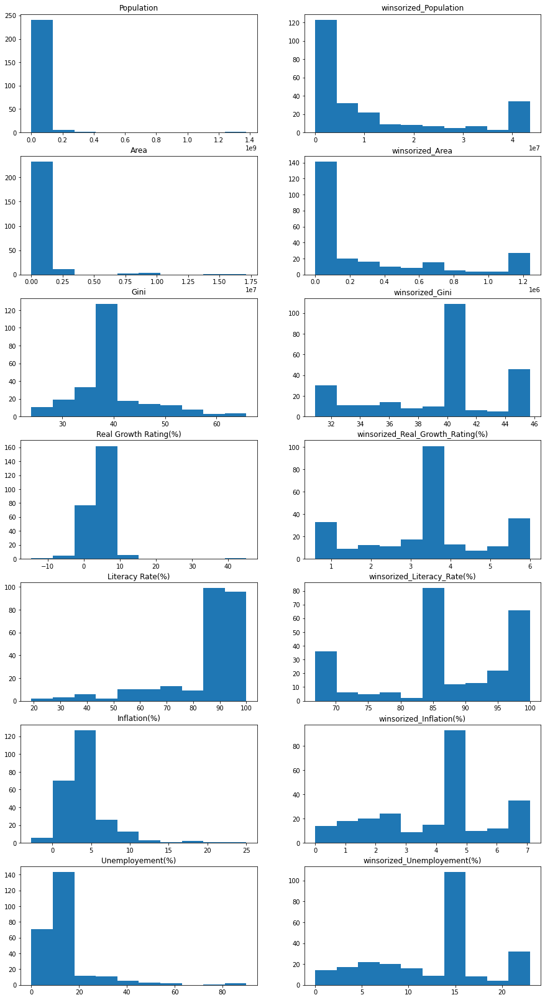

In [36]:
# Distribution of each numerical variable after removing outliers.
all_col = ['Population','winsorized_Population','Area','winsorized_Area','Gini','winsorized_Gini',
           'Real Growth Rating(%)','winsorized_Real_Growth_Rating(%)',
           'Literacy Rate(%)', 'winsorized_Literacy_Rate(%)',
           'Inflation(%)','winsorized_Inflation(%)',
           'Unemployement(%)','winsorized_Unemployement(%)']

plt.figure(figsize=(15,75))

for i in range(len(all_col)):
    plt.subplot(18,2,i+1)
    plt.hist(df_250_countries[all_col[i]])
    plt.title(all_col[i])

plt.show()


# Life Expectancy Data

In [37]:
print(df_life_expectancy.shape)
df_life_expectancy.head(-5)

(2938, 22)


,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2928,Zimbabwe,2009,Developing,50.0,587.0,30,4.64,1.040021,73.0,853,29.0,45,69.0,6.26,73.0,18.1,65.824121,1381599.0,7.5,7.4,0.419,9.9
2929,Zimbabwe,2008,Developing,48.2,632.0,30,3.56,20.843429,75.0,0,28.6,46,75.0,4.96,75.0,20.5,325.678573,13558469.0,7.8,7.8,0.421,9.7
2930,Zimbabwe,2007,Developing,46.6,67.0,29,3.88,29.814566,72.0,242,28.2,46,73.0,4.47,73.0,23.7,396.998217,1332999.0,8.2,8.2,0.414,9.6
2931,Zimbabwe,2006,Developing,45.4,7.0,28,4.57,34.262169,68.0,212,27.9,45,71.0,5.12,7.0,26.8,414.796232,13124267.0,8.6,8.6,0.408,9.5


In [38]:
df_life_expectancy.tail()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.0,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.0,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.0,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,25.5,39,78.0,7.10,78.0,43.5,547.358879,12222251.0,11.0,11.2,0.434,9.8


### Renaming Columns For Easier Access

In [39]:
# Renaming thinness_1to19_years to thinness_10to19_years since it is the column representing these range of ages
df_life_expectancy.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Expenditure","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_10to19_years"," thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Composition_Of_Resources",
                   "Total expenditure":"Total_Expenditure"},inplace=True)

# Dataset Analysis

## Column Descriptions
- country (Nominal) - the country in which the indicators are from (i.e. United States of America or Congo)
- year (Ordinal) - the calendar year the indicators are from (ranging from 2000 to 2015)
- status (Nominal) - whether a country is considered to be 'Developing' or 'Developed' by WHO standards
- life_expectancy (Ratio) - the life expectancy of people in years for a particular country and year
- adult_mortality (Ratio) - the adult mortality rate per 1000 population (i.e. number of people dying between 15 and 60 years per 1000 population)
- infant_deaths (Ratio) - number of infant deaths per 1000 population
- alcohol (Ratio) - a country's alcohol consumption rate measured as liters of pure alcohol consumption per capita
- percentage_expenditure (Ratio) - expenditure on health as a percentage of Gross Domestic Product (gdp)
- hepatitis_b (Ratio) - number of 1 year olds with Hepatitis B immunization over all 1 year olds in population
- measles (Ratio) - number of reported Measles cases per 1000 population
- bmi (Interval/Ordinal) - average Body Mass Index (BMI) of a country's total population
- under-five_deaths (Ratio) - number of people under the age of five deaths per 1000 population
- polio (Ratio) - number of 1 year olds with Polio immunization over the number of all 1 year olds in population
- total_expenditure (Ratio) - government expenditure on health as a percentage of total government expenditure
- diphtheria (Ratio) - Diphtheria tetanus toxoid and pertussis (DTP3) immunization rate of 1 year olds
- hiv/aids (Ratio) - deaths per 1000 live births caused by HIV/AIDS for people under 5
- gdp (Ratio) - Gross Domestic Product per capita
- population (Ratio) - population of a country
- thinness_10-19_years (Ratio) - rate of thinness among people aged *10-19*
- thinness_5-9_years (Ratio) - rate of thinness among people aged 5-9
- income_composition_of_resources (Ratio) - Human Development Index in terms of income composition of resources
- schooling (Ratio) - average number of years of schooling of a population

In [40]:
# Information about the columns data-types
df_life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life_Expectancy                  2928 non-null   float64
 4   Adult_Mortality                  2928 non-null   float64
 5   Infant_Deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   Percentage_Expenditure           2938 non-null   float64
 8   HepatitisB                       2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  Under_Five_Deaths                2938 non-null   int64  
 12  Polio               

In [41]:
# Showing statistics for every column
df_life_expectancy.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [42]:
# Collecting the number of nulls in each column
df_life_expectancy.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life_Expectancy                     10
Adult_Mortality                     10
Infant_Deaths                        0
Alcohol                            194
Percentage_Expenditure               0
HepatitisB                         553
Measles                              0
BMI                                 34
Under_Five_Deaths                    0
Polio                               19
Total_Expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness_10to19_years               34
thinness_5to9_years                 34
Income_Composition_Of_Resources    167
Schooling                          163
dtype: int64

In [43]:
# Null values as a percentage per column ----------> Inorder to know which data needs to be dropped
df_life_expectancy.isnull().sum()*100/df_life_expectancy.isnull().count()

Country                             0.000000
Year                                0.000000
Status                              0.000000
Life_Expectancy                     0.340368
Adult_Mortality                     0.340368
Infant_Deaths                       0.000000
Alcohol                             6.603131
Percentage_Expenditure              0.000000
HepatitisB                         18.822328
Measles                             0.000000
BMI                                 1.157250
Under_Five_Deaths                   0.000000
Polio                               0.646698
Total_Expenditure                   7.692308
Diphtheria                          0.646698
HIV/AIDS                            0.000000
GDP                                15.248468
Population                         22.191967
thinness_10to19_years               1.157250
thinness_5to9_years                 1.157250
Income_Composition_Of_Resources     5.684139
Schooling                           5.547992
dtype: flo

### From the analysis of the null value percentages and the statistics of each column:
- It is obvious that there are multiple columns with unrealistic data such as Under_Five_Deaths , Adult_Mortality and Infant_Deaths, Where the minimum of these columns are either 1 or 0 which is impossible to happen throughout the years and the number of countries listed.
- Probably there are some low outliers disturbing the calculations 
- The Population column has a lot of inaccurate values that gives a false estimation to the minimum population (34) and a lot of null values making it 22% of the actual column which would let us drop the column if it null values couldn't be replaced properly.
- BMI having the minimum as 1 and max as 87 is weird giving lots of assumptions about the data (Outliers, False Values)


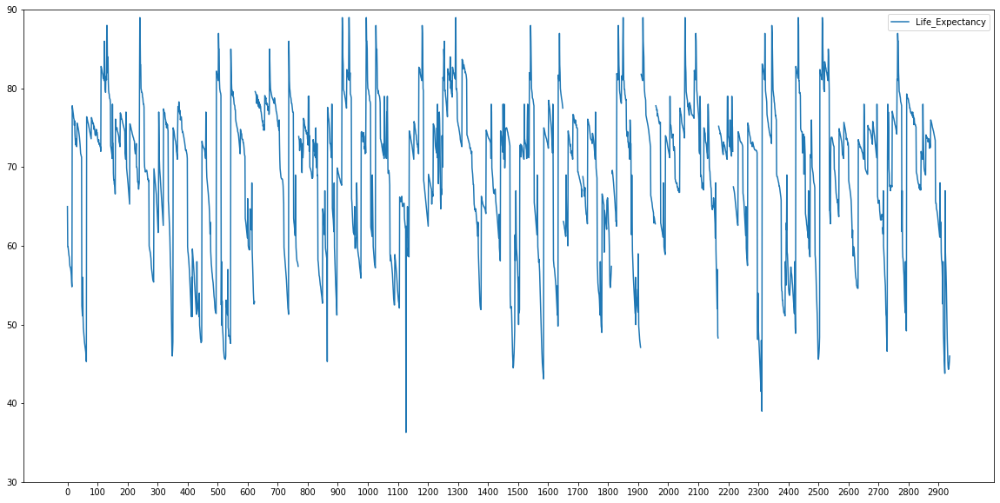

In [44]:
# Before Interpolation

# df_life_expectancy.plot(figsize=(5,80))
df_life = df_life_expectancy[['Life_Expectancy']]
plt.figure(figsize=(20,10))
# plt.margins(.05)
plt.subplots_adjust(hspace=0.5)
plt.ylim(30, 90) 
# plt.xlim(0, 3000) 
plt.xticks(np.arange(0, 3000, 100))
sns.lineplot(data=df_life)

plt.show()

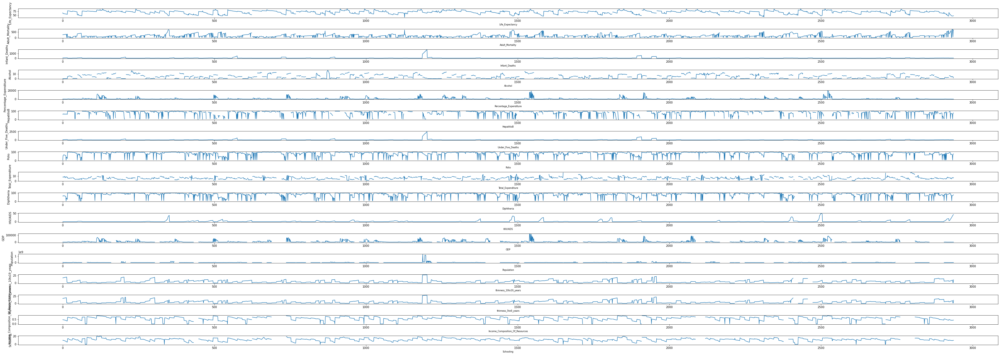

In [45]:
# Distoritions Before Interpolation

all_col = ['Life_Expectancy','Adult_Mortality','Infant_Deaths','Alcohol','Percentage_Expenditure','HepatitisB','Under_Five_Deaths','Polio','Total_Expenditure'
         ,'Diphtheria','HIV/AIDS','GDP',
         'Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources',
         'Schooling']

plt.figure(figsize=(50,20))

for i in range(len(all_col)):
    plt.tight_layout(pad=.01)
    plt.subplot(20,1,i+1)
    sns.lineplot(data=df_life_expectancy[all_col[i]])
    plt.xlabel(all_col[i], fontsize=8)

plt.show()


In [46]:
# Defining the data with null values that needs to be filled 
country_list = df_life_expectancy.Country.unique()
fill_list = ['Life_Expectancy','Adult_Mortality','Alcohol','HepatitisB','BMI','Polio','Total_Expenditure','Diphtheria','GDP','Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources','Schooling']

In [47]:
for country in country_list:
    df_life_expectancy.loc[df_life_expectancy['Country'] == country,fill_list] = df_life_expectancy.loc[df_life_expectancy['Country'] == country,fill_list].interpolate()
    
# Drop remaining null values after interpolation.
# df_life_expectancy.dropna(inplace=True)

In [48]:
# imputed_data = []
# for Year in list(df_life_expectancy.Year.unique()):
#     print(Year)
#     year_data = df_life_expectancy[df_life_expectancy.Year == Year].copy()
#     for col in list(year_data.columns)[3:]:
#         year_data[col] = year_data[col].fillna(year_data[col].dropna().mean()).copy()
#     imputed_data.append(year_data)
#     print(imputed_data)
# # df_life_expectancy = pd.concat(imputed_data).copy()
df_life_expectancy = df_life_expectancy.fillna(df_life_expectancy.mean())

In [49]:
df_life_expectancy.isnull().sum()

Country                            0
Year                               0
Status                             0
Life_Expectancy                    0
Adult_Mortality                    0
Infant_Deaths                      0
Alcohol                            0
Percentage_Expenditure             0
HepatitisB                         0
Measles                            0
BMI                                0
Under_Five_Deaths                  0
Polio                              0
Total_Expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness_10to19_years              0
thinness_5to9_years                0
Income_Composition_Of_Resources    0
Schooling                          0
dtype: int64

In [50]:
df_life_expectancy.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602166,738.251295,75.816392,2419.592240,38.321247,42.035739,82.307692,5.922512,82.075221,1.742103,7413.645004,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.507640,124.080302,117.926501,3.916446,1987.914858,27.907801,11467.272489,19.927677,160.445548,23.636677,2.409282,23.917022,5.077785,13152.080417,5.381546e+07,4.394535,4.482708,0.204820,3.264381
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,68.000000,0.000000,19.400000,0.000000,77.000000,4.340000,78.000000,0.100000,563.517201,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.000000,144.000000,3.000000,4.155000,64.912906,88.000000,17.000000,43.000000,4.000000,93.000000,5.920000,93.000000,0.100000,2874.075216,3.675929e+06,3.400000,3.400000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7413.645004,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


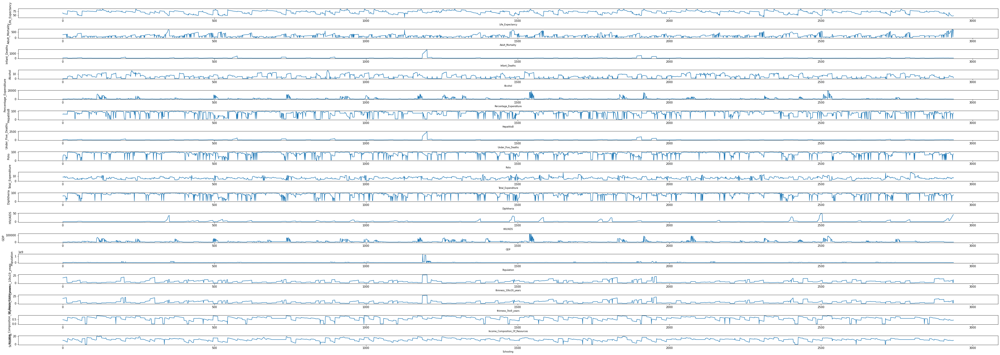

In [51]:
# No Distortions After Interpolation

all_col = ['Life_Expectancy','Adult_Mortality','Infant_Deaths','Alcohol','Percentage_Expenditure','HepatitisB','Under_Five_Deaths','Polio','Total_Expenditure'
         ,'Diphtheria','HIV/AIDS','GDP',
         'Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources',
         'Schooling']

plt.figure(figsize=(50,20))

for i in range(len(all_col)):
    plt.tight_layout(pad=.01)
    plt.subplot(20,1,i+1)
    sns.lineplot(data=df_life_expectancy[all_col[i]])
    plt.xlabel(all_col[i], fontsize=8)

plt.show()


### Detecting and Removing Outliers

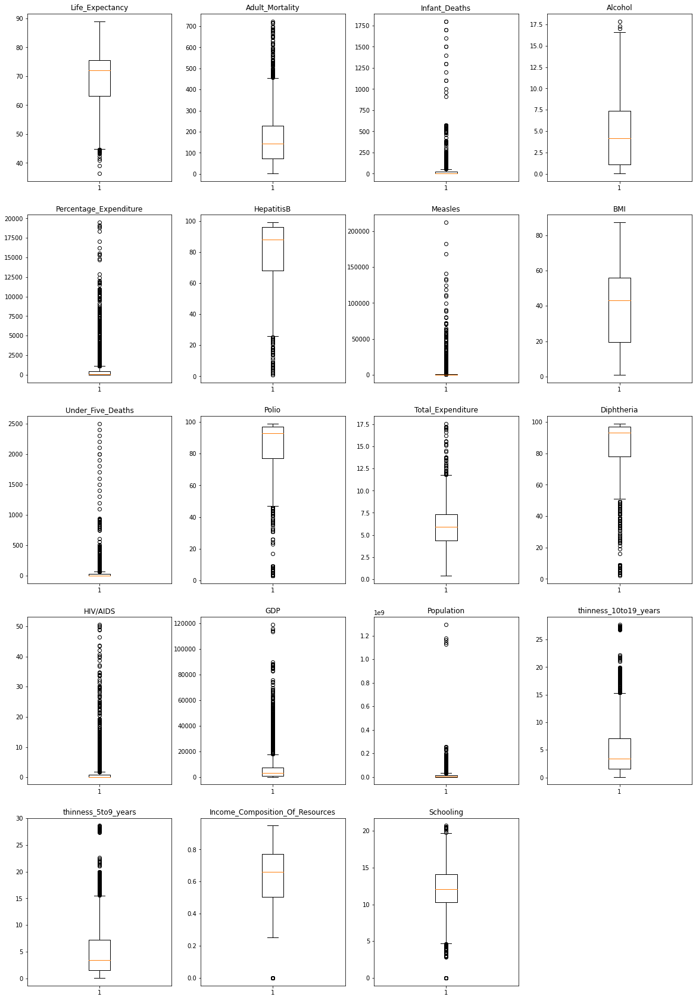

In [52]:
# Create a dictionary of columns.
col_dict = {'Life_Expectancy':1,'Adult_Mortality':2,'Infant_Deaths':3,'Alcohol':4,'Percentage_Expenditure':5,'HepatitisB':6,'Measles':7,'BMI':8,'Under_Five_Deaths':9,'Polio':10,'Total_Expenditure':11,'Diphtheria':12,'HIV/AIDS':13,'GDP':14,'Population':15,'thinness_10to19_years':16,'thinness_5to9_years':17,'Income_Composition_Of_Resources':18,'Schooling':19}

# Detect outliers in each variable using box plots.
plt.figure(figsize=(20,30))

for variable,i in col_dict.items():
                     plt.subplot(5,4,i)
                     plt.boxplot(df_life_expectancy[variable],whis=1.5)
                     plt.title(variable)

plt.show()

## From the analysis of Boxplots:

- Just as we assumed the data has lots of outliers that corrupts the statistics of the dataset
- Following we will try to remove these outliers and see the data after being cleaned

In [53]:
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))

In [54]:
col_dict = ['Life_Expectancy','Adult_Mortality','Infant_Deaths','Alcohol','Percentage_Expenditure','HepatitisB','Measles','BMI','Under_Five_Deaths','Polio','Total_Expenditure','Diphtheria','HIV/AIDS','GDP','Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources','Schooling']
for col in col_dict:
    outlier_count(col,df_life_expectancy)

---------------Life_Expectancy---------------
Number of outliers: 17
Percent of data that is outlier: 0.58%
---------------Adult_Mortality---------------
Number of outliers: 86
Percent of data that is outlier: 2.93%
---------------Infant_Deaths---------------
Number of outliers: 315
Percent of data that is outlier: 10.72%
---------------Alcohol---------------
Number of outliers: 3
Percent of data that is outlier: 0.1%
---------------Percentage_Expenditure---------------
Number of outliers: 389
Percent of data that is outlier: 13.24%
---------------HepatitisB---------------
Number of outliers: 313
Percent of data that is outlier: 10.65%
---------------Measles---------------
Number of outliers: 542
Percent of data that is outlier: 18.45%
---------------BMI---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------Under_Five_Deaths---------------
Number of outliers: 394
Percent of data that is outlier: 13.41%
---------------Polio---------------
Number of ou

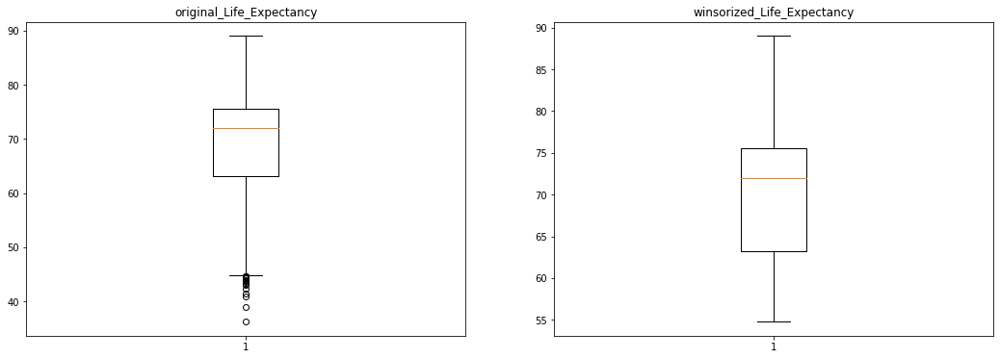

In [55]:
# Removing Outliers in the variables using Winsorization technique.
# Winsorize Life_Expectancy
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Life_Expectancy = df_life_expectancy['Life_Expectancy']
plt.boxplot(original_Life_Expectancy)
plt.title("original_Life_Expectancy")

plt.subplot(1,2,2)
winsorized_Life_Expectancy = winsorize(df_life_expectancy['Life_Expectancy'],(0.1,0))
plt.boxplot(winsorized_Life_Expectancy)
plt.title("winsorized_Life_Expectancy")

plt.show()

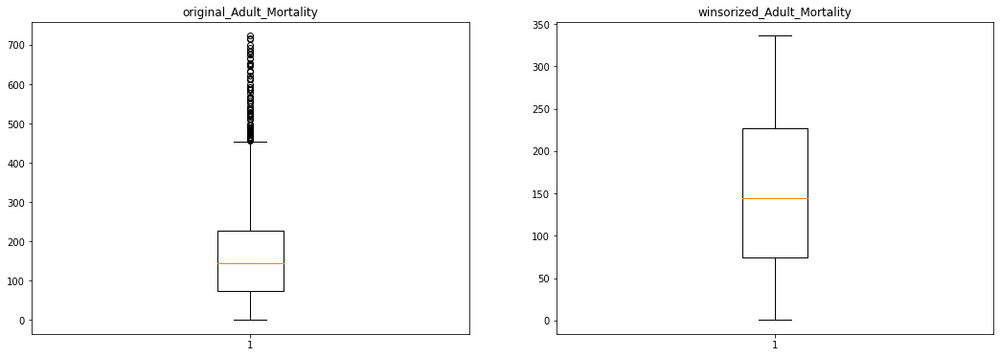

In [56]:
# Winsorize Adult_Mortality
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Adult_Mortality = df_life_expectancy['Adult_Mortality']
plt.boxplot(original_Adult_Mortality)
plt.title("original_Adult_Mortality")

plt.subplot(1,2,2)
winsorized_Adult_Mortality = winsorize(df_life_expectancy['Adult_Mortality'],(0,0.1))
plt.boxplot(winsorized_Adult_Mortality)
plt.title("winsorized_Adult_Mortality")

plt.show()

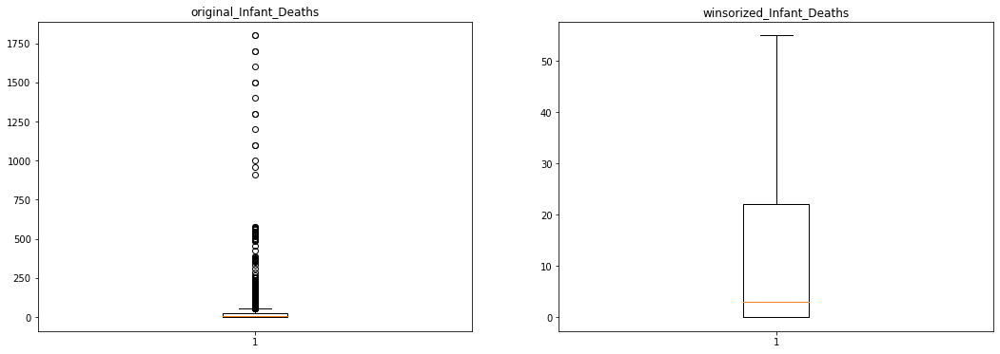

In [57]:
# Winsorize Infant_Deaths
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Infant_Deaths = df_life_expectancy['Infant_Deaths']
plt.boxplot(original_Infant_Deaths)
plt.title("original_Infant_Deaths")

plt.subplot(1,2,2)
winsorized_Infant_Deaths = winsorize(df_life_expectancy['Infant_Deaths'],(0,0.11))
plt.boxplot(winsorized_Infant_Deaths)
plt.title("winsorized_Infant_Deaths")

plt.show()

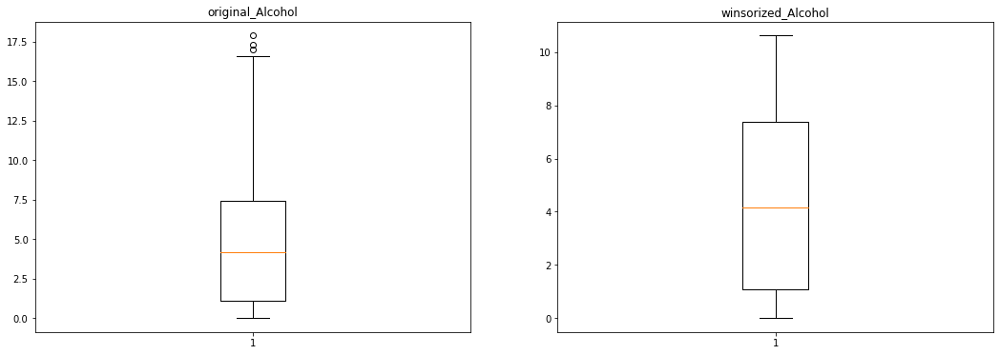

In [58]:
# Winsorize Alcohol
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Alcohol = df_life_expectancy['Alcohol']
plt.boxplot(original_Alcohol)
plt.title("original_Alcohol")

plt.subplot(1,2,2)
winsorized_Alcohol = winsorize(df_life_expectancy['Alcohol'],(0,0.1))
plt.boxplot(winsorized_Alcohol)
plt.title("winsorized_Alcohol")

plt.show()

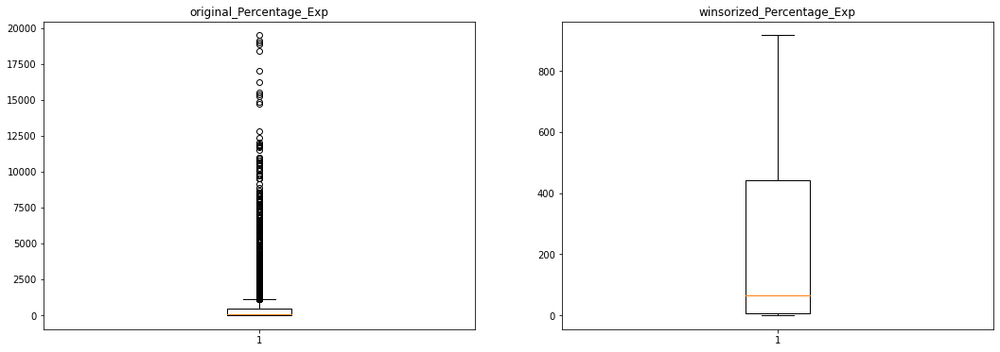

In [59]:
# Winsorize Percentage_Exp
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Percentage_Exp = df_life_expectancy['Percentage_Expenditure']
plt.boxplot(original_Percentage_Exp)
plt.title("original_Percentage_Exp")

plt.subplot(1,2,2)
winsorized_Percentage_Exp = winsorize(df_life_expectancy['Percentage_Expenditure'],(0,0.15))
plt.boxplot(winsorized_Percentage_Exp)
plt.title("winsorized_Percentage_Exp")

plt.show()

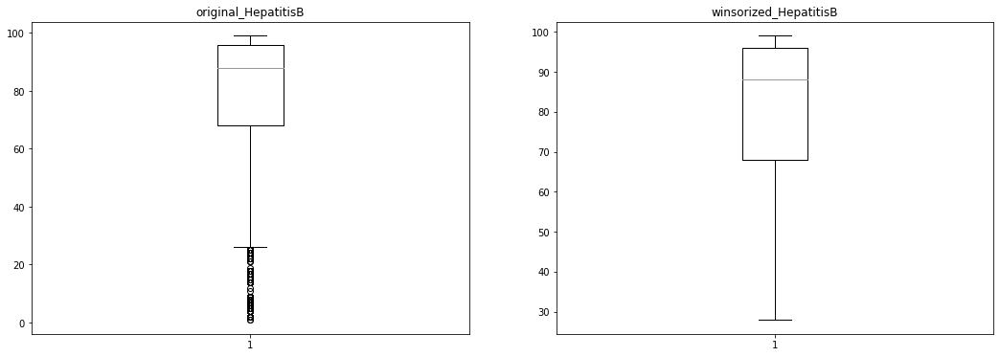

In [60]:
# Winsorize HepatitisB
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_HepatitisB = df_life_expectancy['HepatitisB']
plt.boxplot(original_HepatitisB)
plt.title("original_HepatitisB")

plt.subplot(1,2,2)
winsorized_HepatitisB = winsorize(df_life_expectancy['HepatitisB'],(0.11,0))
plt.boxplot(winsorized_HepatitisB)
plt.title("winsorized_HepatitisB")

plt.show()

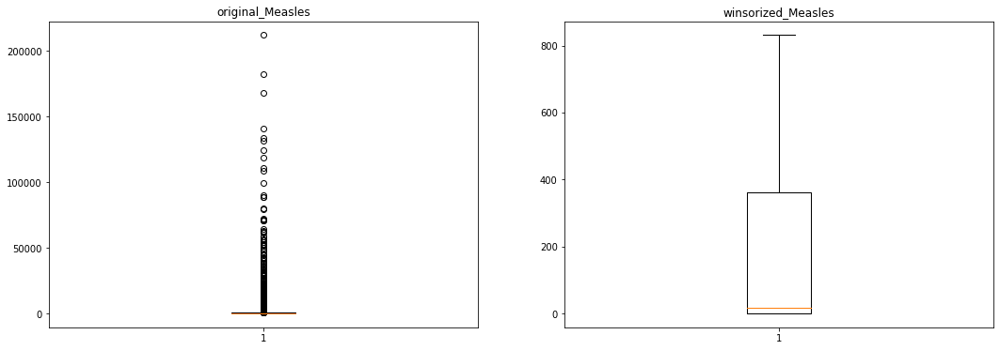

In [61]:
# Winsorize Measles
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Measles = df_life_expectancy['Measles']
plt.boxplot(original_Measles)
plt.title("original_Measles")

plt.subplot(1,2,2)
winsorized_Measles = winsorize(df_life_expectancy['Measles'],(0,0.19))
plt.boxplot(winsorized_Measles)
plt.title("winsorized_Measles")

plt.show()
# Needs to be dropped since it didnot enhance the data

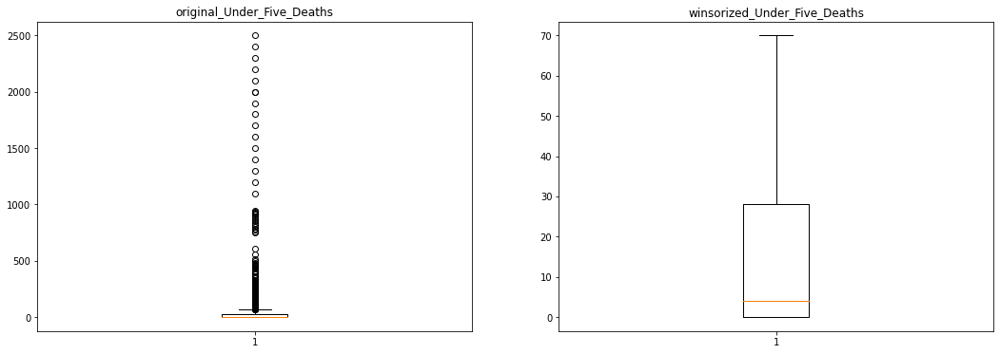

In [62]:
# Winsorize Under_Five_Deaths
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Under_Five_Deaths = df_life_expectancy['Under_Five_Deaths']
plt.boxplot(original_Under_Five_Deaths)
plt.title("original_Under_Five_Deaths")

plt.subplot(1,2,2)
winsorized_Under_Five_Deaths = winsorize(df_life_expectancy['Under_Five_Deaths'],(0,0.135))
plt.boxplot(winsorized_Under_Five_Deaths)
plt.title("winsorized_Under_Five_Deaths")

plt.show()

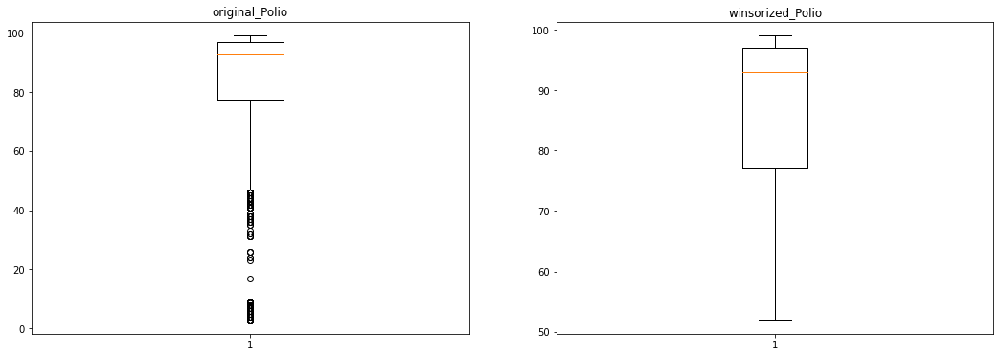

In [63]:
##### Winsorize Polio
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Polio = df_life_expectancy['Polio']
plt.boxplot(original_Polio)
plt.title("original_Polio")

plt.subplot(1,2,2)
winsorized_Polio = winsorize(df_life_expectancy['Polio'],(0.1,0))
plt.boxplot(winsorized_Polio)
plt.title("winsorized_Polio")

plt.show()

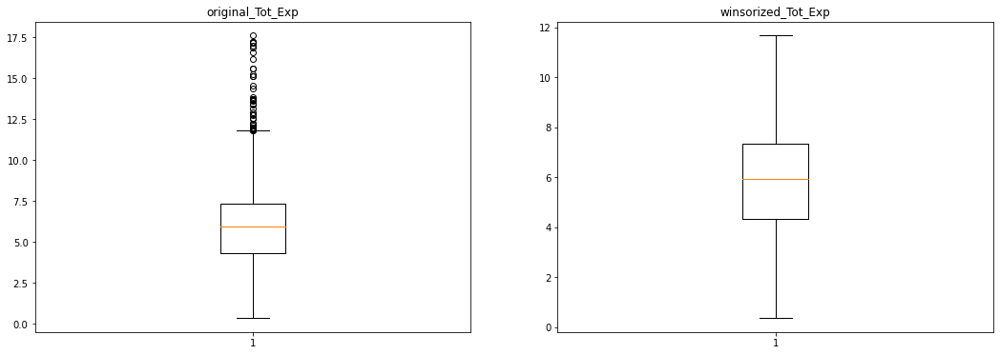

In [64]:
# Winsorize Tot_Exp
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Tot_Exp = df_life_expectancy['Total_Expenditure']
plt.boxplot(original_Tot_Exp)
plt.title("original_Tot_Exp")

plt.subplot(1,2,2)
winsorized_Tot_Exp = winsorize(df_life_expectancy['Total_Expenditure'],(0,0.02))
plt.boxplot(winsorized_Tot_Exp)
plt.title("winsorized_Tot_Exp")

plt.show()

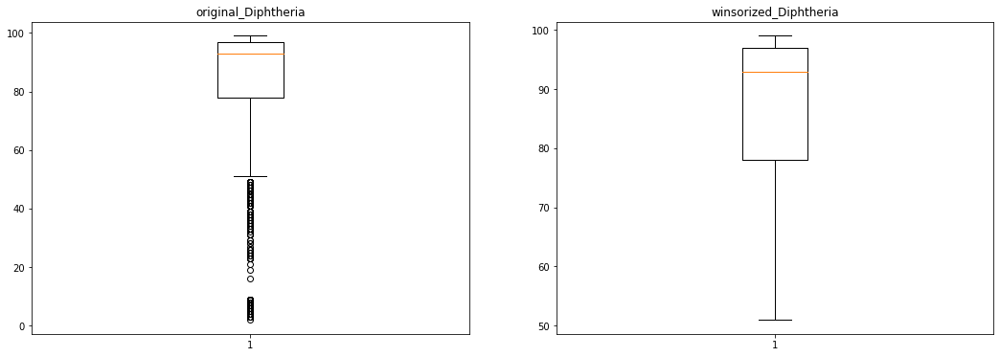

In [65]:
# Winsorize Diphtheria
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Diphtheria = df_life_expectancy['Diphtheria']
plt.boxplot(original_Diphtheria)
plt.title("original_Diphtheria")

plt.subplot(1,2,2)
winsorized_Diphtheria = winsorize(df_life_expectancy['Diphtheria'],(0.105,0))
plt.boxplot(winsorized_Diphtheria)
plt.title("winsorized_Diphtheria")

plt.show()

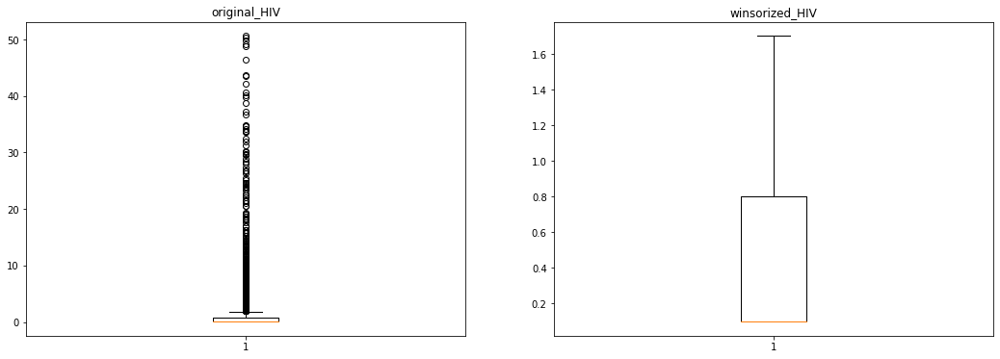

In [66]:
# Winsorize HIV/AIDS
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_HIV = df_life_expectancy['HIV/AIDS']
plt.boxplot(original_HIV)
plt.title("original_HIV")

plt.subplot(1,2,2)
winsorized_HIV = winsorize(df_life_expectancy['HIV/AIDS'],(0,0.19))
plt.boxplot(winsorized_HIV)
plt.title("winsorized_HIV")

plt.show()

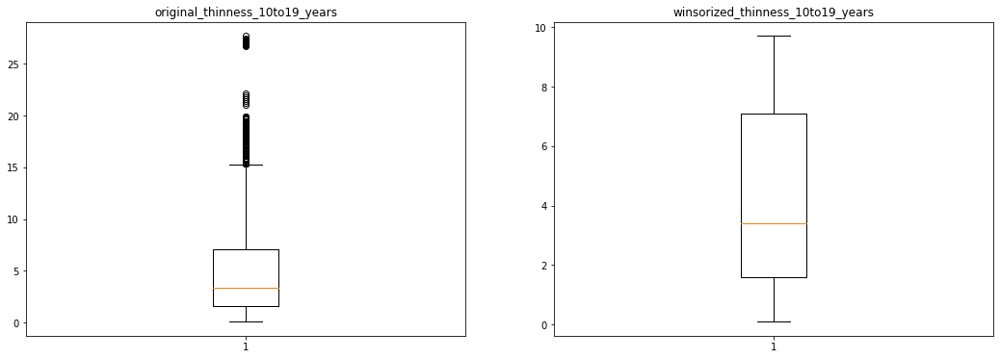

In [67]:
# Winsorize thinness_10to19_years
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_thinness_10to19_years = df_life_expectancy['thinness_10to19_years']
plt.boxplot(original_thinness_10to19_years)
plt.title("original_thinness_10to19_years")

plt.subplot(1,2,2)
winsorized_thinness_10to19_years = winsorize(df_life_expectancy['thinness_10to19_years'],(0,0.1))
plt.boxplot(winsorized_thinness_10to19_years)
plt.title("winsorized_thinness_10to19_years")

plt.show()


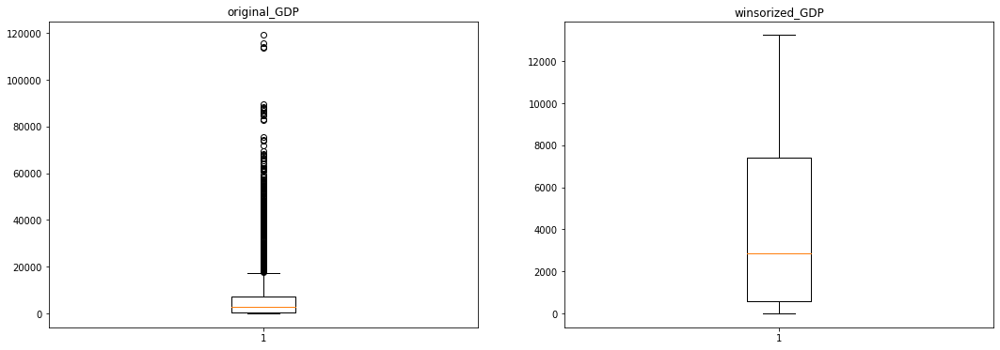

In [68]:
# Winsorize GDP
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_GDP = df_life_expectancy['GDP']
plt.boxplot(original_GDP)
plt.title("original_GDP")

plt.subplot(1,2,2)
winsorized_GDP = winsorize(df_life_expectancy['GDP'],(0,0.13))
plt.boxplot(winsorized_GDP)
plt.title("winsorized_GDP")

plt.show()

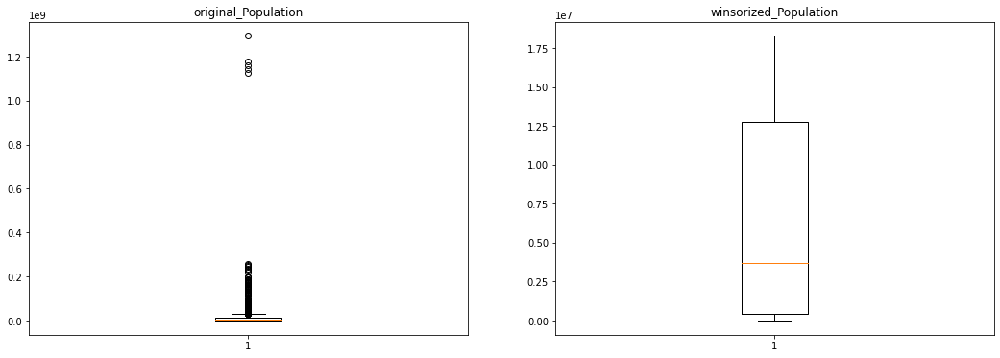

In [69]:
# Winsorize Population
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Population = df_life_expectancy['Population']
plt.boxplot(original_Population)
plt.title("original_Population")

plt.subplot(1,2,2)
winsorized_Population = winsorize(df_life_expectancy['Population'],(0,0.1))
plt.boxplot(winsorized_Population)
plt.title("winsorized_Population")

plt.show()

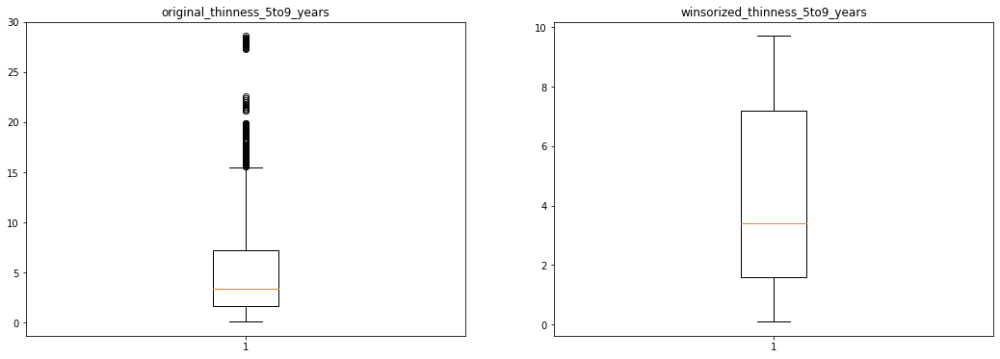

In [70]:
# Winsorize thinness_5to9_years
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_thinness_5to9_years = df_life_expectancy['thinness_5to9_years']
plt.boxplot(original_thinness_5to9_years)
plt.title("original_thinness_5to9_years")

plt.subplot(1,2,2)
winsorized_thinness_5to9_years = winsorize(df_life_expectancy['thinness_5to9_years'],(0,0.1))
plt.boxplot(winsorized_thinness_5to9_years)
plt.title("winsorized_thinness_5to9_years")

plt.show()

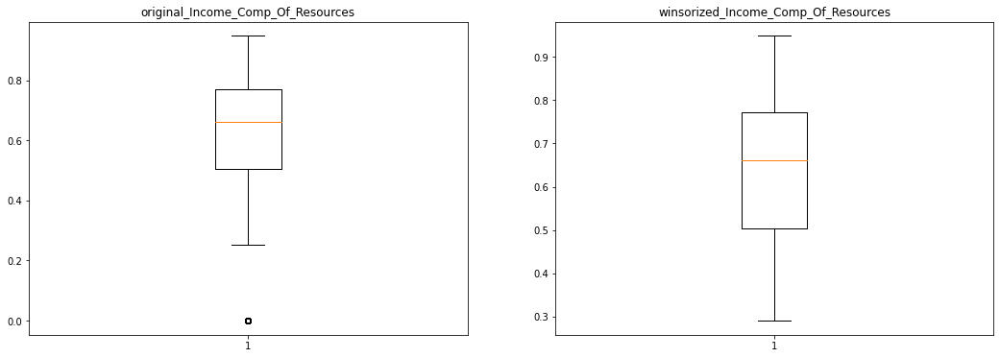

In [71]:
# Winsorize Income_Comp_Of_Resources
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Income_Comp_Of_Resources = df_life_expectancy['Income_Composition_Of_Resources']
plt.boxplot(original_Income_Comp_Of_Resources)
plt.title("original_Income_Comp_Of_Resources")

plt.subplot(1,2,2)
winsorized_Income_Comp_Of_Resources = winsorize(df_life_expectancy['Income_Composition_Of_Resources'],(0.05,0))
plt.boxplot(winsorized_Income_Comp_Of_Resources)
plt.title("winsorized_Income_Comp_Of_Resources")

plt.show()

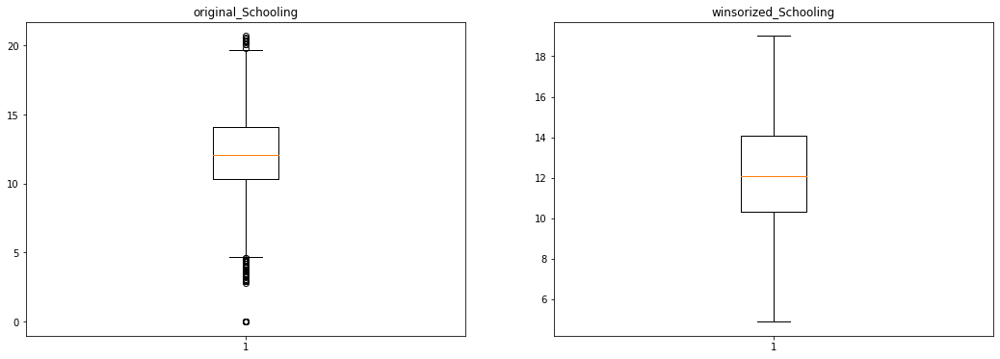

In [72]:
# Winsorize Schooling
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Schooling = df_life_expectancy['Schooling']
plt.boxplot(original_Schooling)
plt.title("original_Schooling")

plt.subplot(1,2,2)
winsorized_Schooling = winsorize(df_life_expectancy['Schooling'],(0.025,0.01))
plt.boxplot(winsorized_Schooling)
plt.title("winsorized_Schooling")

plt.show()

In [73]:
# Check number of Outliers after Winsorization for each variable.
win_list = [winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,
            winsorized_Percentage_Exp,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Tot_Exp,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Comp_Of_Resources,winsorized_Schooling]

for variable in win_list:
    q75, q25 = np.percentile(variable, [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    
    print("Number of outliers after winsorization : {}".format(len(np.where((variable > max_val) | (variable < min_val))[0])))

Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0


In [74]:
# Adding winsorized variables to the data frame.
df_life_expectancy['winsorized_Life_Expectancy'] = winsorized_Life_Expectancy
df_life_expectancy['winsorized_Adult_Mortality'] = winsorized_Adult_Mortality
df_life_expectancy['winsorized_Infant_Deaths'] = winsorized_Infant_Deaths
df_life_expectancy['winsorized_Alcohol'] = winsorized_Alcohol
df_life_expectancy['winsorized_Percentage_Expenditure'] = winsorized_Percentage_Exp
df_life_expectancy['winsorized_HepatitisB'] = winsorized_HepatitisB
df_life_expectancy['winsorized_Under_Five_Deaths'] = winsorized_Under_Five_Deaths
df_life_expectancy['winsorized_Polio'] = winsorized_Polio
df_life_expectancy['winsorized_Total_Expenditure'] = winsorized_Tot_Exp
df_life_expectancy['winsorized_Diphtheria'] = winsorized_Diphtheria
df_life_expectancy['winsorized_HIV'] = winsorized_HIV
df_life_expectancy['winsorized_GDP'] = winsorized_GDP
df_life_expectancy['winsorized_Population'] = winsorized_Population
df_life_expectancy['winsorized_thinness_10to19_years'] = winsorized_thinness_10to19_years
df_life_expectancy['winsorized_thinness_5to9_years'] = winsorized_thinness_5to9_years
df_life_expectancy['winsorized_Income_Composition_Of_Resources'] = winsorized_Income_Comp_Of_Resources
df_life_expectancy['winsorized_Schooling'] = winsorized_Schooling

In [75]:
df_life_expectancy.describe()

,Year,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Expenditure,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Total_Expenditure,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Composition_Of_Resources,winsorized_Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602166,738.251295,75.816392,2419.592240,38.321247,42.035739,82.307692,5.922512,82.075221,1.742103,7413.645004,1.275338e+07,4.839704,4.870317,0.627551,11.992793,69.676497,155.205230,13.635126,4.453667,258.764731,77.769081,17.965963,85.382914,5.886889,85.221920,0.508237,4549.124818,6.637598e+06,4.334496,4.341692,0.640524,12.045720
std,4.613841,9.507640,124.080302,117.926501,3.916446,1987.914858,27.907801,11467.272489,19.927677,160.445548,23.636677,2.409282,23.917022,5.077785,13152.080417,5.381546e+07,4.394535,4.482708,0.204820,3.264381,8.603723,101.258628,19.108928,3.627448,338.489649,23.424521,25.194515,15.409342,2.293622,15.606754,0.640847,4498.556773,6.581355e+06,3.142094,3.155859,0.171164,3.072825
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,54.800000,1.000000,0.000000,0.010000,0.000000,28.000000,0.000000,52.000000,0.370000,51.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.291000,4.900000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,68.000000,0.000000,19.400000,0.000000,77.000000,4.340000,78.000000,0.100000,563.517201,4.189172e+05,1.600000,1.600000,0.504250,10.300000,63.200000,74.000000,0.000000,1.092500,4.685343,68.000000,0.000000,77.000000,4.340000,78.000000,0.100000,563.517201,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.000000,144.000000,3.000000,4.155000,64.912906,88.000000,17.000000,43.000000,4.000000,93.000000,5.920000,93.000000,0.100000,2874.075216,3.675929e+06,3.400000,3.400000,0.662000,12.100000,72.000000,144.000000,3.000000,4.155000,64.912906,88.000000,4.000000,93.000000,5.920000,93.000000,0.100000,2874.075216,3.675929e+06,3.400000,3.400000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7413.645004,1.275338e+07,7.100000,7.200000,0.772000,14.100000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,28.000000,97.000000,7.330000,97.000000,0.800000,7413.645004,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000,89.000000,336.000000,55.000000,10.620000,916.474177,99.000000,70.000000,99.000000,11.660000,99.000000,1.700000,13235.977570,1.829461e+07,9.700000,9.700000,0.948000,19.000000


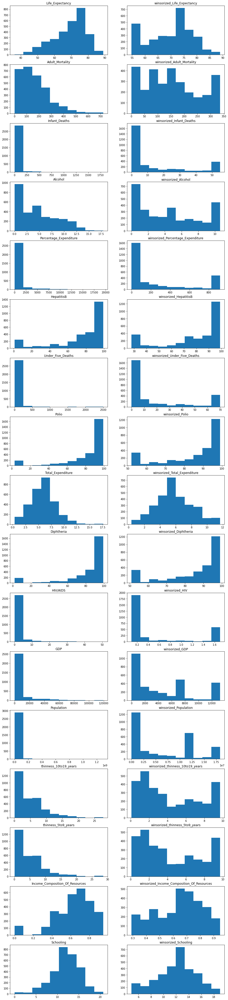

In [76]:
# Distribution of each numerical variable after removing outliers.
all_col = ['Life_Expectancy','winsorized_Life_Expectancy','Adult_Mortality','winsorized_Adult_Mortality','Infant_Deaths',
         'winsorized_Infant_Deaths','Alcohol','winsorized_Alcohol','Percentage_Expenditure','winsorized_Percentage_Expenditure','HepatitisB',
         'winsorized_HepatitisB','Under_Five_Deaths','winsorized_Under_Five_Deaths','Polio','winsorized_Polio','Total_Expenditure',
         'winsorized_Total_Expenditure','Diphtheria','winsorized_Diphtheria','HIV/AIDS','winsorized_HIV','GDP','winsorized_GDP',
         'Population','winsorized_Population','thinness_10to19_years','winsorized_thinness_10to19_years','thinness_5to9_years',
         'winsorized_thinness_5to9_years','Income_Composition_Of_Resources','winsorized_Income_Composition_Of_Resources',
         'Schooling','winsorized_Schooling']

plt.figure(figsize=(15,75))

for i in range(len(all_col)):
    plt.subplot(18,2,i+1)
    plt.hist(df_life_expectancy[all_col[i]])
    plt.title(all_col[i])

plt.show()


# Searching For Countries With Invalid Characters
Cleaning the countries column by removing all unwanted characters and following the same pattern.

In [77]:
countries = df_life_expectancy['Country']

# Drop all the duplicates from countries
countries = countries.drop_duplicates()
# Write the regular expression: pattern
pattern = '^[A-Za-z\.\s]*$'

# Create the Boolean vector: mask
mask = countries.str.contains(pattern)

# Invert the mask: mask_inverse
mask_inverse = ~mask

# Subset countries using mask_inverse: invalid_countries
invalid_countries = countries.loc[mask_inverse]

# Print invalid_countries
print(invalid_countries)


304          Bolivia (Plurinational State of)
432                             Côte d'Ivoire
705     Democratic People's Republic of Korea
1090                            Guinea-Bissau
1218               Iran (Islamic Republic of)
1426         Lao People's Democratic Republic
1699         Micronesia (Federated States of)
2601                              Timor-Leste
2858       Venezuela (Bolivarian Republic of)
Name: Country, dtype: object


- How much the average life expectancy changes over each year?

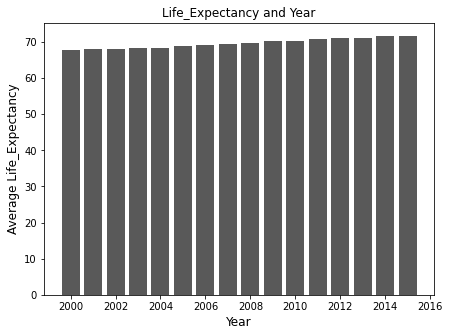

In [78]:
# Life_Expectancy and Year using bar plot.
plt.figure(figsize=(7,5))
plt.bar(df_life_expectancy.groupby('Year')['Year'].count().index,df_life_expectancy.groupby('Year')['winsorized_Life_Expectancy'].mean(),color='black',alpha=0.65)
plt.xlabel("Year",fontsize=12)
plt.ylabel("Average Life_Expectancy",fontsize=12)
plt.title("Life_Expectancy and Year")
plt.show()

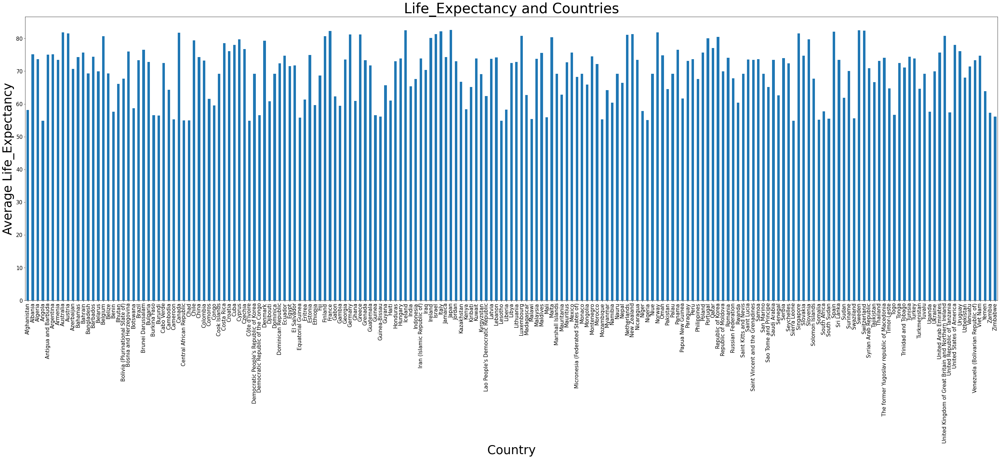

In [79]:
# Visualizing the life expectancy of the current dataset
# df_life_expectancy.Life_Expectancy.plot(kind = 'hist')

# df_egypt = df_life_expectancy.loc[df_life_expectancy['Country'] == "Egypt"]
# lifeExpectancy_df
# df_2015 = df_life_expectancy.loc[df_life_expectancy['Year'] == 2015]
# df_egypt

# lifeExpectancy_df[lifeExpectancy_df["Status"] == "Developed"]
# lifeExpectancy_df.head()

## GDP on health can be used in the coorelation with the all countries Data on the Gini column/country
## Population Column Outliers 
## Total Expenditure the sum of general government health expenditure and private health expenditure in a given year, calculated in national currency units in current prices (totla money spent on health).
## Tidy Thinnes : Value , Age Range
## Income Composition Of Resources ... time the population and area can refer to gini
# lifeExpectancy_df[lifeExpectancy_df["Country"]=="Egypt"]
# Life_Expectancy w.r.t Country using bar plot.
df_life_expectancy_Countries = df_life_expectancy.groupby('Country')['winsorized_Life_Expectancy'].mean()
df_life_expectancy_Countries.plot(kind='bar', figsize=(50,15), fontsize=15)
plt.title("Life_Expectancy and Countries",fontsize=40)
plt.xlabel("Country",fontsize=35)
plt.ylabel("Average Life_Expectancy",fontsize=35)
plt.show()

# World Of Happiness Data

In [80]:
print("2015:",df_worldHappiness_2015.shape,"2016:",df_worldHappiness_2016.shape,"2017:",df_worldHappiness_2017.shape,"2018:",df_worldHappiness_2018.shape,"2019:",df_worldHappiness_2019.shape)

2015: (158, 12) 2016: (157, 13) 2017: (155, 12) 2018: (156, 9) 2019: (156, 9)


# World Happiness 2015:


## Column Descriptions
- Country - The Name of the country.
- Region - Region the country belongs to.
- Happiness Score - The average score that came from a survey where each paritcepant rate his/her happiness from 0 to 10 for the current country
- Happiness Rank - Based on the Happines Score where does the country lie
- Standard Error - The Standard Error in happiness score(+ or -)
- Economy (GDP per Captia) - The countries GDP divided by it total population number
- Family  - 
- Health(Life Expectancy) - Average age a person is expected to die
- Freedom  - this factor is determined based on the survey result of the Gallup World Poll. Applicants were asked this question:“Are you satisfied or dissatisfied with your freedom to choose what you do with your life?”


- Trust (Government Corruption) - Perceptions of corruption” is also determined as a key factor in the Happiness Index. It is calculated by averaging the answers to the following 2 questions:“Is corruption widespread throughout the government or not?”&“Is corruption widespread within businesses or not?”

- Generosity - Generosity was also determined by the Gallup World Poll survey results, by having respondents answer this question:“Have you donated money to a charity in the past month?”Again, the average of all responses (yes being 1 and no being 0) determines the output of this key factor.

- Dystopia Residual - 

In [81]:
df_worldHappiness_2015

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.41372,0.23351,2.61955
6,Netherlands,Western Europe,7,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.47610,2.46570
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262,2.37119
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.42922,0.47501,2.26425
9,Australia,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.35637,0.43562,2.26646


In [82]:
print("Total Number of entries :",len(df_worldHappiness_2015))
print(df_worldHappiness_2015.dtypes)
print("\nNull Values : \n"+str(df_worldHappiness_2015.isnull().sum()))

Total Number of entries : 158
Country                           object
Region                            object
Happiness Rank                     int64
Happiness Score                  float64
Standard Error                   float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Dystopia Residual                float64
dtype: object

Null Values : 
Country                          0
Region                           0
Happiness Rank                   0
Happiness Score                  0
Standard Error                   0
Economy (GDP per Capita)         0
Family                           0
Health (Life Expectancy)         0
Freedom                          0
Trust (Government Corruption)    0
Generosity                       0
Dystopia Residual                0
dtype: int64


In [83]:
dict_worldHappiness_2015_unique_values= {'Column Name':[], 'Unique values': []}
for column in df_worldHappiness_2015:
    dict_worldHappiness_2015_unique_values['Column Name'].append(column)
    dict_worldHappiness_2015_unique_values['Unique values'].append(len(df_worldHappiness_2015[column].unique()))
    
df_worldHappiness_2015_unique_values=pd.DataFrame(data=dict_worldHappiness_2015_unique_values)
df_worldHappiness_2015_unique_values

,Column Name,Unique values
0,Country,158
1,Region,10
2,Happiness Rank,157
3,Happiness Score,157
4,Standard Error,153
5,Economy (GDP per Capita),158
6,Family,158
7,Health (Life Expectancy),157
8,Freedom,158
9,Trust (Government Corruption),157


In [84]:
df_worldHappiness_2015_statistics=df_worldHappiness_2015.describe()
df_worldHappiness_2015_statistics

,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000
mean,79.493671,5.375734,0.047885,0.846137,0.991046,0.630259,0.428615,0.143422,0.237296,2.098977
std,45.754363,1.145010,0.017146,0.403121,0.272369,0.247078,0.150693,0.120034,0.126685,0.553550
min,1.000000,2.839000,0.018480,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.328580
25%,40.250000,4.526000,0.037268,0.545808,0.856823,0.439185,0.328330,0.061675,0.150553,1.759410
50%,79.500000,5.232500,0.043940,0.910245,1.029510,0.696705,0.435515,0.107220,0.216130,2.095415
75%,118.750000,6.243750,0.052300,1.158448,1.214405,0.811013,0.549092,0.180255,0.309883,2.462415
max,158.000000,7.587000,0.136930,1.690420,1.402230,1.025250,0.669730,0.551910,0.795880,3.602140


In [85]:
dict_worldHappiness_2015_outlier_columns={}
for column in df_worldHappiness_2015:
    if df_worldHappiness_2015.dtypes[column]=='O':
        continue
    minimum=df_worldHappiness_2015_statistics[column]['min']
    maximum=df_worldHappiness_2015_statistics[column]['max']
    IQR=1.5*(df_worldHappiness_2015_statistics[column]['75%']-df_worldHappiness_2015_statistics[column]['25%'])
    left_whihsker_min=df_worldHappiness_2015_statistics[column]['25%']-IQR
    right_whihsker_max=df_worldHappiness_2015_statistics[column]['75%']+IQR
    
    
    if(maximum>right_whihsker_max or minimum<left_whihsker_min):
        dict_worldHappiness_2015_outlier_columns[column]={'count':0,'left_whihsker_min':0,'right_whihsker_max':0}
#         print(column)
#         print(minimum)
#         print(left_whihsker_min)
#         print(maximum)
#         print(right_whihsker_max)
        
        dict_worldHappiness_2015_outlier_columns[column]["count"]=len(df_worldHappiness_2015[df_worldHappiness_2015[column]>right_whihsker_max]) 
        dict_worldHappiness_2015_outlier_columns[column]["count"]+=len(df_worldHappiness_2015[df_worldHappiness_2015[column]<left_whihsker_min])
        dict_worldHappiness_2015_outlier_columns[column]["left_whihsker_min"]=left_whihsker_min
        dict_worldHappiness_2015_outlier_columns[column]["right_whihsker_max"]=right_whihsker_max

for column in dict_worldHappiness_2015_outlier_columns:
        print(column,":",dict_worldHappiness_2015_outlier_columns[column])
   


Standard Error : {'count': 10, 'left_whihsker_min': 0.014718750000000006, 'right_whihsker_max': 0.07484874999999999}
Family : {'count': 3, 'left_whihsker_min': 0.32044875000000017, 'right_whihsker_max': 1.7507787499999998}
Trust (Government Corruption) : {'count': 14, 'left_whihsker_min': -0.11619500000000002, 'right_whihsker_max': 0.358125}
Generosity : {'count': 2, 'left_whihsker_min': -0.08844250000000001, 'right_whihsker_max': 0.5488775}
Dystopia Residual : {'count': 5, 'left_whihsker_min': 0.7049025000000004, 'right_whihsker_max': 3.516922499999999}


/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python

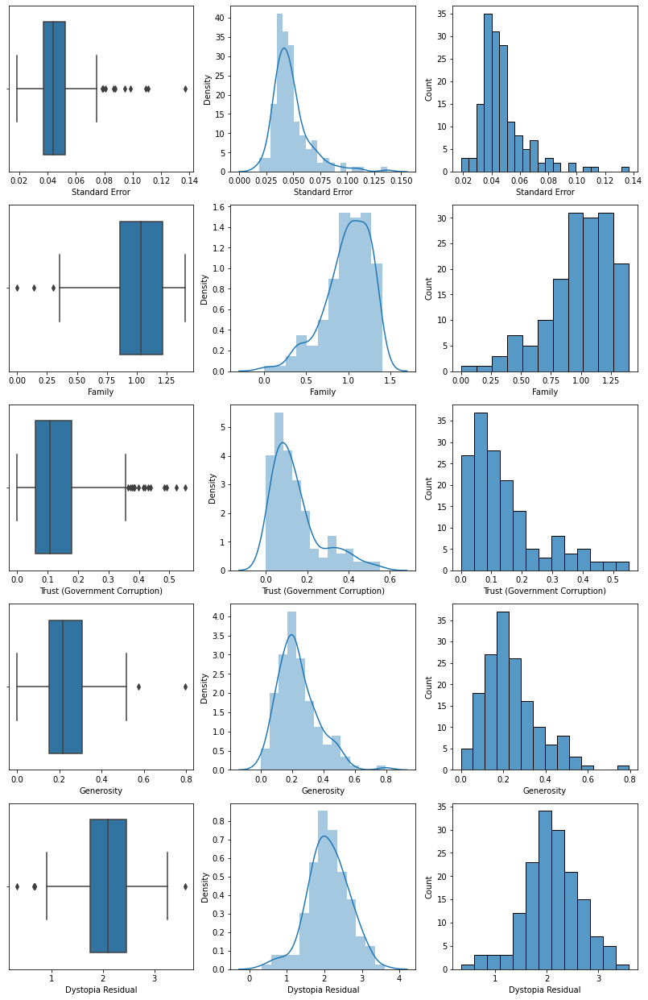

In [86]:
fig = plt.figure(figsize=(14,22))
number_of_rows=len(dict_worldHappiness_2015_outlier_columns)
i=1;
for column in dict_worldHappiness_2015_outlier_columns:
    plt.subplot(number_of_rows,3,i)
    sns.boxplot(x=df_worldHappiness_2015[column],whis=1.5)
    i+=1
    plt.subplot(number_of_rows,3,i)
    #plt.hist(df_worldHappiness_2015[column])
    sns.distplot(df_worldHappiness_2015[column])
    #plt.title(column)
    i+=1
    plt.subplot(number_of_rows,3,i)
    #plt.hist(df_worldHappiness_2015[column])
    sns.histplot(df_worldHappiness_2015[column])
    i+=1

plt.show()



In [87]:
for column in dict_worldHappiness_2015_outlier_columns:
    rw=dict_worldHappiness_2015_outlier_columns[column]['right_whihsker_max']
    lw=dict_worldHappiness_2015_outlier_columns[column]['left_whihsker_min']
    print(column)
    display(df_worldHappiness_2015[(df_worldHappiness_2015[column]<lw) | (df_worldHappiness_2015[column]>rw)])


Standard Error


,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
39,Suriname,Latin America and Caribbean,40,6.269,0.09811,0.99534,0.97200,0.60820,0.59657,0.13633,0.16991,2.79094
40,Trinidad and Tobago,Latin America and Caribbean,41,6.168,0.10895,1.21183,1.18354,0.61483,0.55884,0.01140,0.31844,2.26882
62,Libya,Middle East and Northern Africa,63,5.754,0.07832,1.13145,1.11862,0.70380,0.41668,0.11023,0.18295,2.09066
64,Jamaica,Latin America and Caribbean,65,5.709,0.13693,0.81038,1.15102,0.68741,0.50442,0.02299,0.21230,2.32038
93,Mozambique,Sub-Saharan Africa,94,4.971,0.07896,0.08308,1.02626,0.09131,0.34037,0.15603,0.22269,3.05137
96,Lesotho,Sub-Saharan Africa,97,4.898,0.09438,0.37545,1.04103,0.07612,0.31767,0.12504,0.16388,2.79832
100,Swaziland,Sub-Saharan Africa,101,4.867,0.08742,0.71206,1.07284,0.07566,0.30658,0.03060,0.18259,2.48676
115,Liberia,Sub-Saharan Africa,116,4.571,0.11068,0.07120,0.78968,0.34201,0.28531,0.06232,0.24362,2.77729
125,Djibouti,Sub-Saharan Africa,126,4.369,0.08096,0.44025,0.59207,0.36291,0.46074,0.28105,0.18093,2.05125
156,Burundi,Sub-Saharan Africa,157,2.905,0.08658,0.01530,0.41587,0.22396,0.11850,0.10062,0.19727,1.83302


Family


,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
147,Central African Republic,Sub-Saharan Africa,148,3.678,0.06112,0.07850,0.00000,0.06699,0.48879,0.08289,0.23835,2.72230
152,Afghanistan,Southern Asia,153,3.575,0.03084,0.31982,0.30285,0.30335,0.23414,0.09719,0.36510,1.95210
157,Togo,Sub-Saharan Africa,158,2.839,0.06727,0.20868,0.13995,0.28443,0.36453,0.10731,0.16681,1.56726


Trust (Government Corruption)


,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.41372,0.23351,2.61955
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262,2.37119
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.42922,0.47501,2.26425
16,Luxembourg,Western Europe,17,6.946,0.03499,1.56391,1.21963,0.91894,0.61583,0.37798,0.28034,1.96961
19,United Arab Emirates,Middle East and Northern Africa,20,6.901,0.03729,1.42727,1.12575,0.80925,0.64157,0.38583,0.26428,2.24743
23,Singapore,Southeastern Asia,24,6.798,0.03780,1.52186,1.02000,1.02525,0.54252,0.49210,0.31105,1.88501
27,Qatar,Middle East and Northern Africa,28,6.611,0.06257,1.69042,1.07860,0.79733,0.64040,0.52208,0.32573,1.55674


Generosity


,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
33,Thailand,Southeastern Asia,34,6.455,0.03557,0.96690,1.26504,0.73850,0.55664,0.03187,0.57630,2.31945
128,Myanmar,Southeastern Asia,129,4.307,0.04351,0.27108,0.70905,0.48246,0.44017,0.19034,0.79588,1.41805


Dystopia Residual


,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
13,Mexico,Latin America and Caribbean,14,7.187,0.04176,1.02054,0.91451,0.81444,0.48181,0.21312,0.14074,3.60214
71,Hong Kong,Eastern Asia,72,5.474,0.05051,1.38604,1.05818,1.01328,0.59608,0.37124,0.39478,0.65429
131,Sri Lanka,Southern Asia,132,4.271,0.03751,0.83524,1.01905,0.70806,0.53726,0.09179,0.40828,0.67108
153,Rwanda,Sub-Saharan Africa,154,3.465,0.03464,0.22208,0.77370,0.42864,0.59201,0.55191,0.22628,0.67042
155,Syria,Middle East and Northern Africa,156,3.006,0.05015,0.66320,0.47489,0.72193,0.15684,0.18906,0.47179,0.32858


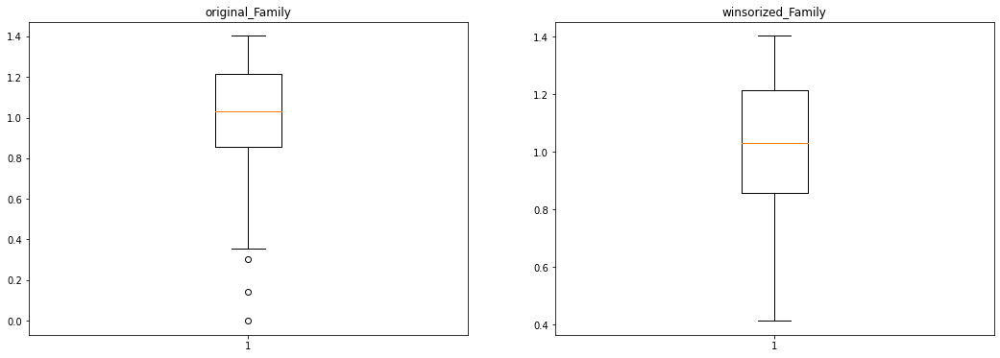

In [88]:
# Winsorize Family
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Family = df_worldHappiness_2015['Family']
plt.boxplot(original_Family)
plt.title("original_Family")

plt.subplot(1,2,2)
winsorized_Family = winsorize(df_worldHappiness_2015['Family'],(0.05,0))
plt.boxplot(winsorized_Family)
plt.title("winsorized_Family")

plt.show()

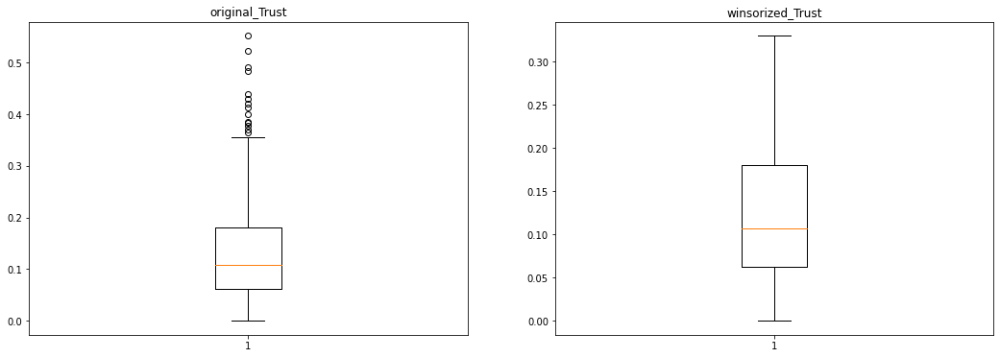

In [89]:
# Winsorize Trust
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Trust = df_worldHappiness_2015['Trust (Government Corruption)']
plt.boxplot(original_Trust)
plt.title("original_Trust")

plt.subplot(1,2,2)
winsorized_Trust = winsorize(df_worldHappiness_2015['Trust (Government Corruption)'],(0,0.1))
plt.boxplot(winsorized_Trust)
plt.title("winsorized_Trust")

plt.show()

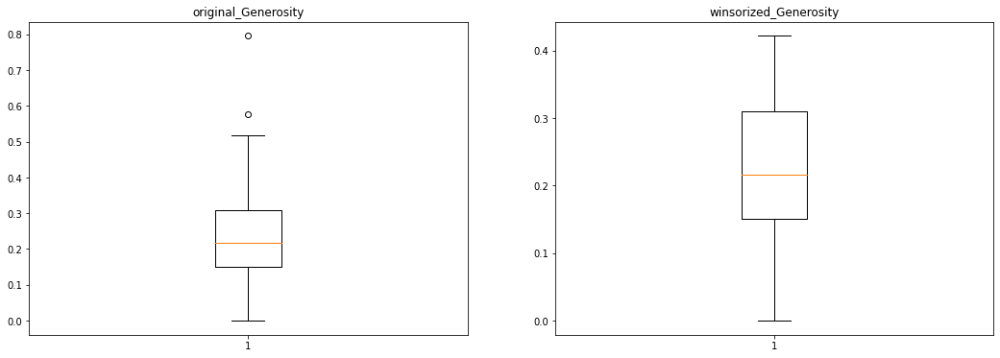

In [90]:
# Winsorize Generosity
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Generosity = df_worldHappiness_2015['Generosity']
plt.boxplot(original_Generosity)
plt.title("original_Generosity")

plt.subplot(1,2,2)
winsorized_Generosity = winsorize(df_worldHappiness_2015['Generosity'],(0,0.1))
plt.boxplot(winsorized_Generosity)
plt.title("winsorized_Generosity")

plt.show()

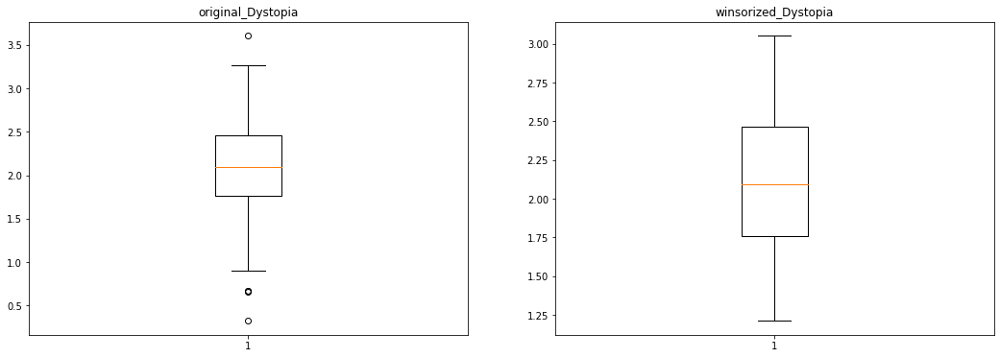

In [91]:
# Winsorize Dystopia
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
original_Dystopia = df_worldHappiness_2015['Dystopia Residual']
plt.boxplot(original_Dystopia)
plt.title("original_Dystopia")

plt.subplot(1,2,2)
winsorized_Dystopia = winsorize(df_worldHappiness_2015['Dystopia Residual'],(0.05,0.05))
plt.boxplot(winsorized_Dystopia)
plt.title("winsorized_Dystopia")

plt.show()

In [92]:
df_worldHappiness_2015['Dystopia Residual'] = winsorized_Dystopia
df_worldHappiness_2015['Family'] = winsorized_Family
df_worldHappiness_2015['Generosity'] = winsorized_Generosity
df_worldHappiness_2015['Trust (Government Corruption)'] = winsorized_Trust


/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/mado/.local/lib/python

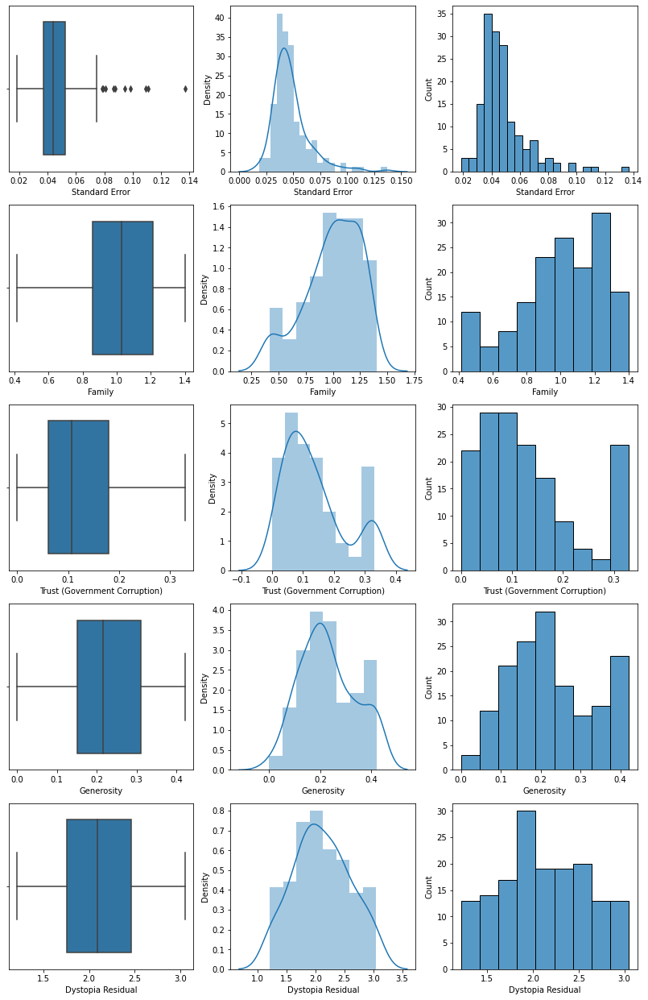

In [93]:
fig = plt.figure(figsize=(14,22))
number_of_rows=len(dict_worldHappiness_2015_outlier_columns)
i=1;
for column in dict_worldHappiness_2015_outlier_columns:
    plt.subplot(number_of_rows,3,i)
    sns.boxplot(x=df_worldHappiness_2015[column],whis=1.5)
    i+=1
    plt.subplot(number_of_rows,3,i)
    #plt.hist(df_worldHappiness_2015[column])
    sns.distplot(df_worldHappiness_2015[column])
    #plt.title(column)
    i+=1
    plt.subplot(number_of_rows,3,i)
    #plt.hist(df_worldHappiness_2015[column])
    sns.histplot(df_worldHappiness_2015[column])
    i+=1

plt.show()

# Data Integration

In [94]:
print(df_250_countries.shape)
df_250_countries

(250, 17)


,Name,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),winsorized_Population,winsorized_Area,winsorized_Gini,winsorized_Real_Growth_Rating(%),winsorized_Literacy_Rate(%),winsorized_Inflation(%),winsorized_Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,6.522300e+05,27.800000,3.100000,28.100000,6.800000,35.000000,27657145,6.522300e+05,30.900000,3.100000,66.800000,6.800000,23.000000
1,Åland Islands,Europe,Northern Europe,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671
2,Albania,Europe,Southern Europe,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000
3,Algeria,Africa,Northern Africa,40400000,2.381741e+06,35.300000,3.100000,79.000000,3.900000,10.300000,40400000,1.240192e+06,35.300000,3.100000,79.000000,3.900000,10.300000
4,American Samoa,Oceania,Polynesia,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671
5,Andorra,Europe,Southern Europe,78014,4.680000e+02,40.177124,-1.600000,100.000000,1.100000,4.000000,78014,4.680000e+02,40.177124,0.600000,100.000000,1.100000,4.000000
6,Angola,Africa,Middle Africa,25868000,1.246700e+06,58.600000,5.600000,70.400000,8.900000,14.770671,25868000,1.240192e+06,45.700000,5.600000,70.400000,7.100000,14.770671
7,Anguilla,Americas,Caribbean,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000
8,Antarctica,Polar,NaN,1000,1.400000e+07,40.177124,3.609697,84.408314,4.383436,14.770671,1000,1.240192e+06,40.177124,3.609697,84.408314,4.383436,14.770671
9,Antigua and Barbuda,Americas,Caribbean,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000


In [95]:
df_250_countries_cleaned = df_250_countries.drop(columns=['Population', 'Area','Gini','Real Growth Rating(%)','Literacy Rate(%)','Inflation(%)','Unemployement(%)'])
df_250_countries_cleaned

,Name,Region,Subregion,winsorized_Population,winsorized_Area,winsorized_Gini,winsorized_Real_Growth_Rating(%),winsorized_Literacy_Rate(%),winsorized_Inflation(%),winsorized_Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,6.522300e+05,30.900000,3.100000,66.800000,6.800000,23.000000
1,Åland Islands,Europe,Northern Europe,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671
2,Albania,Europe,Southern Europe,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000
3,Algeria,Africa,Northern Africa,40400000,1.240192e+06,35.300000,3.100000,79.000000,3.900000,10.300000
4,American Samoa,Oceania,Polynesia,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671
5,Andorra,Europe,Southern Europe,78014,4.680000e+02,40.177124,0.600000,100.000000,1.100000,4.000000
6,Angola,Africa,Middle Africa,25868000,1.240192e+06,45.700000,5.600000,70.400000,7.100000,14.770671
7,Anguilla,Americas,Caribbean,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000
8,Antarctica,Polar,NaN,1000,1.240192e+06,40.177124,3.609697,84.408314,4.383436,14.770671
9,Antigua and Barbuda,Americas,Caribbean,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000


In [96]:
df_250_countries_cleaned = df_250_countries_cleaned.rename(columns={'winsorized_Population':'Population','winsorized_Area':'Area',
         'winsorized_Gini':'Gini','winsorized_Real_Growth_Rating(%)':'Real Growth Rating(%)','winsorized_Literacy_Rate(%)':'Literacy Rate(%)',
         'winsorized_Inflation(%)':'Inflation(%)','winsorized_Unemployement(%)':'Unemployement(%)'})
df_250_countries_cleaned

,Name,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,6.522300e+05,30.900000,3.100000,66.800000,6.800000,23.000000
1,Åland Islands,Europe,Northern Europe,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671
2,Albania,Europe,Southern Europe,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000
3,Algeria,Africa,Northern Africa,40400000,1.240192e+06,35.300000,3.100000,79.000000,3.900000,10.300000
4,American Samoa,Oceania,Polynesia,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671
5,Andorra,Europe,Southern Europe,78014,4.680000e+02,40.177124,0.600000,100.000000,1.100000,4.000000
6,Angola,Africa,Middle Africa,25868000,1.240192e+06,45.700000,5.600000,70.400000,7.100000,14.770671
7,Anguilla,Americas,Caribbean,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000
8,Antarctica,Polar,NaN,1000,1.240192e+06,40.177124,3.609697,84.408314,4.383436,14.770671
9,Antigua and Barbuda,Americas,Caribbean,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000


In [97]:
df_250_countries_cleaned = df_250_countries_cleaned.rename(columns={'Name':'Country'})
df_250_countries_cleaned['Country'].replace({'United Kingdom of Great Britain and Northern Ireland':'United Kingdom'},inplace=True)
df_250_countries_cleaned

,Country,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,6.522300e+05,30.900000,3.100000,66.800000,6.800000,23.000000
1,Åland Islands,Europe,Northern Europe,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671
2,Albania,Europe,Southern Europe,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000
3,Algeria,Africa,Northern Africa,40400000,1.240192e+06,35.300000,3.100000,79.000000,3.900000,10.300000
4,American Samoa,Oceania,Polynesia,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671
5,Andorra,Europe,Southern Europe,78014,4.680000e+02,40.177124,0.600000,100.000000,1.100000,4.000000
6,Angola,Africa,Middle Africa,25868000,1.240192e+06,45.700000,5.600000,70.400000,7.100000,14.770671
7,Anguilla,Americas,Caribbean,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000
8,Antarctica,Polar,NaN,1000,1.240192e+06,40.177124,3.609697,84.408314,4.383436,14.770671
9,Antigua and Barbuda,Americas,Caribbean,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000


In [98]:
df_worldHappiness_2015 = df_worldHappiness_2015
df_worldHappiness_2015['Country'].replace({'United States': 'United States of America', 'Vietnam': 'Viet Nam', 'Venezuela': 'Venezuela (Bolivarian Republic of)','South Korea':'Republic of Korea','Bolivia':'Bolivia (Plurinational State of)','Moldova':'Republic of Moldova','Russia':'Russian Federation','Somaliland region':'Somalia','Laos':"Lao People's Democratic Republic",'Iran':'Iran (Islamic Republic of)','Congo (Kinshasa)':'Congo','Congo (Brazzaville)':'Democratic Republic of the Congo','Tanzania':'United Republic of Tanzania','Syria':'Syrian Arab Republic'},inplace=True)
df_worldHappiness_2015

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.32957,0.29678,2.51738
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.42192,2.70201
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.32957,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.32957,0.34699,2.46531
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.42192,2.45176
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.32957,0.23351,2.61955
6,Netherlands,Western Europe,7,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.42192,2.46570
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.32957,0.36262,2.37119
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.32957,0.42192,2.26425
9,Australia,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646


In [99]:
df_all_countries_world_happiness = pd.merge(df_worldHappiness_2015, df_250_countries_cleaned, how='inner', on=['Country'])
df_all_countries_world_happiness

,Country,Region_x,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Region_y,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.32957,0.29678,2.51738,Europe,Western Europe,8341600,41284.0,33.700000,2.000000,99.000000,0.000000,3.200000
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.42192,2.70201,Europe,Northern Europe,334300,103000.0,40.177124,1.900000,99.000000,3.900000,4.500000
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.32957,0.34139,2.49204,Europe,Northern Europe,5717014,43094.0,30.900000,0.600000,99.000000,0.800000,6.000000
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.32957,0.34699,2.46531,Europe,Northern Europe,5223256,323802.0,30.900000,1.600000,100.000000,1.900000,3.600000
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.42192,2.45176,Americas,Northern America,36155487,1240192.0,32.600000,3.609697,84.408314,4.383436,14.770671
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.32957,0.23351,2.61955,Europe,Northern Europe,5491817,338424.0,30.900000,0.600000,100.000000,1.300000,8.600000
6,Netherlands,Western Europe,7,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.42192,2.46570,Europe,Western Europe,17019800,41850.0,30.900000,0.600000,99.000000,2.500000,8.300000
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.32957,0.36262,2.37119,Europe,Northern Europe,9894888,450295.0,30.900000,0.900000,99.000000,0.000000,8.100000
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.32957,0.42192,2.26425,Oceania,Australia and New Zealand,4697854,270467.0,36.200000,2.500000,99.000000,1.300000,6.430000
9,Australia,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,Oceania,Australia and New Zealand,24117360,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000


In [100]:
print(df_life_expectancy.shape)
df_life_expectancy

(2938, 39)


,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Expenditure,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Total_Expenditure,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Composition_Of_Resources,winsorized_Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,65.0,263.0,55,0.01,71.279624,65.0,70,52.0,8.16,65.0,0.1,584.259210,18294611.0,9.7,9.7,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,59.9,271.0,55,0.01,73.523582,62.0,70,58.0,8.18,62.0,0.1,612.696514,327582.0,9.7,9.7,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,59.9,268.0,55,0.01,73.219243,64.0,70,62.0,8.13,64.0,0.1,631.744976,18294611.0,9.7,9.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,59.5,272.0,55,0.01,78.184215,67.0,70,67.0,8.52,67.0,0.1,669.959000,3696958.0,9.7,9.7,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,59.2,275.0,55,0.01,7.097109,68.0,70,68.0,7.87,68.0,0.1,63.537231,2978599.0,9.7,9.7,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,54.8,336.0,27,4.36,0.000000,68.0,42,67.0,7.13,65.0,1.7,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5,54.8,336.0,26,4.06,0.000000,28.0,41,52.0,6.52,68.0,1.7,453.351155,12633897.0,9.7,9.7,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0,54.8,73.0,25,4.43,0.000000,73.0,40,73.0,6.53,71.0,1.7,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8,54.8,336.0,25,1.72,0.000000,76.0,39,76.0,6.16,75.0,1.7,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [101]:
df_life_expectancy_2015 = df_life_expectancy[(df_life_expectancy['Year']==2015)]
df_life_expectancy_2015

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Expenditure,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Total_Expenditure,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Composition_Of_Resources,winsorized_Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.0,8.160000,65.0,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000
16,Albania,2015,Developing,77.8,74.0,0,4.600000,364.975229,99.000000,0,58.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000
32,Algeria,2015,Developing,75.6,19.0,21,4.602166,0.000000,95.000000,63,59.500000,24,95.0,5.922512,95.0,0.1,4132.762920,3.987153e+07,6.000000,5.800000,0.743000,14.400000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000
48,Angola,2015,Developing,52.4,335.0,66,4.602166,0.000000,64.000000,118,23.300000,98,7.0,5.922512,64.0,1.9,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000
64,Antigua and Barbuda,2015,Developing,76.4,13.0,0,4.602166,0.000000,99.000000,0,47.700000,0,86.0,5.922512,99.0,0.2,13566.954100,1.275338e+07,3.300000,3.300000,0.784000,13.900000,76.4,13.0,0,4.602166,0.000000,99.000000,0,86.0,5.922512,99.0,0.2,13235.977570,1.275338e+07,3.300000,3.300000,0.784000,13.900000
80,Argentina,2015,Developing,76.3,116.0,8,4.602166,0.000000,94.000000,0,62.800000,9,93.0,5.922512,94.0,0.1,13467.123600,4.341776e+07,1.000000,0.900000,0.826000,17.300000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000
96,Armenia,2015,Developing,74.8,118.0,1,4.602166,0.000000,94.000000,33,54.900000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000
112,Australia,2015,Developed,82.8,59.0,1,4.602166,0.000000,93.000000,74,66.600000,1,93.0,5.922512,93.0,0.1,56554.387600,2.378934e+07,0.600000,0.600000,0.937000,20.400000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000
128,Austria,2015,Developed,81.5,65.0,0,4.602166,0.000000,93.000000,309,57.600000,0,93.0,5.922512,93.0,0.1,43665.947000,8.633169e+06,1.900000,2.100000,0.892000,15.900000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000
144,Azerbaijan,2015,Developing,72.7,118.0,5,4.602166,0.000000,96.000000,0,52.500000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000


In [102]:
df_life_expectancy_Cleaned = df_life_expectancy.drop(columns=['Life_Expectancy', 'Adult_Mortality','Infant_Deaths','Alcohol','Percentage_Expenditure','HepatitisB','Under_Five_Deaths','Polio','Total_Expenditure','Diphtheria','HIV/AIDS','GDP','Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources','Schooling'])
df_life_expectancy_2015_Cleaned = df_life_expectancy_2015.drop(columns=['Life_Expectancy', 'Adult_Mortality','Infant_Deaths','Alcohol','Percentage_Expenditure','HepatitisB','Under_Five_Deaths','Polio','Total_Expenditure','Diphtheria','HIV/AIDS','GDP','Population','thinness_10to19_years','thinness_5to9_years','Income_Composition_Of_Resources','Schooling'])
df_life_expectancy_2015_Cleaned

,Country,Year,Status,Measles,BMI,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Expenditure,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Total_Expenditure,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Composition_Of_Resources,winsorized_Schooling
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000
16,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000
32,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000
48,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000
64,Antigua and Barbuda,2015,Developing,0,47.700000,76.4,13.0,0,4.602166,0.000000,99.000000,0,86.0,5.922512,99.0,0.2,13235.977570,1.275338e+07,3.300000,3.300000,0.784000,13.900000
80,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000
96,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000
112,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000
128,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000
144,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000


In [103]:
df_life_expectancy_Cleaned = df_life_expectancy_Cleaned.rename(columns={'winsorized_Life_Expectancy':'Life_Expectancy','winsorized_Adult_Mortality':'Adult_Mortality',
         'winsorized_Infant_Deaths':'Infant_Deaths','winsorized_Alcohol':'Alcohol','winsorized_Percentage_Expenditure':'Percentage_Expenditure',
         'winsorized_HepatitisB':'HepatitisB','winsorized_Under_Five_Deaths':'Under_Five_Deaths','winsorized_Polio':'Polio',
         'winsorized_Total_Expenditure':'Total_Expenditure','winsorized_Diphtheria':'Diphtheria','winsorized_HIV':'HIV/AIDS','winsorized_GDP':'GDP'
         ,'winsorized_Population':'Population','winsorized_thinness_10to19_years':'thinness_10to19_years',
         'winsorized_thinness_5to9_years':'thinness_5to9_years','winsorized_Income_Composition_Of_Resources':'Income_Composition_Of_Resources'
         ,'winsorized_Schooling':'Schooling'})
df_life_expectancy_2015_Cleaned = df_life_expectancy_2015_Cleaned.rename(columns={'winsorized_Life_Expectancy':'Life_Expectancy','winsorized_Adult_Mortality':'Adult_Mortality',
         'winsorized_Infant_Deaths':'Infant_Deaths','winsorized_Alcohol':'Alcohol','winsorized_Percentage_Expenditure':'Percentage_Expenditure',
         'winsorized_HepatitisB':'HepatitisB','winsorized_Under_Five_Deaths':'Under_Five_Deaths','winsorized_Polio':'Polio',
         'winsorized_Total_Expenditure':'Total_Expenditure','winsorized_Diphtheria':'Diphtheria','winsorized_HIV':'HIV/AIDS','winsorized_GDP':'GDP'
         ,'winsorized_Population':'Population','winsorized_thinness_10to19_years':'thinness_10to19_years',
         'winsorized_thinness_5to9_years':'thinness_5to9_years','winsorized_Income_Composition_Of_Resources':'Income_Composition_Of_Resources'
         ,'winsorized_Schooling':'Schooling'})
df_life_expectancy_2015_Cleaned

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000
16,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000
32,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000
48,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000
64,Antigua and Barbuda,2015,Developing,0,47.700000,76.4,13.0,0,4.602166,0.000000,99.000000,0,86.0,5.922512,99.0,0.2,13235.977570,1.275338e+07,3.300000,3.300000,0.784000,13.900000
80,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000
96,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000
112,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000
128,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000
144,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000


In [104]:
df_life_expectancy_2015

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Infant_Deaths,winsorized_Alcohol,winsorized_Percentage_Expenditure,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,winsorized_Total_Expenditure,winsorized_Diphtheria,winsorized_HIV,winsorized_GDP,winsorized_Population,winsorized_thinness_10to19_years,winsorized_thinness_5to9_years,winsorized_Income_Composition_Of_Resources,winsorized_Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.0,8.160000,65.0,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000
16,Albania,2015,Developing,77.8,74.0,0,4.600000,364.975229,99.000000,0,58.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000
32,Algeria,2015,Developing,75.6,19.0,21,4.602166,0.000000,95.000000,63,59.500000,24,95.0,5.922512,95.0,0.1,4132.762920,3.987153e+07,6.000000,5.800000,0.743000,14.400000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000
48,Angola,2015,Developing,52.4,335.0,66,4.602166,0.000000,64.000000,118,23.300000,98,7.0,5.922512,64.0,1.9,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000
64,Antigua and Barbuda,2015,Developing,76.4,13.0,0,4.602166,0.000000,99.000000,0,47.700000,0,86.0,5.922512,99.0,0.2,13566.954100,1.275338e+07,3.300000,3.300000,0.784000,13.900000,76.4,13.0,0,4.602166,0.000000,99.000000,0,86.0,5.922512,99.0,0.2,13235.977570,1.275338e+07,3.300000,3.300000,0.784000,13.900000
80,Argentina,2015,Developing,76.3,116.0,8,4.602166,0.000000,94.000000,0,62.800000,9,93.0,5.922512,94.0,0.1,13467.123600,4.341776e+07,1.000000,0.900000,0.826000,17.300000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000
96,Armenia,2015,Developing,74.8,118.0,1,4.602166,0.000000,94.000000,33,54.900000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000
112,Australia,2015,Developed,82.8,59.0,1,4.602166,0.000000,93.000000,74,66.600000,1,93.0,5.922512,93.0,0.1,56554.387600,2.378934e+07,0.600000,0.600000,0.937000,20.400000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000
128,Austria,2015,Developed,81.5,65.0,0,4.602166,0.000000,93.000000,309,57.600000,0,93.0,5.922512,93.0,0.1,43665.947000,8.633169e+06,1.900000,2.100000,0.892000,15.900000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000
144,Azerbaijan,2015,Developing,72.7,118.0,5,4.602166,0.000000,96.000000,0,52.500000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000


# Integrating all data on countries

In [105]:
print(df_life_expectancy_2015_Cleaned.shape)
df_life_expectancy_countries = df_life_expectancy_2015_Cleaned['Country']

(183, 22)


In [106]:
df_worldHappiness_2015.shape

(158, 12)

In [107]:
# Getting matching and unmatching countries
countries_df = pd.merge(df_worldHappiness_2015['Country'], df_life_expectancy_countries, how='outer', indicator='Exist')
countries_df

,Country,Exist
0,Switzerland,both
1,Iceland,both
2,Denmark,both
3,Norway,both
4,Canada,both
5,Finland,both
6,Netherlands,both
7,Sweden,both
8,New Zealand,both
9,Australia,both


In [108]:
# Getting difference between dataframes in countries
diff_df = countries_df.loc[countries_df['Exist'] != 'both']
diff_df

,Country,Exist
20,United Kingdom,left_only
30,Czech Republic,left_only
37,Taiwan,left_only
65,North Cyprus,left_only
68,Kosovo,left_only
71,Hong Kong,left_only
92,Macedonia,left_only
107,Palestinian Territories,left_only
150,Ivory Coast,left_only
158,Antigua and Barbuda,right_only


In [109]:
df_life_expectancy_2015_Cleaned['Country'].replace({'Czechia': 'Czech Republic','The former Yugoslav republic of Macedonia':'Macedonia','United Kingdom of Great Britain and Northern Ireland':'United Kingdom'},inplace=True)

In [110]:
# Getting matching and unmatching countries
countries_df = pd.merge(df_worldHappiness_2015['Country'], df_life_expectancy_2015_Cleaned['Country'], how='outer', indicator='Exist')
countries_df

,Country,Exist
0,Switzerland,both
1,Iceland,both
2,Denmark,both
3,Norway,both
4,Canada,both
5,Finland,both
6,Netherlands,both
7,Sweden,both
8,New Zealand,both
9,Australia,both


In [111]:
# Getting difference between dataframes in countries
diff_df = countries_df.loc[countries_df['Exist'] != 'both']
diff_df

,Country,Exist
37,Taiwan,left_only
65,North Cyprus,left_only
68,Kosovo,left_only
71,Hong Kong,left_only
107,Palestinian Territories,left_only
150,Ivory Coast,left_only
158,Antigua and Barbuda,right_only
159,Bahamas,right_only
160,Barbados,right_only
161,Belize,right_only


In [112]:
df_integrated = pd.merge(df_life_expectancy_2015_Cleaned, df_worldHappiness_2015,on='Country')
print(df_integrated.shape)
df_integrated

(152, 33)


,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,Southern Asia,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,Central and Eastern Europe,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,Western Europe,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320
8,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,Central and Eastern Europe,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073
9,Bahrain,2015,Developing,0,63.600000,76.9,69.0,0,4.602166,0.000000,98.000000,0,98.0,5.922512,98.0,0.1,13235.977570,1.275338e+07,6.200000,6.100000,0.823000,14.500000,Middle East and Northern Africa,49,5.960,0.05412,1.32376,1.21624,0.74716,0.45492,0.30600,0.17362,1.73797


In [113]:
#Mergin With Countries
df_all_integrated = pd.merge(df_integrated,df_250_countries_cleaned,on="Country")
df_all_integrated

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population_x,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Region_x,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Region_y,Subregion,Population_y,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,Southern Asia,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210,Asia,Southern Asia,27657145,652230.0,30.900000,3.100000,66.800000,6.800000,23.000000
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894,Europe,Southern Europe,2886026,28748.0,34.500000,0.700000,98.700000,1.700000,16.900000
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209,Africa,Northern Africa,40400000,1240192.0,35.300000,3.100000,79.000000,3.900000,10.300000
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939,Africa,Middle Africa,25868000,1240192.0,45.700000,5.600000,70.400000,7.100000,14.770671
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600,Americas,South America,43590400,1240192.0,44.500000,3.500000,97.900000,7.100000,7.500000
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,Central and Eastern Europe,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873,Asia,Western Asia,2994400,29743.0,30.900000,3.609697,99.400000,4.383436,14.770671
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,Oceania,Australia and New Zealand,24117360,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,Western Europe,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320,Europe,Western Europe,8725931,83871.0,30.900000,0.600000,98.000000,2.100000,4.900000
8,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,Central and Eastern Europe,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073,Asia,Western Asia,9730500,86600.0,33.700000,5.800000,99.800000,2.400000,6.000000
9,Bahrain,2015,Developing,0,63.600000,76.9,69.0,0,4.602166,0.000000,98.000000,0,98.0,5.922512,98.0,0.1,13235.977570,1.275338e+07,6.200000,6.100000,0.823000,14.500000,Middle East and Northern Africa,49,5.960,0.05412,1.32376,1.21624,0.74716,0.45492,0

In [114]:
df_all_integrated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 147 entries, 0 to 146
Data columns (total 42 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          147 non-null    object 
 1   Year                             147 non-null    int64  
 2   Status                           147 non-null    object 
 3   Measles                          147 non-null    int64  
 4   BMI                              147 non-null    float64
 5   Life_Expectancy                  147 non-null    float64
 6   Adult_Mortality                  147 non-null    float64
 7   Infant_Deaths                    147 non-null    int64  
 8   Alcohol                          147 non-null    float64
 9   Percentage_Expenditure           147 non-null    float64
 10  HepatitisB                       147 non-null    float64
 11  Under_Five_Deaths                147 non-null    int64  
 12  Polio                 

In [115]:
df_all_integrated.describe()

,Year,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population_x,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Population_y,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
count,147.0,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,1.470000e+02,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,1.470000e+02,1.470000e+02,147.000000,147.000000,147.000000,147.000000,147.000000
mean,2015.0,1816.476190,43.472253,72.166667,148.306122,13.727891,4.629900,2.967720,82.437738,17.891156,86.605442,5.938260,86.959184,0.389796,5074.421400,7.360181e+06,4.090066,4.080750,0.698308,13.090960,78.768707,5.396531,0.047786,0.845018,1.001052,0.627985,0.432231,0.135937,0.228888,2.124598,1.808174e+07,4.191963e+05,38.503944,3.577159,86.088830,4.111131,12.162291
std,0.0,8717.100121,20.571389,8.141702,91.729099,18.571431,0.757432,30.631819,20.398087,24.382828,15.218751,0.184612,15.136311,0.537719,4537.152339,6.850969e+06,2.978200,2.989111,0.156231,2.861796,46.126845,1.159033,0.017636,0.406410,0.262886,0.245142,0.153139,0.099277,0.109812,0.482173,1.578760e+07,4.415645e+05,5.356897,1.755014,12.364594,2.182247,6.311675
min,2015.0,0.000000,2.500000,54.800000,1.000000,0.000000,0.010000,0.000000,28.000000,0.000000,52.000000,5.922512,51.000000,0.100000,33.681223,2.966000e+03,0.300000,0.200000,0.347000,5.400000,1.000000,2.839000,0.018480,0.000000,0.414110,0.000000,0.000000,0.000000,0.000000,1.213050,3.343000e+05,3.160000e+02,30.900000,0.600000,66.800000,0.000000,0.000000
25%,2015.0,0.000000,24.250000,65.850000,73.000000,0.000000,4.602166,0.000000,75.816392,1.000000,84.000000,5.922512,84.500000,0.100000,830.589623,7.051505e+05,1.500000,1.450000,0.566500,11.100000,38.000000,4.534000,0.036660,0.533325,0.858015,0.439640,0.326595,0.062780,0.147780,1.796970,4.820750e+06,6.492950e+04,33.700000,2.450000,73.750000,2.200000,6.600000
50%,2015.0,22.000000,52.700000,74.500000,133.000000,4.000000,4.602166,0.000000,91.000000,4.000000,93.000000,5.922512,93.000000,0.100000,3911.746890,5.243669e+06,3.000000,3.100000,0.733000,13.200000,80.000000,5.212000,0.043610,0.918610,1.035260,0.697020,0.441320,0.107310,0.215420,2.110320,1.098506e+07,2.385330e+05,39.200000,3.609697,88.800000,4.383436,14.770671
75%,2015.0,241.500000,61.750000,77.550000,211.000000,21.500000,4.602166,0.000000,97.000000,28.000000,97.000000,5.922512,97.000000,0.400000,7413.645004,1.275338e+07,6.500000,6.400000,0.824500,15.150000,118.500000,6.298500,0.052280,1.152900,1.225305,0.803290,0.554870,0.183830,0.314745,2.465505,3.191230e+07,6.464545e+05,44.200000,5.050000,98.250000,6.000000,14.770671
max,2015.0,90387.000000,71.400000,88.000000,336.000000,55.000000,10.620000,364.975229,99.000000,70.000000,99.000000,8.160000,99.000000,1.700000,13235.977570,1.829461e+07,9.700000,9.700000,0.948000,19.000000,158.000000,7.587000,0.136930,1.690420,1.402230,1.025250,0.669730,0.329570,0.421920,3.051370,4.359040e+07,1.240192e+06,45.700000,6.000000,100.000000,7.100000,23.000000


# Questions To Be Asked
- ### World Happiness
- Which Region has the highest levels of happiness?
- How likely does the Economy of a country affect the Hapiness Ratio?
- Is there a relation between the economy of a country and its Health?
- Does the health ratio have a major impact on the happiness ratios of a country?
- Is having a higher economy(gdp ratio) implies having a higher family rates in a country?
- How likely is it that a country with hight trust levels tend to have more freedom ?
- ### All Countries and World Happiness
- Is there a relation between Literacy Rate & Economy?
- Is there a relation between Literacy Rate & Happiness Score?
- Which Subregion has the highest Happiness Score? And which one has the lowest?
- In each Subregion, how do the Freedom and Government Corruption correlate with Happiness Scores?
- ### Life Expectancy
- Which country has the highest life expectancy ratios?
- Why did those countries reach these high ratios?
- Is there a relation between the life expectancy and the income composition of resources?
- Is there a relation between the life expectancy and schooling (Average number of years of schooling) ?
- What is the likelihood that the countries with a higher polio and hepatitisB immunization ratios tend to have higher life expectancy?
- Does alcohol affect the life expectancy ?
- ### Life Expectancy and World Happiness
- Is happiness of a country highly depends on the life expectancy ratio of it?
- What is the likelihood that high polio immunization ratios increases the happines of a country?
- How likely does the both polio and hepatitisB immunization increase life expectancy ?
- Does the freedom percentage affect how the behaviour of the life in a Country?

# All Countries Data Visualization

In [116]:
fig=px.choropleth(data_frame=df_250_countries_cleaned, locations='Country',locationmode='country names',
                    color_continuous_scale='Electric',color='Gini',
                    hover_name='Country',
                    hover_data=['Region','Subregion','Population','Area',
                                'Gini','Real Growth Rating(%)','Literacy Rate(%)','Inflation(%)',
                               'Unemployement(%)'],
                   scope='world',projection='natural earth')

fig.show()

# World Of Happiness Data Visualization

<AxesSubplot:xlabel='Region', ylabel='Happiness Score'>

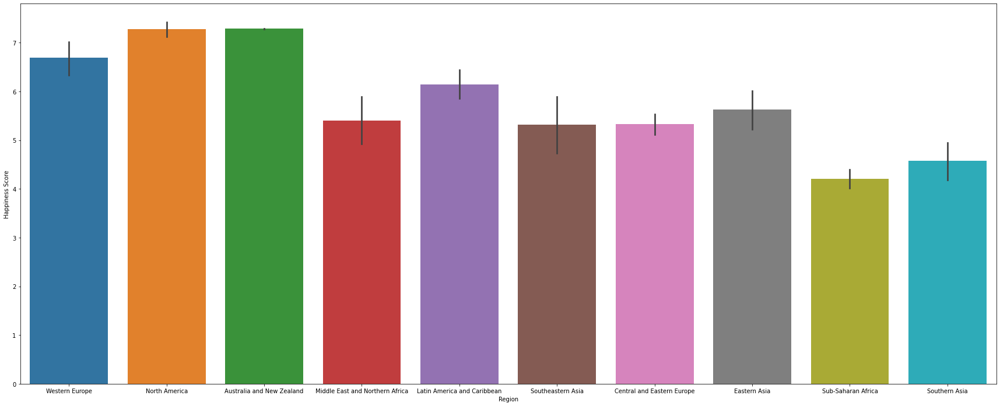

In [117]:
plt.figure(figsize=(30,12))
sns.barplot(x="Region", y="Happiness Score", data=df_worldHappiness_2015)

<AxesSubplot:xlabel='Happiness Score', ylabel='Country'>

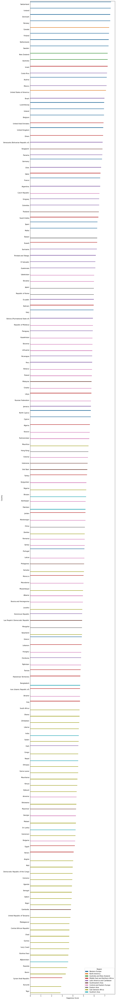

In [118]:
plt.figure(figsize=(10,120))
sns.barplot(y="Country", x="Happiness Score",hue='Region', data=df_worldHappiness_2015)

In [119]:

fig=px.choropleth(data_frame=df_worldHappiness_2015, locations='Country',locationmode='country names',
                    color_continuous_scale='Electric',color='Happiness Score',
                    hover_name='Country',
                    hover_data=['Happiness Score','Standard Error','Happiness Rank','Economy (GDP per Capita)',
                                'Family','Health (Life Expectancy)','Freedom','Trust (Government Corruption)',
                               'Generosity','Dystopia Residual'],
                   scope='world',projection='natural earth')



fig.show()

<AxesSubplot:>

<Figure size 1008x504 with 0 Axes>

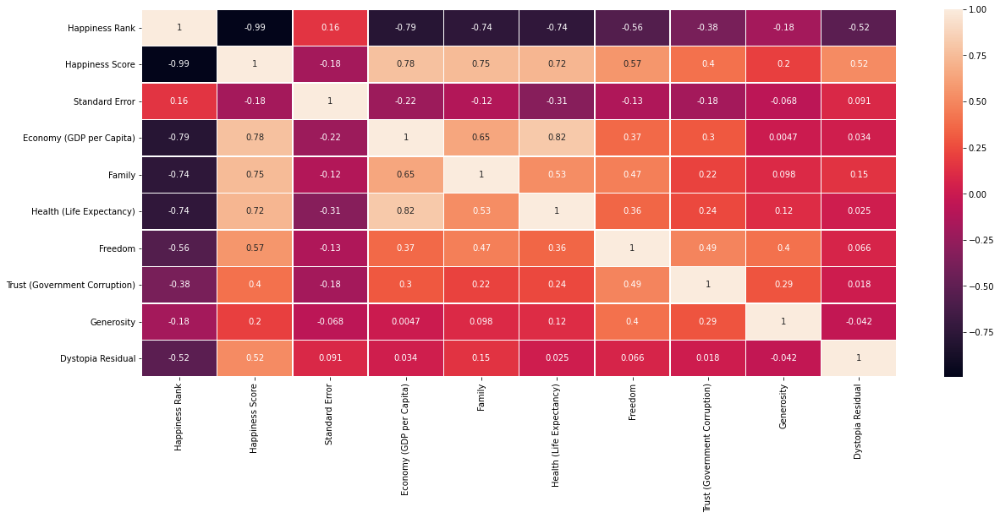

In [120]:
plt.figure(figsize=(14,7))

corr = df_worldHappiness_2015.corr()
f, ax = plt.subplots(figsize=(20, 8))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr,linewidths=.5, annot= True)

<AxesSubplot:xlabel='Dystopia Residual', ylabel='Happiness Score'>

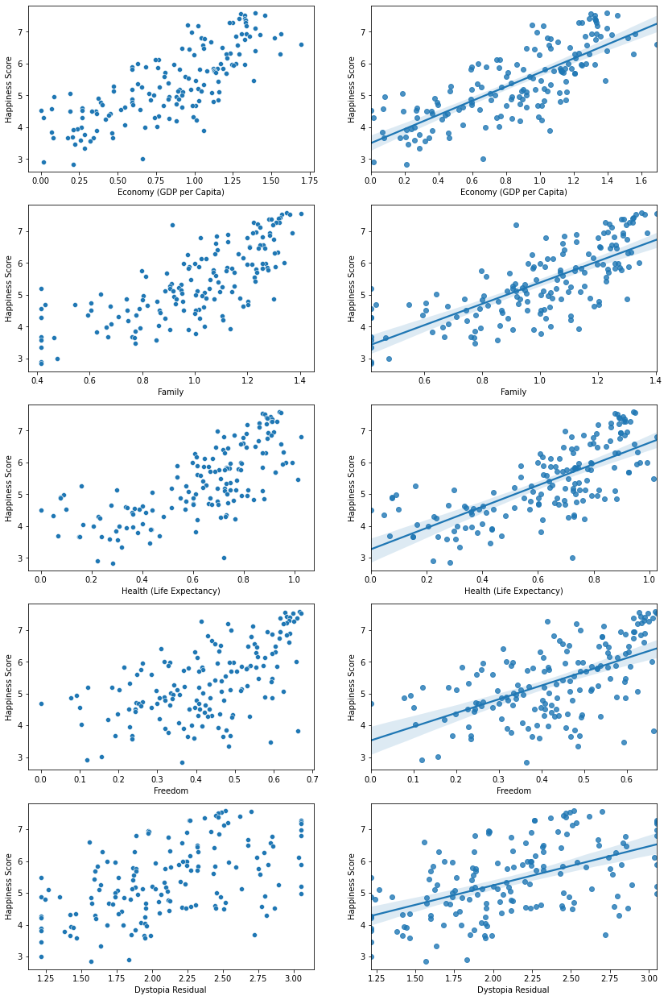

In [121]:
fig = plt.figure(figsize=(14,22))

plt.subplot(5,2,1)
sns.scatterplot(y='Happiness Score',x='Economy (GDP per Capita)', data=df_worldHappiness_2015)
plt.subplot(5,2,2)
sns.regplot(y='Happiness Score',x='Economy (GDP per Capita)', data=df_worldHappiness_2015)


plt.subplot(5,2,3)
sns.scatterplot(y='Happiness Score',x='Family', data=df_worldHappiness_2015)
plt.subplot(5,2,4)
sns.regplot(y='Happiness Score',x='Family', data=df_worldHappiness_2015)

plt.subplot(5,2,5)
sns.scatterplot(y='Happiness Score',x='Health (Life Expectancy)', data=df_worldHappiness_2015)
plt.subplot(5,2,6)
sns.regplot(y='Happiness Score',x='Health (Life Expectancy)', data=df_worldHappiness_2015)

plt.subplot(5,2,7)
sns.scatterplot(y='Happiness Score',x='Freedom', data=df_worldHappiness_2015)
plt.subplot(5,2,8)
sns.regplot(y='Happiness Score',x='Freedom', data=df_worldHappiness_2015)

plt.subplot(5,2,9)
sns.scatterplot(y='Happiness Score',x='Dystopia Residual', data=df_worldHappiness_2015)
plt.subplot(5,2,10)
sns.regplot(y='Happiness Score',x='Dystopia Residual', data=df_worldHappiness_2015)

<AxesSubplot:xlabel='Health (Life Expectancy)', ylabel='Economy (GDP per Capita)'>

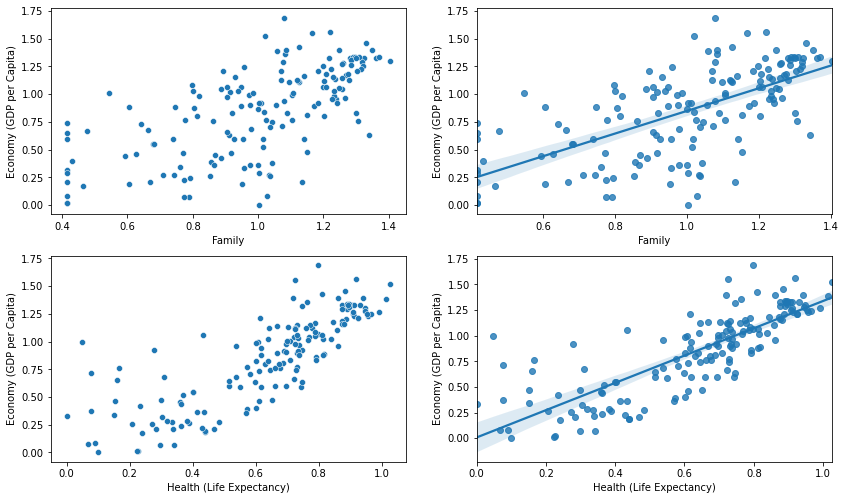

In [122]:
fig = plt.figure(figsize=(14,22))

plt.subplot(5,2,1)
sns.scatterplot(y='Economy (GDP per Capita)',x='Family', data=df_worldHappiness_2015)
plt.subplot(5,2,2)
sns.regplot(y='Economy (GDP per Capita)',x='Family', data=df_worldHappiness_2015)


plt.subplot(5,2,3)
sns.scatterplot(y='Economy (GDP per Capita)',x='Health (Life Expectancy)', data=df_worldHappiness_2015)
plt.subplot(5,2,4)
sns.regplot(y='Economy (GDP per Capita)',x='Health (Life Expectancy)', data=df_worldHappiness_2015)



<AxesSubplot:xlabel='Freedom', ylabel='Trust (Government Corruption)'>

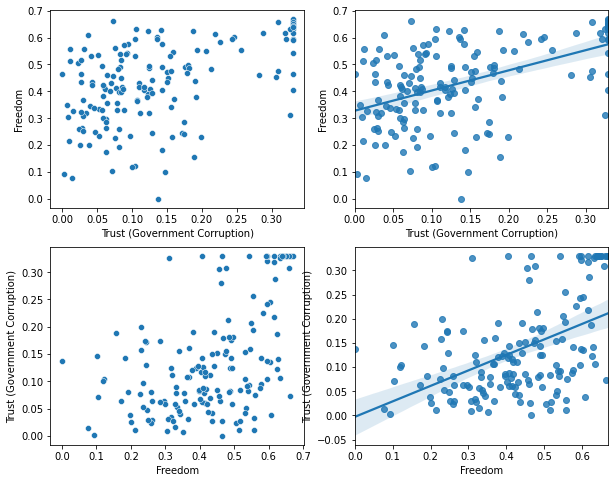

In [123]:
fig = plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
sns.scatterplot(y='Freedom',x='Trust (Government Corruption)', data=df_worldHappiness_2015)
plt.subplot(2,2,2)
sns.regplot(y='Freedom',x='Trust (Government Corruption)', data=df_worldHappiness_2015)


plt.subplot(2,2,3)
sns.scatterplot(x='Freedom',y='Trust (Government Corruption)', data=df_worldHappiness_2015)
plt.subplot(2,2,4)
sns.regplot(x='Freedom',y='Trust (Government Corruption)', data=df_worldHappiness_2015)

# Life Expectancy Data Visualization

# As Shown Below
- Developed Countries Tend To Have Better Life Expectancy Value

<AxesSubplot:xlabel='Life_Expectancy', ylabel='Country'>

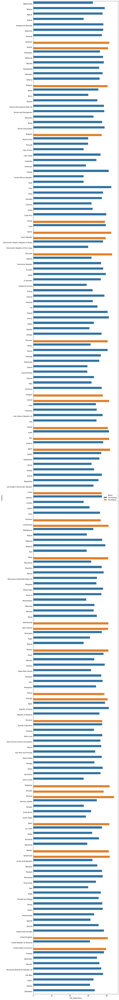

In [124]:
plt.figure(figsize=(10,120))
sns.barplot(y="Country", x="Life_Expectancy",hue='Status', data=df_life_expectancy_2015_Cleaned)

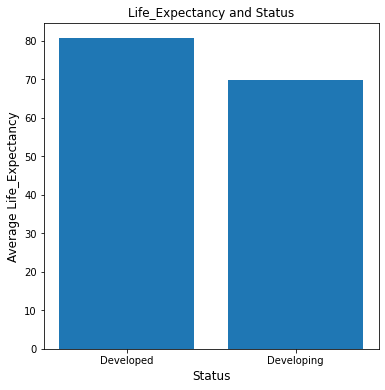

In [125]:
plt.figure(figsize=(6,6))
plt.bar(df_life_expectancy_2015_Cleaned.groupby('Status')['Status'].count().index,df_life_expectancy_2015_Cleaned.groupby('Status')['Life_Expectancy'].mean())
plt.xlabel("Status",fontsize=12)
plt.ylabel("Average Life_Expectancy",fontsize=12)
plt.title("Life_Expectancy and Status")
plt.show()

In [126]:

fig=px.choropleth(data_frame=df_life_expectancy_2015_Cleaned, locations='Country',locationmode='country names',
                    color_continuous_scale='Electric',color='Life_Expectancy',
                    hover_name='Country',
                    hover_data=['Life_Expectancy'],
                   scope='world',projection='natural earth')



fig.show()

<AxesSubplot:>

<Figure size 1008x504 with 0 Axes>

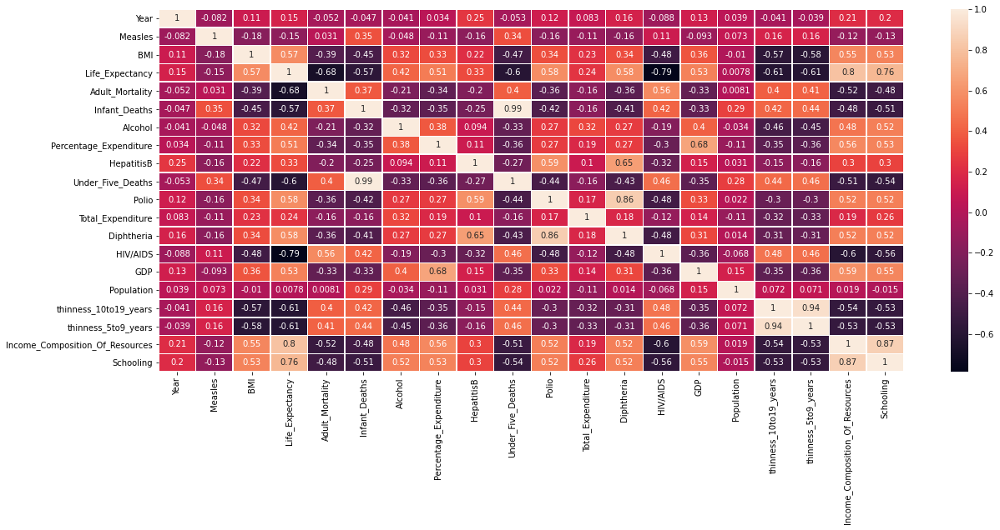

In [127]:
plt.figure(figsize=(14,7))

corr = df_life_expectancy_Cleaned.corr()
f, ax = plt.subplots(figsize=(20, 8))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr,linewidths=.5, annot= True)

# Correlation Between Life Expectancy Data
### As Shown Above:
- It is clear that there is a strong correlation between life expectancy and (schooling and income_composition).
- Also there is a positive correlation between life expectancy and (Polio and HepatitisB) Immunization.
- A strong correlation between the income_composition and schooling.

# More Corelations for the year 2015:
- Infant_Deaths and Under_Five_Deaths are correlated.
- HIV has negative relation with Life_Expectancy.
- Adult_Mortality has negative relation with Life_Expectancy.

<AxesSubplot:>

<Figure size 720x720 with 0 Axes>

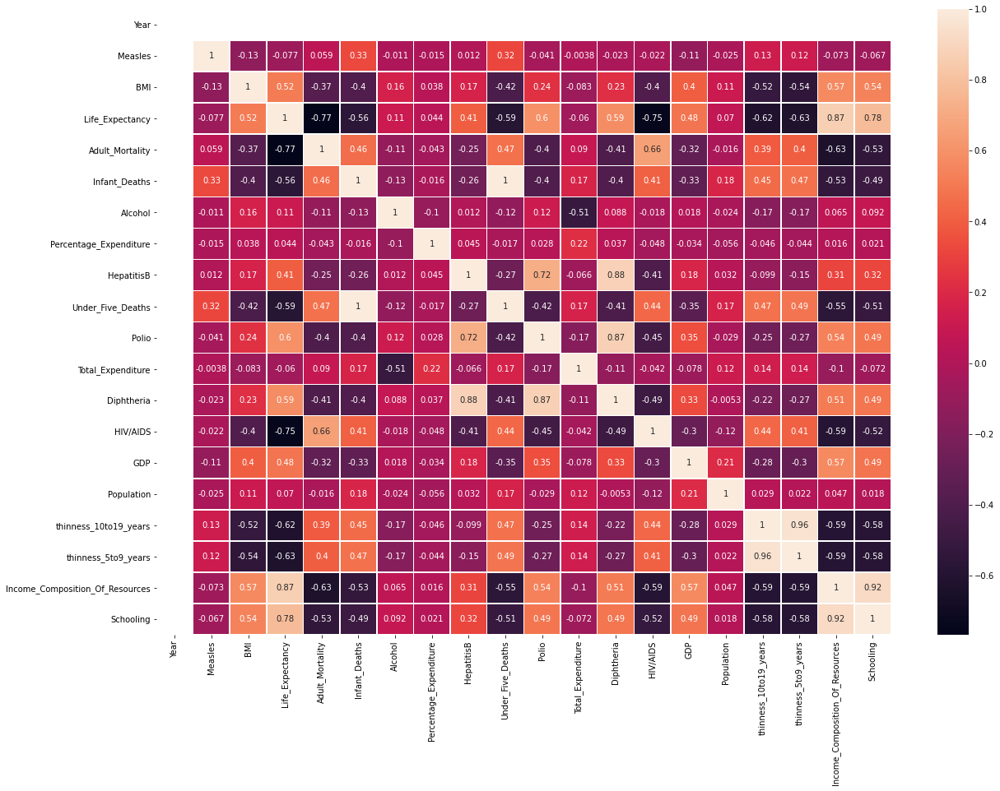

In [128]:
plt.figure(figsize=(10,10))

corr = df_life_expectancy_2015_Cleaned.corr()
f, ax = plt.subplots(figsize=(20, 14))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr,linewidths=.5, annot= True)

<AxesSubplot:xlabel='HepatitisB', ylabel='Life_Expectancy'>

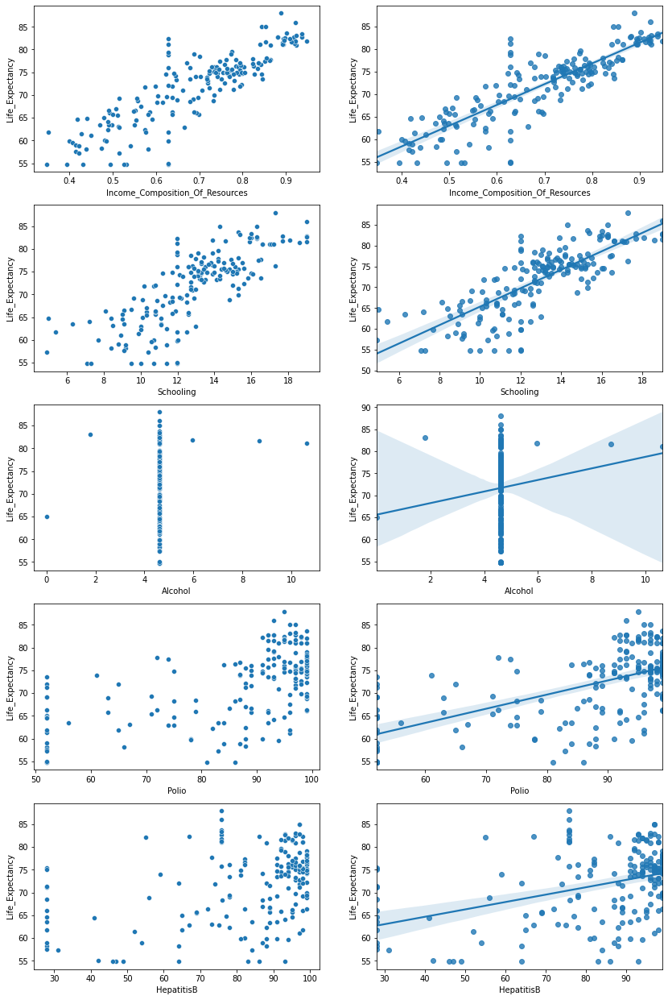

In [129]:
fig = plt.figure(figsize=(14,22))

plt.subplot(5,2,1)
sns.scatterplot(y='Life_Expectancy',x='Income_Composition_Of_Resources', data=df_life_expectancy_2015_Cleaned)
plt.subplot(5,2,2)
sns.regplot(y='Life_Expectancy',x='Income_Composition_Of_Resources', data=df_life_expectancy_2015_Cleaned)


plt.subplot(5,2,3)
sns.scatterplot(y='Life_Expectancy',x='Schooling', data=df_life_expectancy_2015_Cleaned)
plt.subplot(5,2,4)
sns.regplot(y='Life_Expectancy',x='Schooling', data=df_life_expectancy_2015_Cleaned)

plt.subplot(5,2,5)
sns.scatterplot(y='Life_Expectancy',x='Alcohol', data=df_life_expectancy_2015_Cleaned)
plt.subplot(5,2,6)
sns.regplot(y='Life_Expectancy',x='Alcohol', data=df_life_expectancy_2015_Cleaned)

plt.subplot(5,2,7)
sns.scatterplot(y='Life_Expectancy',x='Polio', data=df_life_expectancy_2015_Cleaned)
plt.subplot(5,2,8)
sns.regplot(y='Life_Expectancy',x='Polio', data=df_life_expectancy_2015_Cleaned)

plt.subplot(5,2,9)
sns.scatterplot(y='Life_Expectancy',x='HepatitisB', data=df_life_expectancy_2015_Cleaned)
plt.subplot(5,2,10)
sns.regplot(y='Life_Expectancy',x='HepatitisB', data=df_life_expectancy_2015_Cleaned)

# From the above plots :
- Unexpectedly alcohol does not affect the life expectancy measurements
- Polio also does not signifcantly have a strong impact on the life expectancy rate.

<AxesSubplot:xlabel='BMI', ylabel='Life_Expectancy'>

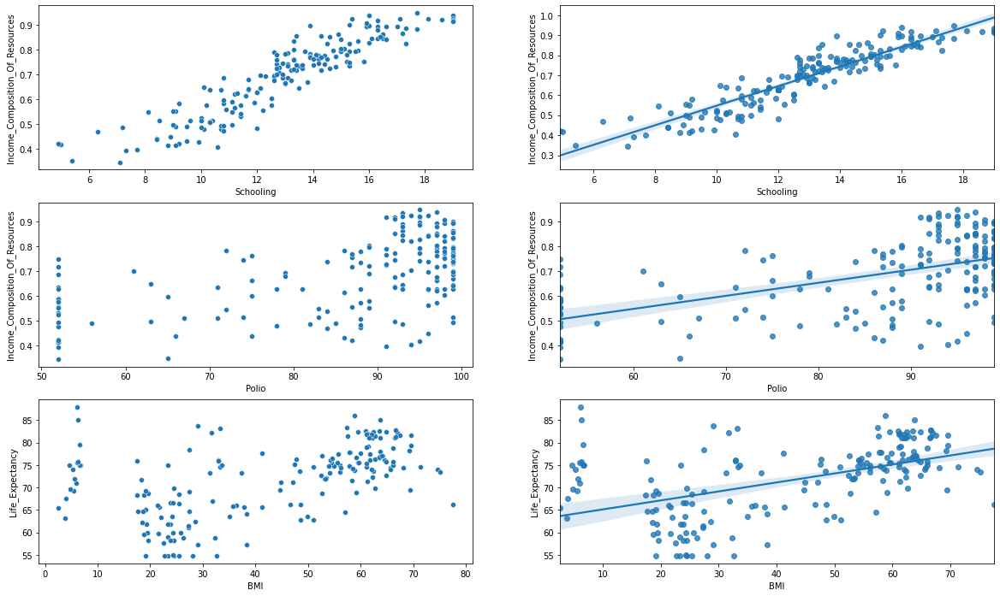

In [130]:
fig = plt.figure(figsize=(20,12))
plt.subplot(3,2,1)
sns.scatterplot(y='Income_Composition_Of_Resources',x='Schooling', data=df_life_expectancy_2015_Cleaned)
plt.subplot(3,2,2)
sns.regplot(y='Income_Composition_Of_Resources',x='Schooling', data=df_life_expectancy_2015_Cleaned)


plt.subplot(3,2,3)
sns.scatterplot(y='Income_Composition_Of_Resources',x='Polio', data=df_life_expectancy_2015_Cleaned)
plt.subplot(3,2,4)
sns.regplot(y='Income_Composition_Of_Resources',x='Polio', data=df_life_expectancy_2015_Cleaned)
plt.subplot(3,2,5)
sns.scatterplot(y='Life_Expectancy',x='BMI', data=df_life_expectancy_2015_Cleaned)
plt.subplot(3,2,6)
sns.regplot(y='Life_Expectancy',x='BMI', data=df_life_expectancy_2015_Cleaned)

# Observing the attributes that have a correlation with the Life Expectancy
- We can see that schooling has a positive relation with the Income Composition
- And a slightly negative impact between Schooling and Adult Mortality
- And also a negative relation between Income Compostion and Adult Mortality (Meaning that as the income increasing the deat of people between 15 and 60 years tend to decrease)

Text(0.5, 1.0, 'BMI vs Income_Comp_Of_Resources')

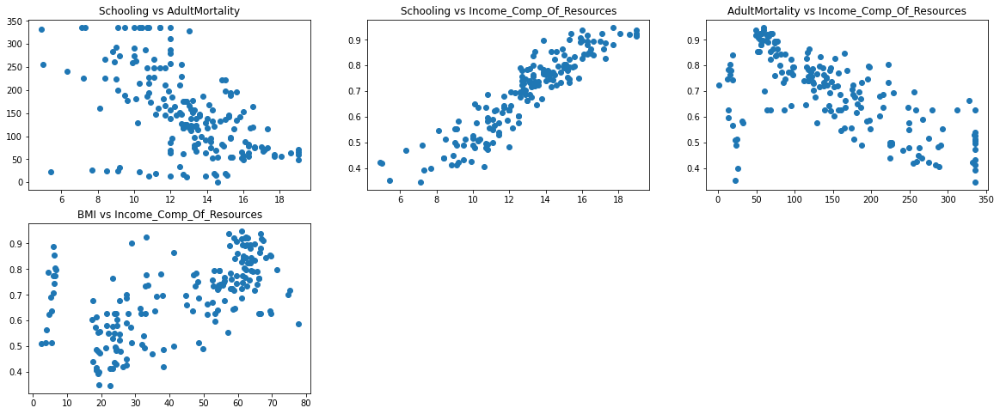

In [131]:
plt.figure(figsize=(20,8))
plt.subplot(2,3,1)
plt.scatter(df_life_expectancy_2015_Cleaned["Schooling"], df_life_expectancy_2015_Cleaned["Adult_Mortality"])
plt.title("Schooling vs AdultMortality")

plt.subplot(2,3,2)
plt.scatter(df_life_expectancy_2015_Cleaned["Schooling"], df_life_expectancy_2015_Cleaned["Income_Composition_Of_Resources"])
plt.title("Schooling vs Income_Comp_Of_Resources")

plt.subplot(2,3,3)
plt.scatter(df_life_expectancy_2015_Cleaned["Adult_Mortality"], df_life_expectancy_2015_Cleaned["Income_Composition_Of_Resources"])
plt.title("AdultMortality vs Income_Comp_Of_Resources")
plt.subplot(2,3,4)
plt.scatter(df_life_expectancy_2015_Cleaned["BMI"], df_life_expectancy_2015_Cleaned["Income_Composition_Of_Resources"])
plt.title("BMI vs Income_Comp_Of_Resources")

# Correlation Between All Countries & World Of Happiness 

### As shown below:
- There is a Strong correlation between Literacy Rate and Economy
- The hexmap also indicates that not much countries have (relative) average in both, they either have both high or both low

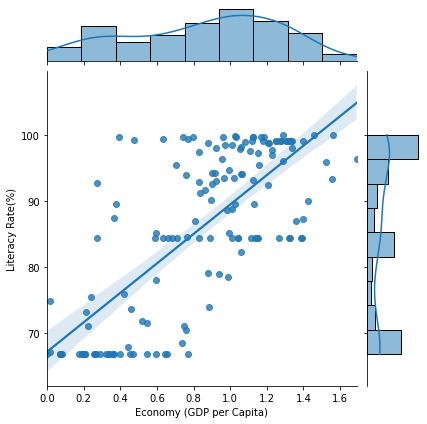

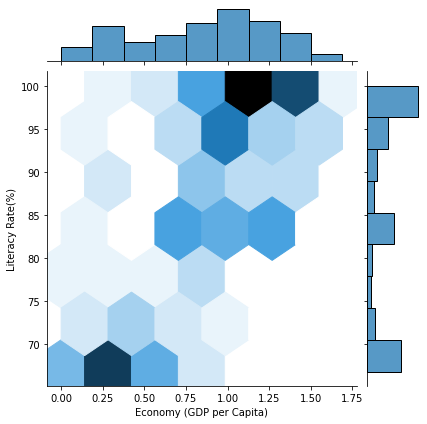

In [132]:
sns.jointplot(y='Literacy Rate(%)',x='Economy (GDP per Capita)',data=df_all_countries_world_happiness,kind='reg')
plt.show()

sns.jointplot(y='Literacy Rate(%)',x='Economy (GDP per Capita)',data=df_all_countries_world_happiness,kind='hex')
plt.show()

- There is a strong positive correlation between literacy rate and happiness score

<AxesSubplot:xlabel='Happiness Score', ylabel='Literacy Rate(%)'>

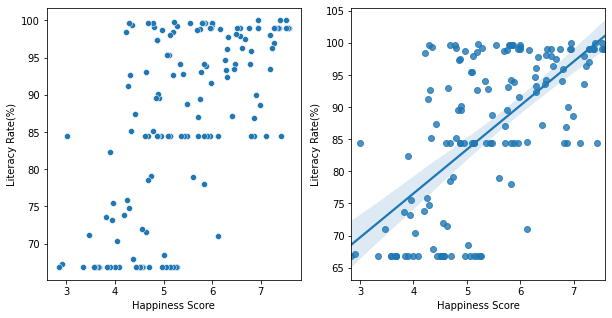

In [133]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
sns.scatterplot(y='Literacy Rate(%)',x='Happiness Score', data=df_all_countries_world_happiness)
plt.subplot(1,2,2)
sns.regplot(y='Literacy Rate(%)',x='Happiness Score', data=df_all_countries_world_happiness)

- It is clear that the highest Happiness Score region is Australia nad New Zealand, and the near second is Northern America
- The lowest regions in Happiness Score are the ones in Africa (specially Middle Africa), along with Southern Asia

<AxesSubplot:xlabel='Happiness Score', ylabel='Subregion'>

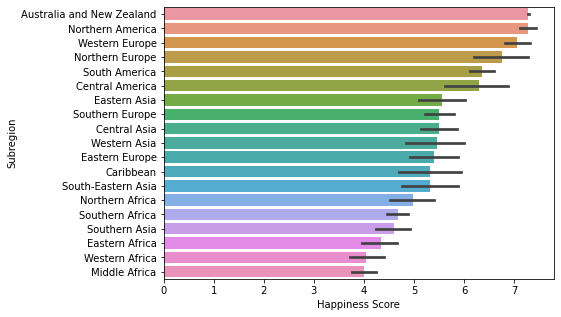

In [134]:
# storing the order of the subregions according to the mean of the happiness score
temp_sort = df_all_countries_world_happiness.groupby(["Subregion"])['Happiness Score'].aggregate(np.mean).reset_index().sort_values('Happiness Score', ascending=False)
temp_sort.set_index('Subregion')

fig = plt.figure(figsize=(7,5))
sns.barplot(y='Subregion', x='Happiness Score', data=df_all_countries_world_happiness, orient='h', order=temp_sort['Subregion'])

- In order to show the correlation between the Freedom and Government Corruption, and the Happiness Score, we first need to aggregate all these variables into a new DataFrame

In [135]:
temp_aggregate = pd.merge(temp_sort, df_all_countries_world_happiness.groupby(["Subregion"])['Freedom'].aggregate(np.mean).reset_index())
temp_aggregate = pd.merge(temp_aggregate, df_all_countries_world_happiness.groupby(["Subregion"])['Trust (Government Corruption)'].aggregate(np.mean).reset_index())
temp_aggregate.head(10)

,Subregion,Happiness Score,Freedom,Trust (Government Corruption)
0,Australia and New Zealand,7.285000,0.645310,0.329570
1,Northern America,7.273000,0.589505,0.244235
2,Western Europe,7.053286,0.610124,0.259190
3,Northern Europe,6.754700,0.542240,0.229290
4,South America,6.348636,0.505392,0.122159
5,Central America,6.295429,0.513533,0.126507
6,Eastern Asia,5.554600,0.488572,0.129186
7,Southern Europe,5.504750,0.335396,0.051063
8,Central Asia,5.495600,0.511546,0.178856
9,Western Asia,5.455687,0.381831,0.201904


- Then we display the Freedom and Government Corruption of each Subregion in the same order as the original plot of Subregions vs Happiness Score to spot the correlation if it exists


**Results:**
- It appears that there is a positive correlation between the Freedom and Happiness Score for each Subregion, which is evident from having the Freedom values distribution very similar to the one of Happiness Score
- A positive correlation between Government Corruption and Hapiness Score is noticed for highest and lowest Subregions in Hapiness Score, but this correlation is not consistent for middle values

<AxesSubplot:xlabel='Trust (Government Corruption)', ylabel='Subregion'>

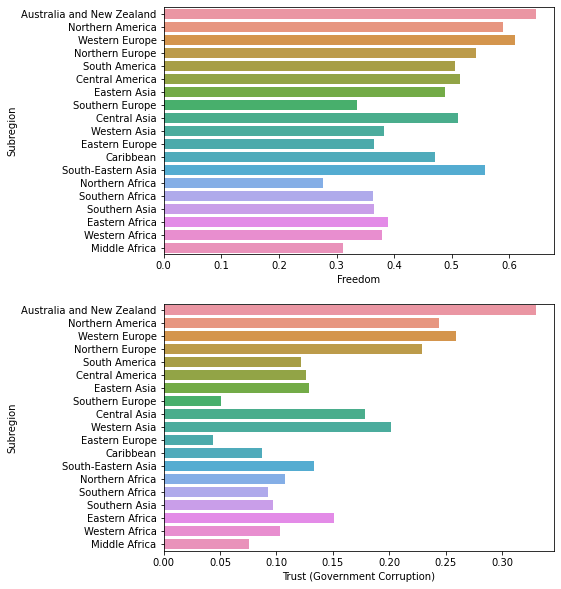

In [136]:
fig = plt.figure(figsize=(7,10))

plt.subplot(2,1,1)
sns.barplot(y='Subregion', x='Freedom', data=temp_aggregate, orient='h', order=temp_sort['Subregion'])
plt.subplot(2,1,2)
sns.barplot(y='Subregion', x='Trust (Government Corruption)', data=temp_aggregate, orient='h', order=temp_sort['Subregion'])

# Correlation Between Life Expectancy & World Of Happiness 

- As shown below there is a positive correlation between life expectancy of a country and its happiness score.

<AxesSubplot:xlabel='Happiness Score', ylabel='Life_Expectancy'>

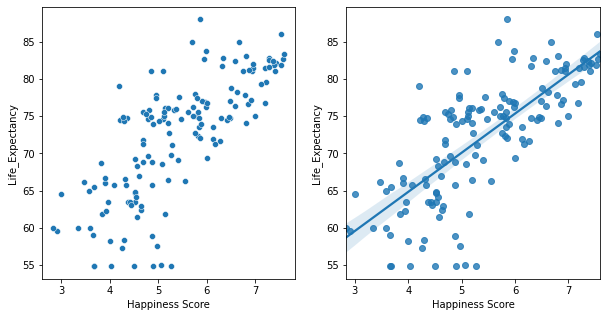

In [137]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
sns.scatterplot(y='Life_Expectancy',x='Happiness Score', data=df_all_integrated)
plt.subplot(1,2,2)
sns.regplot(y='Life_Expectancy',x='Happiness Score', data=df_all_integrated)


- We will try to see if polio and hepatitisB immunization system affect the life expectancy that would inturn affect (Decrease or Increase) the happiness

- Getting the average of both polio and hepatitisB to see if both of them affect the life expectancy or not

In [138]:
df_all_integrated['Polio_HepatitisB_Avg'] = df_all_integrated[['Polio', 'HepatitisB']].mean(axis=1)
df_all_integrated

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population_x,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Region_x,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Region_y,Subregion,Population_y,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),Polio_HepatitisB_Avg
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,Southern Asia,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210,Asia,Southern Asia,27657145,652230.0,30.900000,3.100000,66.800000,6.800000,23.000000,58.500000
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894,Europe,Southern Europe,2886026,28748.0,34.500000,0.700000,98.700000,1.700000,16.900000,99.000000
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209,Africa,Northern Africa,40400000,1240192.0,35.300000,3.100000,79.000000,3.900000,10.300000,95.000000
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939,Africa,Middle Africa,25868000,1240192.0,45.700000,5.600000,70.400000,7.100000,14.770671,58.000000
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600,Americas,South America,43590400,1240192.0,44.500000,3.500000,97.900000,7.100000,7.500000,93.500000
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,Central and Eastern Europe,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873,Asia,Western Asia,2994400,29743.0,30.900000,3.609697,99.400000,4.383436,14.770671,95.000000
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,Oceania,Australia and New Zealand,24117360,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000,93.000000
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,Western Europe,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320,Europe,Western Europe,8725931,83871.0,30.900000,0.600000,98.000000,2.100000,4.900000,93.000000
8,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,Central and Eastern Europe,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073,Asia,Western Asia,9730500,86600.0,33.700000,5.800000,99.800000,2.400000,6.000000,97.000000
9,Bahrain,2015,Developing,0,63.600000,76.9,69.0,0,4.602166,0.000000,98.000000,0,98.0,5.922512,98.0,0.1,13235.977570,1.275338e+07,6.200000

- As you can see below there is zero correlation between the freedom and the life expectancy which tells us that life does not highly depend on freedom.
- Polio and Hepatitis have a positive relation with life expectancy which in turn affects the happiness score.

<AxesSubplot:xlabel='Polio_HepatitisB_Avg', ylabel='Happiness Score'>

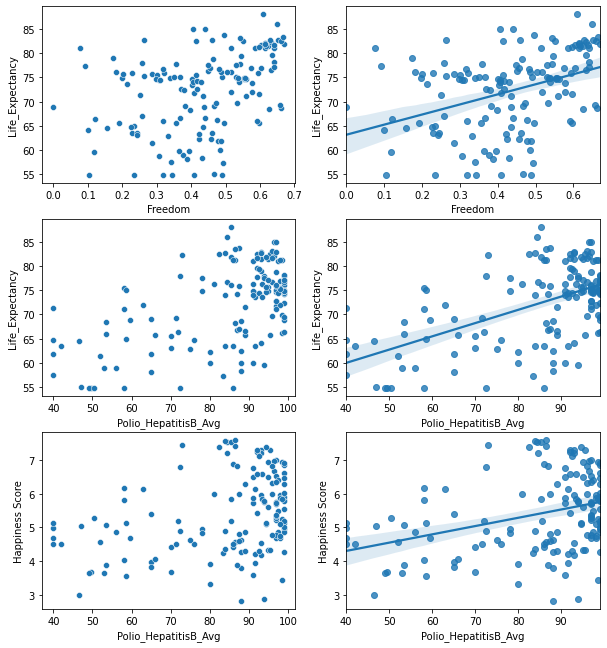

In [139]:
fig = plt.figure(figsize=(10,15))

plt.subplot(4,2,1)
sns.scatterplot(y='Life_Expectancy',x='Freedom', data=df_all_integrated)
plt.subplot(4,2,2)
sns.regplot(y='Life_Expectancy',x='Freedom', data=df_all_integrated)


plt.subplot(4,2,3)
sns.scatterplot(y='Life_Expectancy',x='Polio_HepatitisB_Avg', data=df_all_integrated)
plt.subplot(4,2,4)
sns.regplot(y='Life_Expectancy',x='Polio_HepatitisB_Avg', data=df_all_integrated)

plt.subplot(4,2,5)
sns.scatterplot(y='Happiness Score',x='Polio_HepatitisB_Avg', data=df_all_integrated)
plt.subplot(4,2,6)
sns.regplot(y='Happiness Score',x='Polio_HepatitisB_Avg', data=df_all_integrated)

# Feature Engineering
#### We should start by separating the columns that has a correlation and its the data to be used for the feature engineering since it is the data that answers the questions we're seeking to find an answer for.

### All Countries Features

In [140]:
df_all_countries_features = df_250_countries_cleaned[['Country','Population','Area','Gini','Literacy Rate(%)','Unemployement(%)']]
df_250_countries_cleaned

,Country,Region,Subregion,Population,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%)
0,Afghanistan,Asia,Southern Asia,27657145,6.522300e+05,30.900000,3.100000,66.800000,6.800000,23.000000
1,Åland Islands,Europe,Northern Europe,28875,1.580000e+03,40.177124,3.609697,84.408314,4.383436,14.770671
2,Albania,Europe,Southern Europe,2886026,2.874800e+04,34.500000,0.700000,98.700000,1.700000,16.900000
3,Algeria,Africa,Northern Africa,40400000,1.240192e+06,35.300000,3.100000,79.000000,3.900000,10.300000
4,American Samoa,Oceania,Polynesia,57100,1.990000e+02,40.177124,3.000000,97.000000,4.383436,14.770671
5,Andorra,Europe,Southern Europe,78014,4.680000e+02,40.177124,0.600000,100.000000,1.100000,4.000000
6,Angola,Africa,Middle Africa,25868000,1.240192e+06,45.700000,5.600000,70.400000,7.100000,14.770671
7,Anguilla,Americas,Caribbean,13452,9.100000e+01,40.177124,2.800000,84.408314,3.100000,8.000000
8,Antarctica,Polar,NaN,1000,1.240192e+06,40.177124,3.609697,84.408314,4.383436,14.770671
9,Antigua and Barbuda,Americas,Caribbean,86295,4.420000e+02,40.177124,1.700000,99.000000,3.000000,11.000000


#### 1st feature: Population/Area
We will add a column that will represent the population divided by area of each country

In [141]:
df_all_countries_features['Population/Area'] = (df_all_countries_features['Population'])/(df_all_countries_features['Area'])
df_all_countries_features

/home/mado/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Country,Population,Area,Gini,Literacy Rate(%),Unemployement(%),Population/Area
0,Afghanistan,27657145,6.522300e+05,30.900000,66.800000,23.000000,42.403976
1,Åland Islands,28875,1.580000e+03,40.177124,84.408314,14.770671,18.275316
2,Albania,2886026,2.874800e+04,34.500000,98.700000,16.900000,100.390497
3,Algeria,40400000,1.240192e+06,35.300000,79.000000,10.300000,32.575601
4,American Samoa,57100,1.990000e+02,40.177124,97.000000,14.770671,286.934673
5,Andorra,78014,4.680000e+02,40.177124,100.000000,4.000000,166.696581
6,Angola,25868000,1.240192e+06,45.700000,70.400000,14.770671,20.858061
7,Anguilla,13452,9.100000e+01,40.177124,84.408314,8.000000,147.824176
8,Antarctica,1000,1.240192e+06,40.177124,84.408314,14.770671,0.000806
9,Antigua and Barbuda,86295,4.420000e+02,40.177124,99.000000,11.000000,195.237557


#### Using this feature we can answer two questions:


- Is there a relation between the amount of population per kilometer squared and Unemployement(%)?

<AxesSubplot:xlabel='Population/Area', ylabel='Unemployement(%)'>

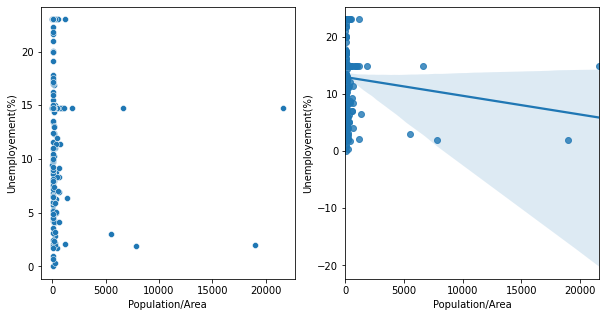

In [142]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
sns.scatterplot(x='Population/Area',y='Unemployement(%)', data=df_all_countries_features)
plt.subplot(1,2,2)
sns.regplot(x='Population/Area',y='Unemployement(%)', data=df_all_countries_features)


There is a negative relation between the amount of population per kilometer squared and Unemployement(%)



- Is there a relation between the amount of population per kilometer squared and Literacy Rate(%)?

<AxesSubplot:xlabel='Population/Area', ylabel='Literacy Rate(%)'>

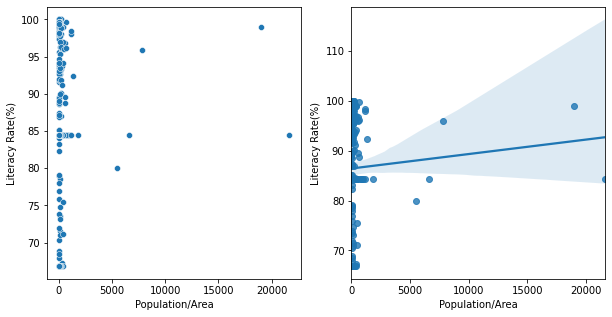

In [143]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
sns.scatterplot(x='Population/Area',y='Literacy Rate(%)', data=df_all_countries_features)
plt.subplot(1,2,2)
sns.regplot(x='Population/Area',y='Literacy Rate(%)', data=df_all_countries_features)


There is a positive relation between the amount of population per kilometer squared and Literacy Rate(%)

### Life Expectancy Features

In [144]:
df_life_expectancy_feature = df_life_expectancy_Cleaned[['Country','Status','Life_Expectancy','Income_Composition_Of_Resources','HIV/AIDS','Adult_Mortality','BMI']]
df_life_expectancy_feature_2015= df_life_expectancy_2015_Cleaned[['Country','Status','Life_Expectancy','Income_Composition_Of_Resources','HIV/AIDS','Adult_Mortality','BMI']]
df_life_expectancy_feature_2015

,Country,Status,Life_Expectancy,Income_Composition_Of_Resources,HIV/AIDS,Adult_Mortality,BMI
0,Afghanistan,Developing,65.0,0.479000,0.1,263.0,19.100000
16,Albania,Developing,77.8,0.762000,0.1,74.0,58.000000
32,Algeria,Developing,75.6,0.743000,0.1,19.0,59.500000
48,Angola,Developing,54.8,0.531000,1.7,335.0,23.300000
64,Antigua and Barbuda,Developing,76.4,0.784000,0.2,13.0,47.700000
80,Argentina,Developing,76.3,0.826000,0.1,116.0,62.800000
96,Armenia,Developing,74.8,0.741000,0.1,118.0,54.900000
112,Australia,Developed,82.8,0.937000,0.1,59.0,66.600000
128,Austria,Developed,81.5,0.892000,0.1,65.0,57.600000
144,Azerbaijan,Developing,72.7,0.758000,0.1,118.0,52.500000


# Starting with converting the categorical values to numerical values
- Status can be transferred to one hot encoding where 1 means Developing and 0 means Developed which would give us a better visualization and help us when we need to apply machine learning techniques.

In [145]:
df_life_expectancy_feature = pd.concat([df_life_expectancy_feature,pd.get_dummies(df_life_expectancy_feature['Status'],drop_first=True)],axis=1)
df_life_expectancy_feature_engineering = df_life_expectancy_feature.drop('Status',axis=1)
df_life_expectancy_feature_2015 = pd.concat([df_life_expectancy_feature_2015,pd.get_dummies(df_life_expectancy_feature_2015['Status'],drop_first=True)],axis=1)
df_life_expectancy_feature_engineering_2015 = df_life_expectancy_feature_2015.drop('Status',axis=1)
df_life_expectancy_feature_engineering_2015

,Country,Life_Expectancy,Income_Composition_Of_Resources,HIV/AIDS,Adult_Mortality,BMI,Developing
0,Afghanistan,65.0,0.479000,0.1,263.0,19.100000,1
16,Albania,77.8,0.762000,0.1,74.0,58.000000,1
32,Algeria,75.6,0.743000,0.1,19.0,59.500000,1
48,Angola,54.8,0.531000,1.7,335.0,23.300000,1
64,Antigua and Barbuda,76.4,0.784000,0.2,13.0,47.700000,1
80,Argentina,76.3,0.826000,0.1,116.0,62.800000,1
96,Armenia,74.8,0.741000,0.1,118.0,54.900000,1
112,Australia,82.8,0.937000,0.1,59.0,66.600000,0
128,Austria,81.5,0.892000,0.1,65.0,57.600000,0
144,Azerbaijan,72.7,0.758000,0.1,118.0,52.500000,1


- Create an indicator feature that tells us whether the person is overweight or not based on a threshold.
- Where 1 is overweight and 0 is underweight

In [146]:
df_life_expectancy_feature_engineering['Obesity_Indicator'] = (df_life_expectancy_feature_engineering['BMI'] >= 25)*1
df_life_expectancy_feature_engineering_2015['Obesity_Indicator'] = (df_life_expectancy_feature_engineering_2015['BMI'] >= 25)*1
df_life_expectancy_feature_engineering_2015

,Country,Life_Expectancy,Income_Composition_Of_Resources,HIV/AIDS,Adult_Mortality,BMI,Developing,Obesity_Indicator
0,Afghanistan,65.0,0.479000,0.1,263.0,19.100000,1,0
16,Albania,77.8,0.762000,0.1,74.0,58.000000,1,1
32,Algeria,75.6,0.743000,0.1,19.0,59.500000,1,1
48,Angola,54.8,0.531000,1.7,335.0,23.300000,1,0
64,Antigua and Barbuda,76.4,0.784000,0.2,13.0,47.700000,1,1
80,Argentina,76.3,0.826000,0.1,116.0,62.800000,1,1
96,Armenia,74.8,0.741000,0.1,118.0,54.900000,1,1
112,Australia,82.8,0.937000,0.1,59.0,66.600000,0,1
128,Austria,81.5,0.892000,0.1,65.0,57.600000,0,1
144,Azerbaijan,72.7,0.758000,0.1,118.0,52.500000,1,1


# Showing the positive relation between Income_Composition_Of_Resources and Obesity
- Where the increase in the Income_Composition_Of_Resources tends to increase the Obesity of people

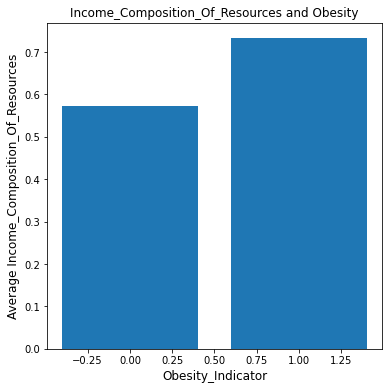

In [147]:
countOverWeight = df_life_expectancy_feature_engineering_2015[(df_life_expectancy_feature_engineering_2015['Obesity_Indicator']==1)]
countUnderWeight = df_life_expectancy_feature_engineering_2015[(df_life_expectancy_feature_engineering_2015['Obesity_Indicator']==0)]
plt.figure(figsize=(6,6))
plt.bar(df_life_expectancy_feature_engineering_2015.groupby('Obesity_Indicator')['Obesity_Indicator'].count().index,df_life_expectancy_feature_engineering_2015.groupby('Obesity_Indicator')['Income_Composition_Of_Resources'].mean())
plt.xlabel("Obesity_Indicator",fontsize=12)
plt.ylabel("Average Income_Composition_Of_Resources",fontsize=12)
plt.title("Income_Composition_Of_Resources and Obesity")
plt.show()

In [148]:
df_feature_integration = pd.merge(df_life_expectancy_feature_engineering_2015,df_all_countries_features,on="Country")
df_feature_integration

,Country,Life_Expectancy,Income_Composition_Of_Resources,HIV/AIDS,Adult_Mortality,BMI,Developing,Obesity_Indicator,Population,Area,Gini,Literacy Rate(%),Unemployement(%),Population/Area
0,Afghanistan,65.0,0.479000,0.1,263.0,19.100000,1,0,27657145,652230.0,30.900000,66.800000,23.000000,42.403976
1,Albania,77.8,0.762000,0.1,74.0,58.000000,1,1,2886026,28748.0,34.500000,98.700000,16.900000,100.390497
2,Algeria,75.6,0.743000,0.1,19.0,59.500000,1,1,40400000,1240192.0,35.300000,79.000000,10.300000,32.575601
3,Angola,54.8,0.531000,1.7,335.0,23.300000,1,0,25868000,1240192.0,45.700000,70.400000,14.770671,20.858061
4,Antigua and Barbuda,76.4,0.784000,0.2,13.0,47.700000,1,1,86295,442.0,40.177124,99.000000,11.000000,195.237557
5,Argentina,76.3,0.826000,0.1,116.0,62.800000,1,1,43590400,1240192.0,44.500000,97.900000,7.500000,35.148106
6,Armenia,74.8,0.741000,0.1,118.0,54.900000,1,1,2994400,29743.0,30.900000,99.400000,14.770671,100.675789
7,Australia,82.8,0.937000,0.1,59.0,66.600000,0,1,24117360,1240192.0,30.900000,99.000000,5.700000,19.446473
8,Austria,81.5,0.892000,0.1,65.0,57.600000,0,1,8725931,83871.0,30.900000,98.000000,4.900000,104.039907
9,Azerbaijan,72.7,0.758000,0.1,118.0,52.500000,1,1,9730500,86600.0,33.700000,99.800000,6.000000,112.361432


In [149]:
df_all_integrated = df_all_integrated.drop(columns=['Population_y', 'Region_x'])
df_all_integrated = df_all_integrated.rename(columns={'Population_x':'Population','Region_y':'Region'})
df_all_integrated

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Region,Subregion,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),Polio_HepatitisB_Avg
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210,Asia,Southern Asia,652230.0,30.900000,3.100000,66.800000,6.800000,23.000000,58.500000
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894,Europe,Southern Europe,28748.0,34.500000,0.700000,98.700000,1.700000,16.900000,99.000000
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209,Africa,Northern Africa,1240192.0,35.300000,3.100000,79.000000,3.900000,10.300000,95.000000
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939,Africa,Middle Africa,1240192.0,45.700000,5.600000,70.400000,7.100000,14.770671,58.000000
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600,Americas,South America,1240192.0,44.500000,3.500000,97.900000,7.100000,7.500000,93.500000
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873,Asia,Western Asia,29743.0,30.900000,3.609697,99.400000,4.383436,14.770671,95.000000
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,Oceania,Australia and New Zealand,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000,93.000000
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320,Europe,Western Europe,83871.0,30.900000,0.600000,98.000000,2.100000,4.900000,93.000000
8,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073,Asia,Western Asia,86600.0,33.700000,5.800000,99.800000,2.400000,6.000000,97.000000
9,Bahrain,2015,Developing,0,63.600000,76.9,69.0,0,4.602166,0.000000,98.000000,0,98.0,5.922512,98.0,0.1,13235.977570,1.275338e+07,6.200000,6.100000,0.823000,14.500000,49,5.960,0.05412,1.32376,1.21624,0.74716,0.45492,0.30600,0.17362,1.73797,Asia,Western Asia,765.0,40.177124,3.609697,84.408314,4.383436,14.770671,98.000000


In [150]:
df_all_integrated['Population/Area'] = (df_all_integrated['Population'])/(df_all_integrated['Area'])
df_all_integrated


,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Region,Subregion,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),Polio_HepatitisB_Avg,Population/Area
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210,Asia,Southern Asia,652230.0,30.900000,3.100000,66.800000,6.800000,23.000000,58.500000,28.049325
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894,Europe,Southern Europe,28748.0,34.500000,0.700000,98.700000,1.700000,16.900000,99.000000,1.004348
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209,Africa,Northern Africa,1240192.0,35.300000,3.100000,79.000000,3.900000,10.300000,95.000000,14.751434
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939,Africa,Middle Africa,1240192.0,45.700000,5.600000,70.400000,7.100000,14.770671,58.000000,2.246374
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600,Americas,South America,1240192.0,44.500000,3.500000,97.900000,7.100000,7.500000,93.500000,14.751434
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873,Asia,Western Asia,29743.0,30.900000,3.609697,99.400000,4.383436,14.770671,95.000000,9.807182
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,Oceania,Australia and New Zealand,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000,93.000000,14.751434
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320,Europe,Western Europe,83871.0,30.900000,0.600000,98.000000,2.100000,4.900000,93.000000,102.933898
8,Azerbaijan,2015,Developing,0,52.500000,72.7,118.0,5,4.602166,0.000000,96.000000,6,98.0,5.922512,96.0,0.1,55.313820,9.649341e+06,2.800000,2.900000,0.758000,12.700000,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073,Asia,Western Asia,86600.0,33.700000,5.800000,99.800000,2.400000,6.000000,97.000000,111.424261
9,Bahrain,2015,Developing,0,63.600000,76.9,69.0,0,4.602166,0.000000,98.000000,0,98.0,5.922512,98.0,0.1,13235.977570,1.275338e+07,6.200000,6.100000,0.823000,14.500000,49,5.960,0.05412,1.32376,1.21624,0.74716,0.45492,0.30600,0.17362,1.73797,Asia,Western Asia,765.0,40.177124,3.609697,84.408314,4.383436,14.770671,98.000000,16671.078588


# Using One Hot Encoding For Regions and Subregions Since They Correlate with each others and other attributes such as population

In [151]:
df_all_integrated = pd.get_dummies(df_all_integrated, columns=['Subregion','Region'], drop_first=False)
df_all_integrated

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),Polio_HepatitisB_Avg,Population/Area,Subregion_Australia and New Zealand,Subregion_Caribbean,Subregion_Central America,Subregion_Central Asia,Subregion_Eastern Africa,Subregion_Eastern Asia,Subregion_Eastern Europe,Subregion_Middle Africa,Subregion_Northern Africa,Subregion_Northern America,Subregion_Northern Europe,Subregion_South America,Subregion_South-Eastern Asia,Subregion_Southern Africa,Subregion_Southern Asia,Subregion_Southern Europe,Subregion_Western Africa,Subregion_Western Asia,Subregion_Western Europe,Region_Africa,Region_Americas,Region_Asia,Region_Europe,Region_Oceania
0,Afghanistan,2015,Developing,1154,19.100000,65.0,263.0,55,0.010000,71.279624,65.000000,70,52.0,8.160000,65.0,0.1,584.259210,1.829461e+07,9.700000,9.700000,0.479000,10.100000,153,3.575,0.03084,0.31982,0.41411,0.30335,0.23414,0.09719,0.36510,1.95210,652230.0,30.900000,3.100000,66.800000,6.800000,23.000000,58.500000,28.049325,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
1,Albania,2015,Developing,0,58.000000,77.8,74.0,0,4.600000,364.975229,99.000000,0,99.0,6.000000,99.0,0.1,3954.227830,2.887300e+04,1.200000,1.300000,0.762000,14.200000,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894,28748.0,34.500000,0.700000,98.700000,1.700000,16.900000,99.000000,1.004348,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,Algeria,2015,Developing,63,59.500000,75.6,19.0,21,4.602166,0.000000,95.000000,24,95.0,5.922512,95.0,0.1,4132.762920,1.829461e+07,6.000000,5.800000,0.743000,14.400000,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209,1240192.0,35.300000,3.100000,79.000000,3.900000,10.300000,95.000000,14.751434,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,Angola,2015,Developing,118,23.300000,54.8,335.0,55,4.602166,0.000000,64.000000,70,52.0,5.922512,64.0,1.7,3695.793748,2.785935e+06,8.300000,8.200000,0.531000,11.400000,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939,1240192.0,45.700000,5.600000,70.400000,7.100000,14.770671,58.000000,2.246374,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,Argentina,2015,Developing,0,62.800000,76.3,116.0,8,4.602166,0.000000,94.000000,9,93.0,5.922512,94.0,0.1,13235.977570,1.829461e+07,1.000000,0.900000,0.826000,17.300000,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600,1240192.0,44.500000,3.500000,97.900000,7.100000,7.500000,93.500000,14.751434,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
5,Armenia,2015,Developing,33,54.900000,74.8,118.0,1,4.602166,0.000000,94.000000,1,96.0,5.922512,94.0,0.1,369.654776,2.916950e+05,2.100000,2.200000,0.741000,12.700000,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873,29743.0,30.900000,3.609697,99.400000,4.383436,14.770671,95.000000,9.807182,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
6,Australia,2015,Developed,74,66.600000,82.8,59.0,1,4.602166,0.000000,93.000000,1,93.0,5.922512,93.0,0.1,13235.977570,1.829461e+07,0.600000,0.600000,0.937000,19.000000,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.32957,0.42192,2.26646,1240192.0,30.900000,2.500000,99.000000,2.400000,5.700000,93.000000,14.751434,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7,Austria,2015,Developed,309,57.600000,81.5,65.0,0,4.602166,0.000000,93.000000,0,93.0,5.922512,93.0,0.1,13235.977570,8.633169e+06,1.900000,2.100000,0.892000,15.900000,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320,83871.0,30.900000,0.600000,98.000000,2.100000,4.900000,93.000000,102.9

<AxesSubplot:xlabel='Happiness Score', ylabel='Life_Expectancy'>

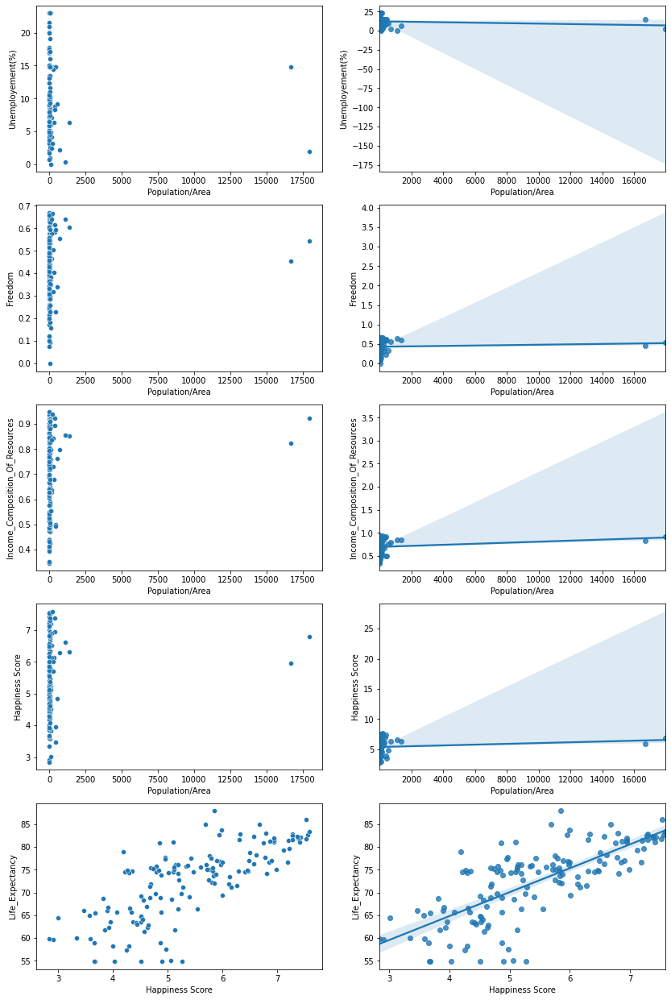

In [152]:
fig = plt.figure(figsize=(14,22))

plt.subplot(5,2,1)
sns.scatterplot(x='Population/Area',y='Unemployement(%)', data=df_all_integrated)
plt.subplot(5,2,2)
sns.regplot(x='Population/Area',y='Unemployement(%)', data=df_all_integrated)

plt.subplot(5,2,3)
sns.scatterplot(x='Population/Area',y='Freedom', data=df_all_integrated)
plt.subplot(5,2,4)
sns.regplot(x='Population/Area',y='Freedom', data=df_all_integrated)

plt.subplot(5,2,5)
sns.scatterplot(x='Population/Area',y='Income_Composition_Of_Resources', data=df_all_integrated)
plt.subplot(5,2,6)
sns.regplot(x='Population/Area',y='Income_Composition_Of_Resources', data=df_all_integrated)

plt.subplot(5,2,7)
sns.scatterplot(x='Population/Area',y='Happiness Score', data=df_all_integrated)
plt.subplot(5,2,8)
sns.regplot(x='Population/Area',y='Happiness Score', data=df_all_integrated)

plt.subplot(5,2,9)
sns.scatterplot(x='Happiness Score',y='Life_Expectancy', data=df_all_integrated)
plt.subplot(5,2,10)
sns.regplot(x='Happiness Score',y='Life_Expectancy', data=df_all_integrated)

# Observations:
- It is obvious now how the population per area significantly affects the countries assets from (Income , Freedom) which in turn affects the unemployment rates and eventually the happiness of that country.
- The last figure is a direct answer on the relation between happiness and life where its clear that there is a positive relation between the two ... which infact gives us some insights on what life expectancy depends on rather than the obvious aspects (Infections,Inflammations..etc)

In [153]:
df_max_happiness = df_all_integrated[df_all_integrated['Happiness Score'] == df_all_integrated['Happiness Score'].max()] 
x = df_max_happiness['Country'].values[0]
x

'Switzerland'

In [154]:
df_min_happiness = df_all_integrated[df_all_integrated['Happiness Score'] == df_all_integrated['Happiness Score'].min()] 
df_min_happiness

,Country,Year,Status,Measles,BMI,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percentage_Expenditure,HepatitisB,Under_Five_Deaths,Polio,Total_Expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,thinness_5to9_years,Income_Composition_Of_Resources,Schooling,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Area,Gini,Real Growth Rating(%),Literacy Rate(%),Inflation(%),Unemployement(%),Polio_HepatitisB_Avg,Population/Area,Subregion_Australia and New Zealand,Subregion_Caribbean,Subregion_Central America,Subregion_Central Asia,Subregion_Eastern Africa,Subregion_Eastern Asia,Subregion_Eastern Europe,Subregion_Middle Africa,Subregion_Northern Africa,Subregion_Northern America,Subregion_Northern Europe,Subregion_South America,Subregion_South-Eastern Asia,Subregion_Southern Africa,Subregion_Southern Asia,Subregion_Southern Europe,Subregion_Western Africa,Subregion_Western Asia,Subregion_Western Europe,Region_Africa,Region_Americas,Region_Asia,Region_Europe,Region_Oceania
130,Togo,2015,Developing,20,24.3,59.9,287.0,13,4.602166,0.0,88.0,20,88.0,5.922512,88.0,1.0,551.138346,741682.0,6.5,6.2,0.484,12.0,158,2.839,0.06727,0.20868,0.41411,0.28443,0.36453,0.10731,0.16681,1.56726,56785.0,34.4,5.5,66.8,2.2,14.770671,88.0,13.061231,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [155]:
df_all_integrated.to_csv('All_Integrated')